In [1]:
from pathlib import Path #Allows for easy path conversion to any OS

In [2]:
from XSpect_EW_class import *
from XSpect_EW_func import *


Working


In [3]:
#sunA
HebeA_1 = Path("/Users/georgevejar/Documents/GitHub/Spectrum_project/Testing_archive_data/HIRES_M67/Hebe_solar/2015_01_24/sss040_1-L.fits")
HebeA_2 = Path("/Users/georgevejar/Documents/GitHub/Spectrum_project/Testing_archive_data/HIRES_M67/Hebe_solar/2015_01_24/sss040_2-L.fits")
HebeA_3 = Path("/Users/georgevejar/Documents/GitHub/Spectrum_project/Testing_archive_data/HIRES_M67/Hebe_solar/2015_01_24/sss040_3-L.fits")

In [4]:
#sunA
HebeB_1 = Path("/Users/georgevejar/Documents/GitHub/Spectrum_project/Testing_archive_data/HIRES_M67/Hebe_solar/2015_01_25/sss1065_1-L.fits")
HebeB_2 = Path("/Users/georgevejar/Documents/GitHub/Spectrum_project/Testing_archive_data/HIRES_M67/Hebe_solar/2015_01_25/sss1065_2-L.fits")
HebeB_3 = Path("/Users/georgevejar/Documents/GitHub/Spectrum_project/Testing_archive_data/HIRES_M67/Hebe_solar/2015_01_25/sss1065_3-L.fits")

In [5]:
#sun
sun_blue = Path("../spectra_sample/Solar/sunb.fits")
sun_red = Path("../spectra_sample/Solar/sunr.fits")
sun_inf = Path("../spectra_sample/Solar/suni.fits")

In [6]:
HebeA_a = Spectrum_Data(HebeA_1)
HebeA_b = Spectrum_Data(HebeA_2)
HebeA_c = Spectrum_Data(HebeA_3)

CRVL stuff found
CRVL stuff found
CRVL stuff found


In [7]:
HebeB_a = Spectrum_Data(HebeB_1)
HebeB_b = Spectrum_Data(HebeB_2)
HebeB_c = Spectrum_Data(HebeB_3)

CRVL stuff found
CRVL stuff found
CRVL stuff found


In [8]:
sun_b = Spectrum_Data(sun_blue)
sun_r = Spectrum_Data(sun_red)
sun_i = Spectrum_Data(sun_inf)

CRVL stuff not found
CRVL stuff not found
CRVL stuff not found


In [9]:
#create temporary file to be erased and combined into, must normalize input files first
HebeA = Spectrum_Data(HebeA_1) 
HebeA = combine_files(HebeA,[HebeA_a, HebeA_b, HebeA_c])
del HebeA_a, HebeA_b, HebeA_c

CRVL stuff found


In [10]:
HebeB = Spectrum_Data(HebeB_1) 
HebeB = combine_files(HebeB,[HebeB_a, HebeB_b, HebeB_c])
del HebeB_a, HebeB_b, HebeB_c

CRVL stuff found


In [11]:
Sun = Spectrum_Data(sun_blue) 
Sun = combine_files(Sun,[sun_b,sun_r,sun_i])
del sun_b, sun_r, sun_i

CRVL stuff not found


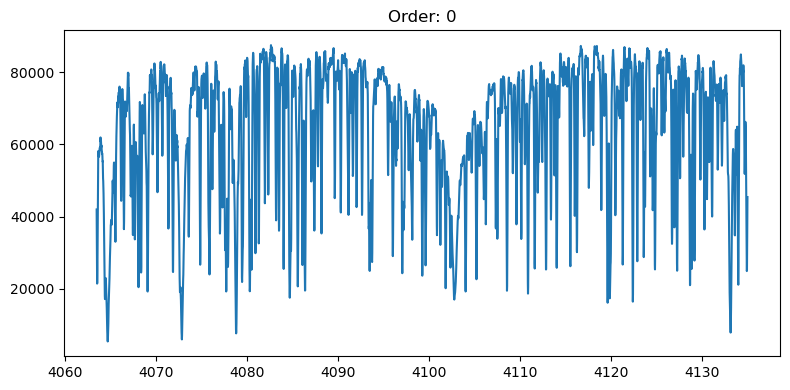

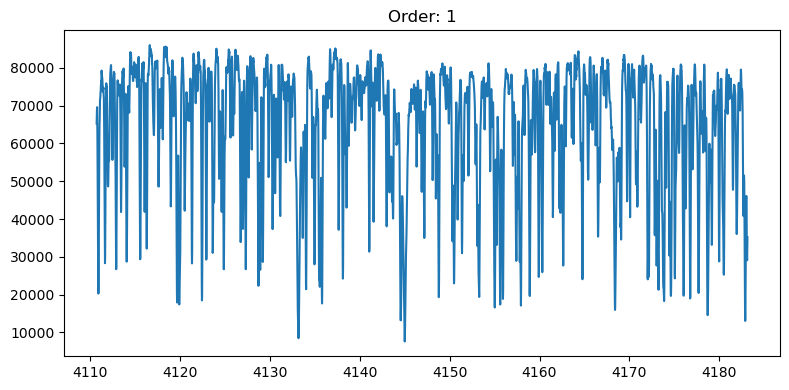

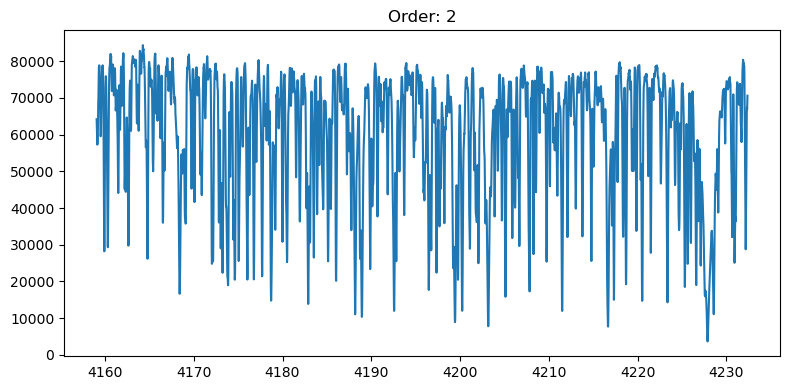

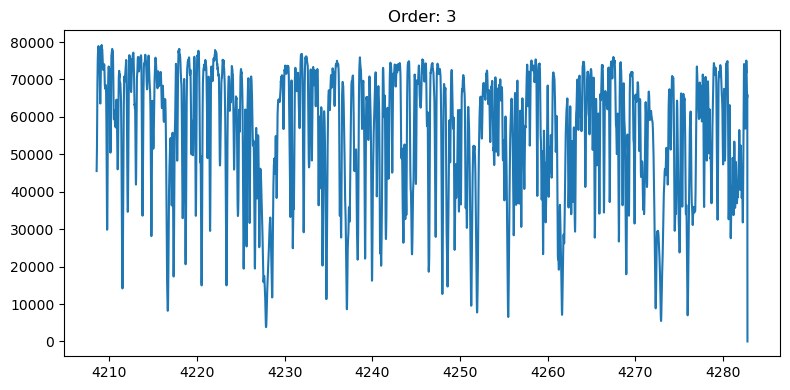

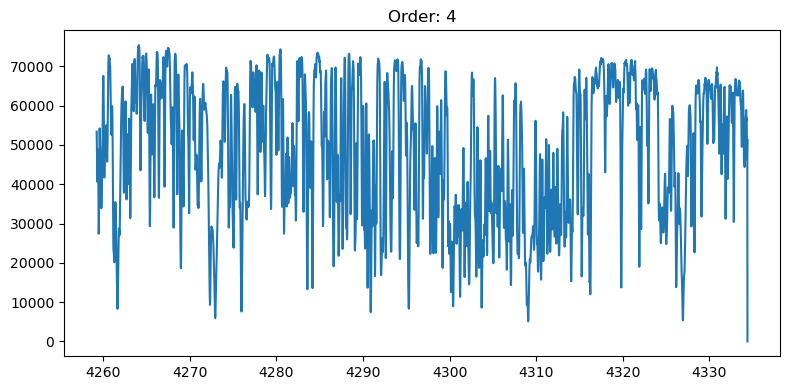

...

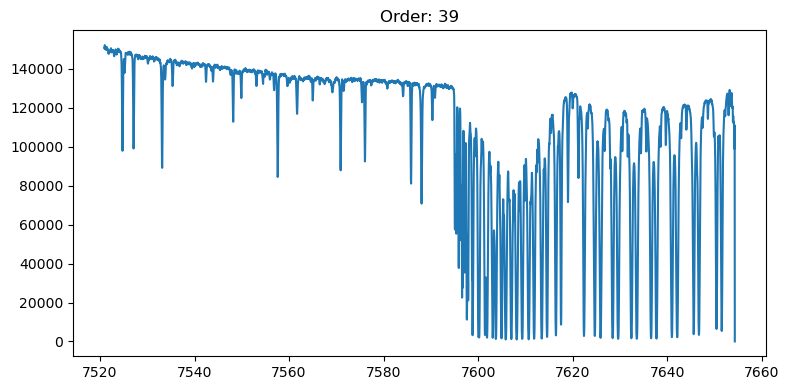

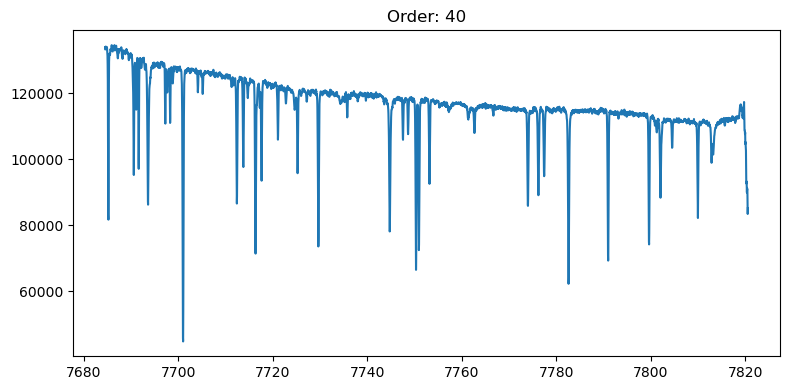

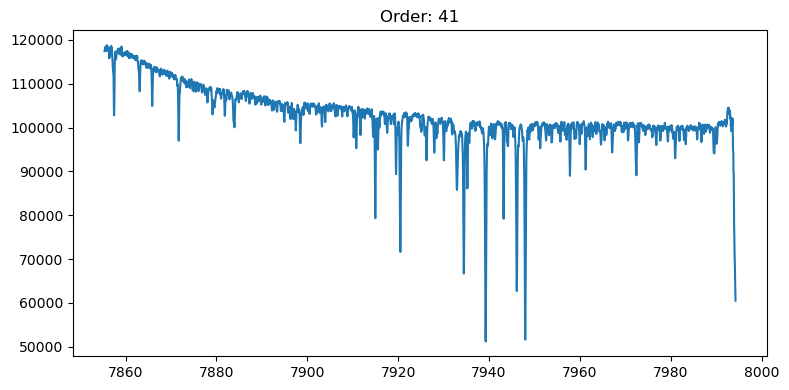

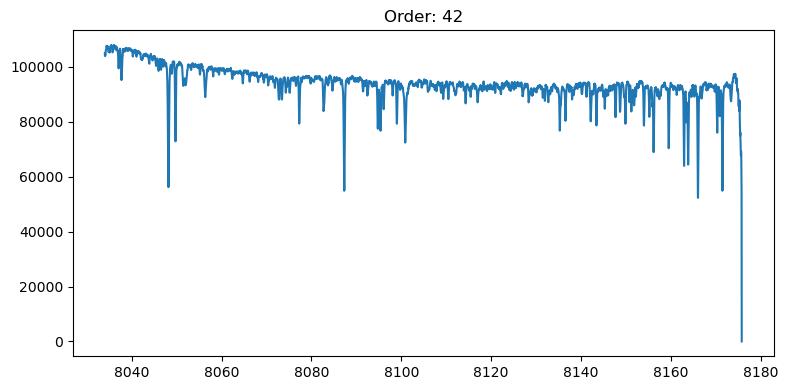

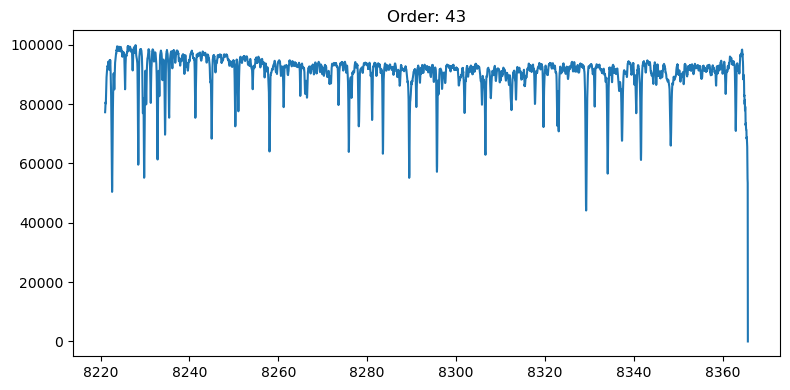

In [12]:
HebeA.check_spectra(norm=False)

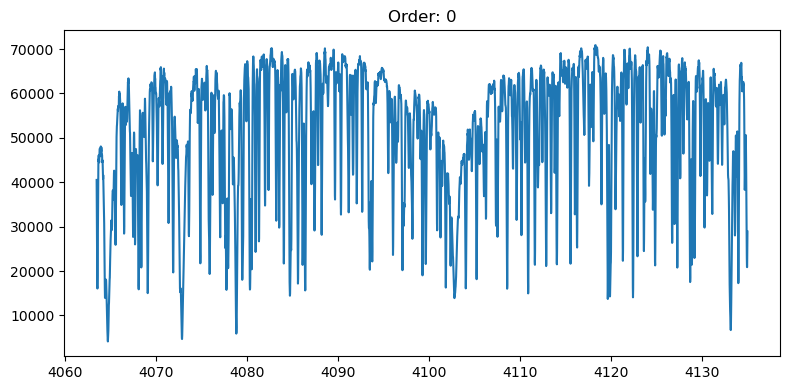

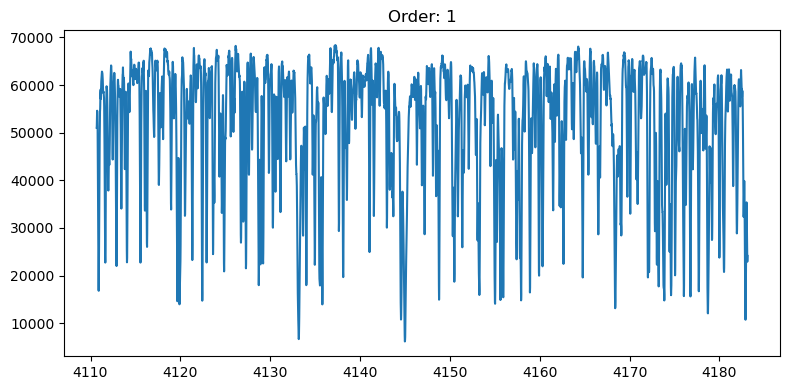

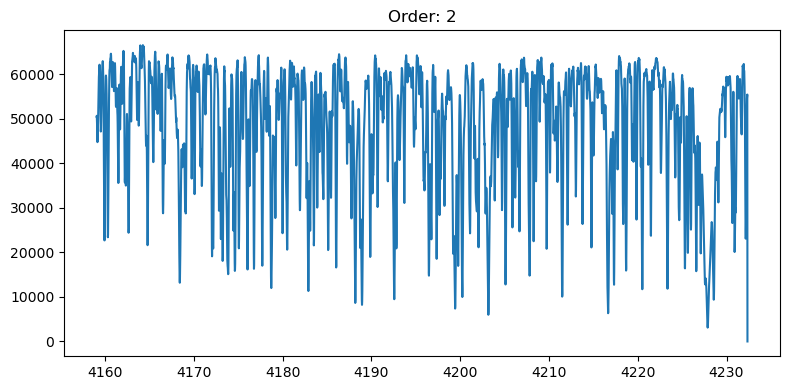

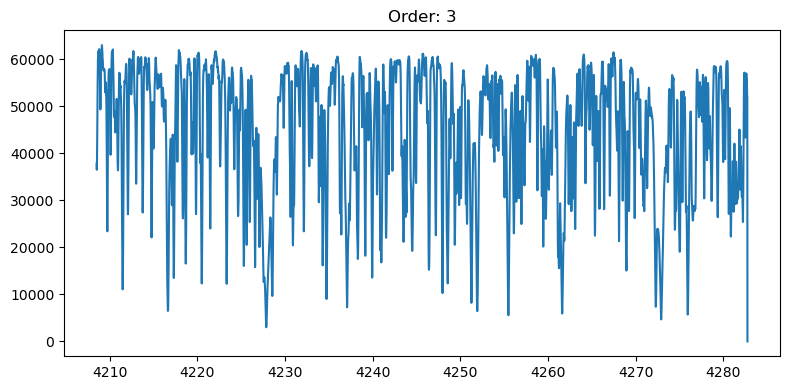

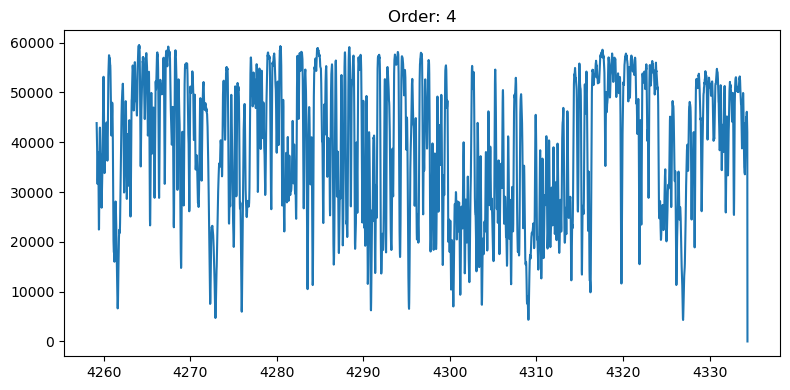

...

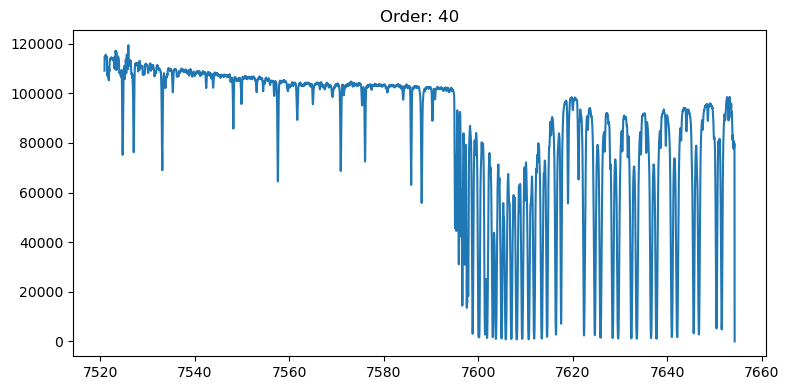

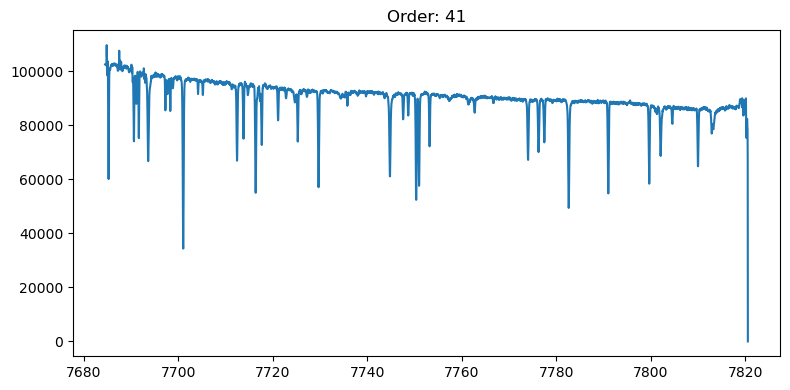

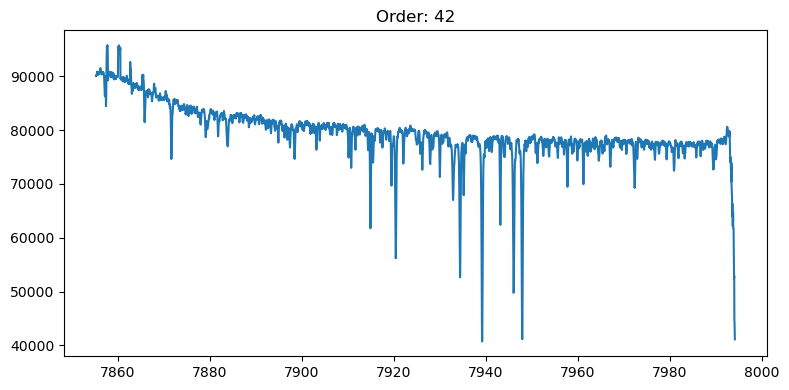

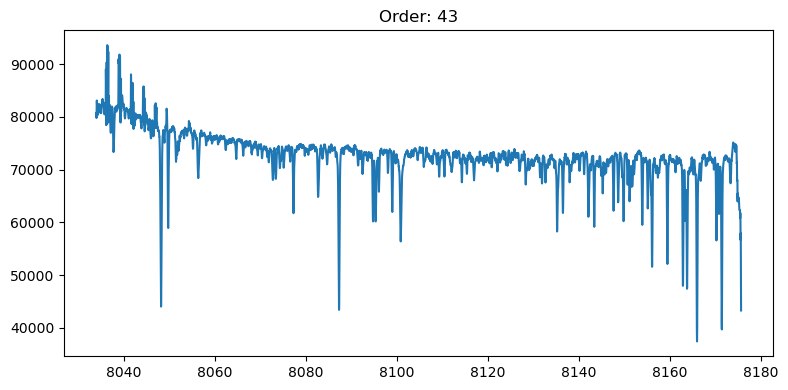

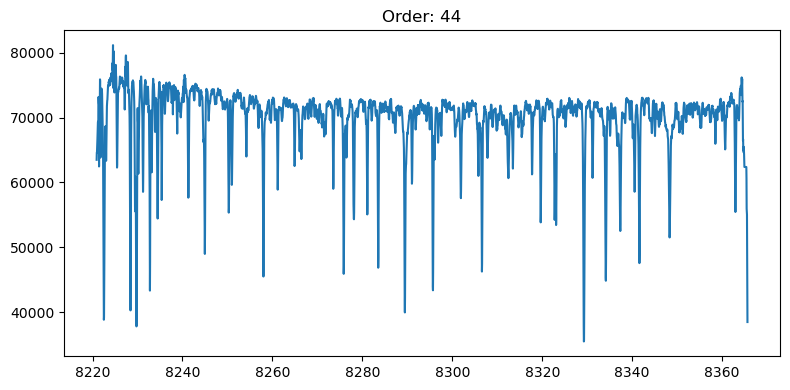

In [13]:
HebeB.check_spectra(norm=False)

In [14]:
def combine_spectra(spectA, spectB, resolution = 1000):
    copy = spectA.flux
    #find corresponding orders that match spectA in spectB
    med_A = [np.median(spectA.shifted_wavelength[i]) for i in range(len(spectA.shifted_wavelength))]
    med_B = [np.median(spectB.shifted_wavelength[i]) for i in range(len(spectB.shifted_wavelength))]
    b_order = []
    #find corresponding B order
    for k in range(len(med_A)):
        diff = abs(med_A[k] - med_B)
        loc = np.where(diff == diff.min())
        b_order.append(loc)
        
    combined_flux_orders = np.zeros_like(spectA.flux)
    #first shift A to match B with higher accuracy (higher resolution)
    #may have to include a try statement for errors
    spectA.estimate_shift([spectB], shift_spacing=resolution)
    #spectA.clean_shift()
    
    #loop through orders
    for i in range(len(spectA.shifted_wavelength)):
        
        #combining flux values for each wavelength value
        combined_flux = np.zeros(len(spectA.shifted_wavelength[i]))
        
        print('A order', i, 'B order', b_order[i][0][0])
        
        #loop through each shifted wavelength value
        for j in range(len(spectA.shifted_wavelength[i])):
            #difference between one shifted wavelength value and all B wavelength values
            #element closest to zero is location of closest wavelength values
            diff_array = abs(spectA.shifted_wavelength[i][j] - spectB.wavelength[b_order[i]])
            loc = np.where(diff_array == diff_array.min())
            #add A flux with B flux at location where diff = 0
            combined_flux[j] = spectA.flux[i][j] + spectB.flux[b_order[i]][loc]
        #print(combined_flux)
        #collect flux values for each order
        combined_flux_orders[i] = combined_flux
        
        plt.plot(spectA.shifted_wavelength[i], copy[i], marker = '.', label = 'A')
        plt.plot(spectB.wavelength[b_order[i][0][0]], spectB.flux[b_order[i][0][0]], marker = '.', label = 'B')
        plt.plot(spectA.shifted_wavelength[i], combined_flux, marker = '.', label = 'A+B')
        plt.xlim([np.median(spectA.shifted_wavelength[i]-1),np.median(spectA.shifted_wavelength[i]+1)])
        plt.grid()
        plt.legend()
        plt.show()
    #replace original flux for A with combined flux
    spectA.flux = combined_flux_orders
    
    return copy
    
    

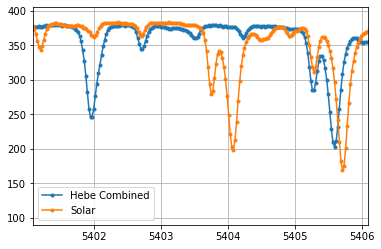

In [14]:
%matplotlib inline
order = 20
solar_order = order + 8 #if order is < 20 add 7, if order is >= 20 add 8

plt.plot(HebeA.wavelength[order], np.sqrt(HebeA.flux[order]), marker = '.', label = 'Hebe Combined')
plt.plot(Sun.wavelength[solar_order], np.sqrt(Sun.flux[solar_order]), marker = '.', label = 'Solar')
#plt.ylim([0,1.1])
plt.xlim([np.median(HebeA.wavelength[order]-2.5),np.median(HebeA.wavelength[order]+2.5)])
plt.grid()
plt.legend()
plt.show()

Use self.update_combined() when you are happy with the combined flux to override self.flux
A order 0 B order 0


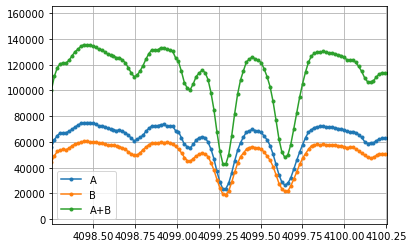

#-----------------------#
A order 1 B order 1


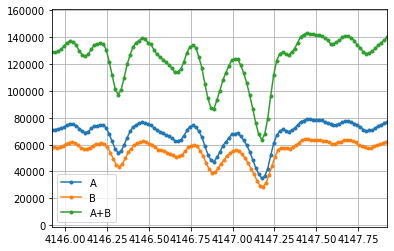

#-----------------------#
A order 2 B order 2


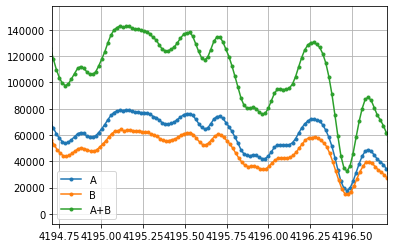

#-----------------------#
A order 3 B order 3


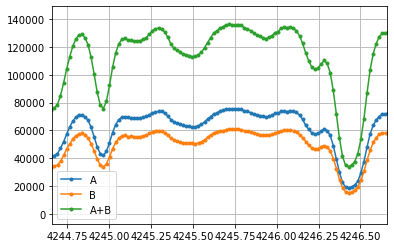

#-----------------------#
A order 4 B order 4


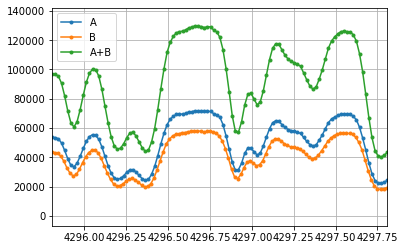

#-----------------------#
A order 5 B order 5


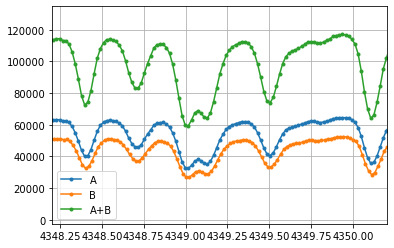

#-----------------------#
A order 6 B order 6


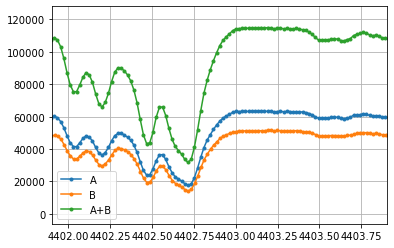

#-----------------------#
A order 7 B order 7


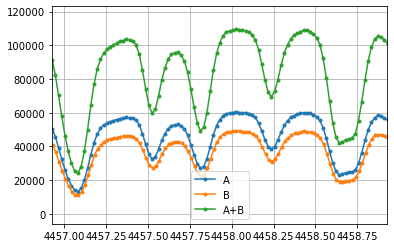

#-----------------------#
A order 8 B order 8


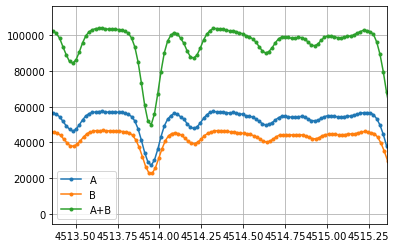

#-----------------------#
A order 9 B order 9


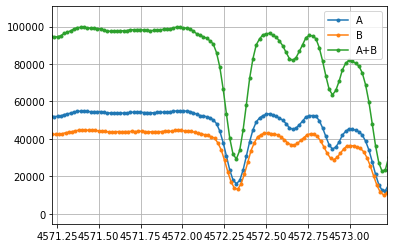

#-----------------------#
A order 10 B order 10


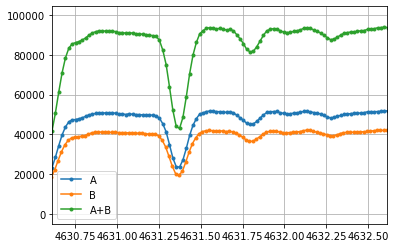

#-----------------------#
A order 11 B order 11


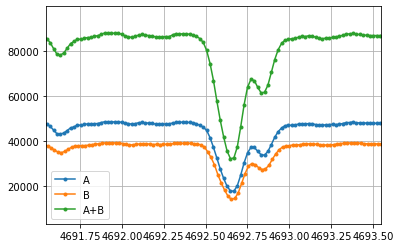

#-----------------------#
A order 12 B order 12


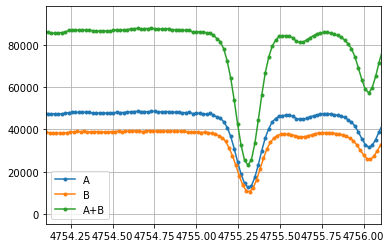

#-----------------------#
A order 13 B order 13


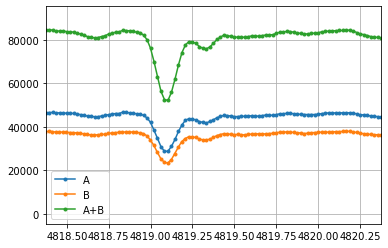

#-----------------------#
A order 14 B order 14


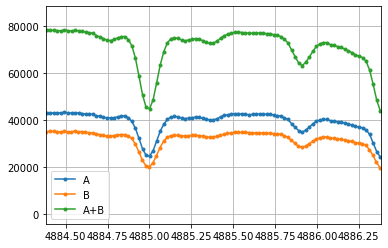

#-----------------------#
A order 15 B order 15


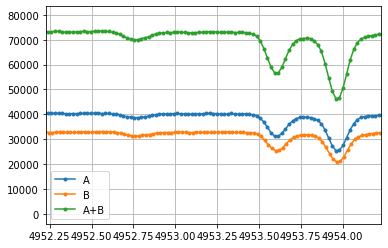

#-----------------------#
A order 16 B order 16


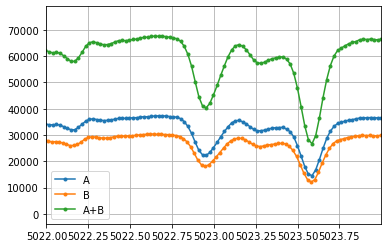

#-----------------------#
A order 17 B order 17


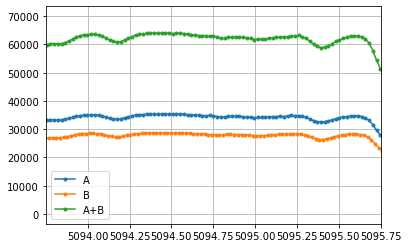

#-----------------------#
A order 18 B order 18


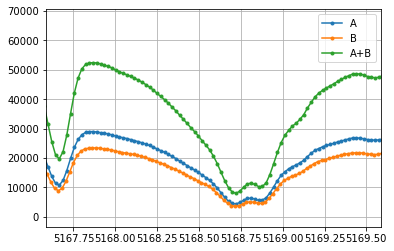

#-----------------------#
A order 19 B order 19


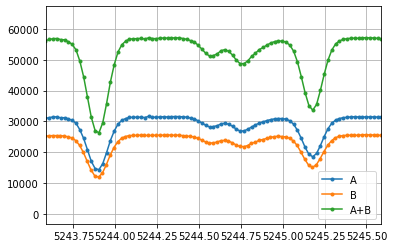

#-----------------------#
A order 20 B order 21


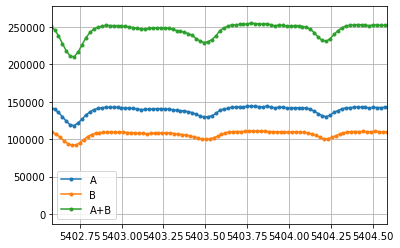

#-----------------------#
A order 21 B order 22


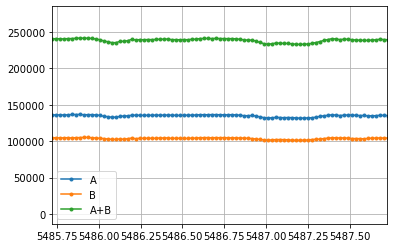

#-----------------------#
A order 22 B order 23


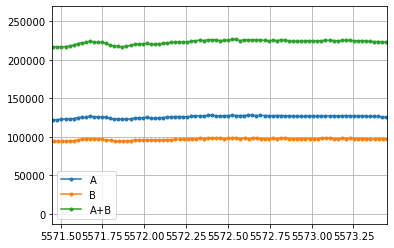

#-----------------------#
A order 23 B order 24


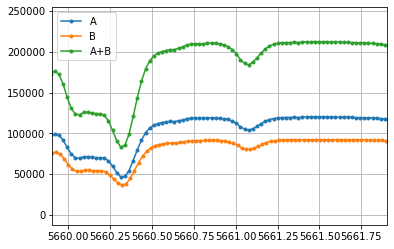

#-----------------------#
A order 24 B order 25


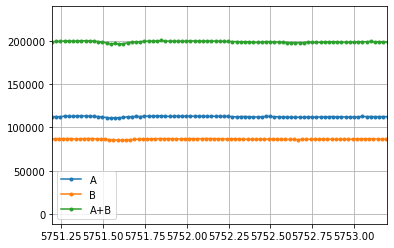

#-----------------------#
A order 25 B order 26


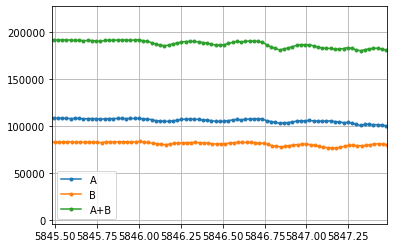

#-----------------------#
A order 26 B order 27


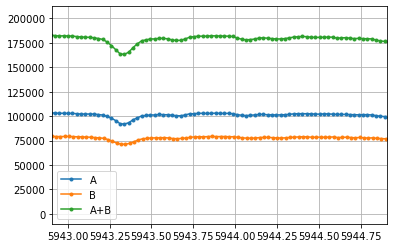

#-----------------------#
A order 27 B order 28


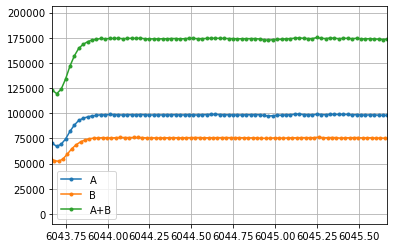

#-----------------------#
A order 28 B order 29


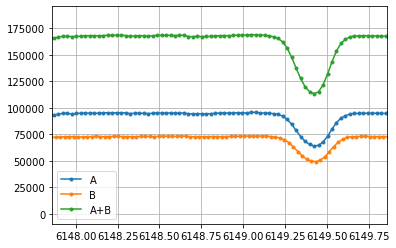

#-----------------------#
A order 29 B order 30


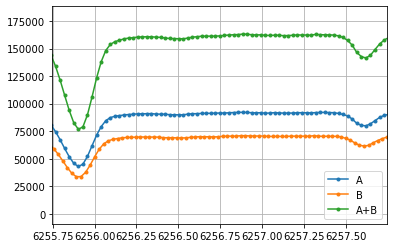

#-----------------------#
A order 30 B order 31


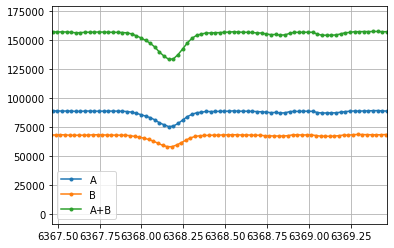

#-----------------------#
A order 31 B order 32


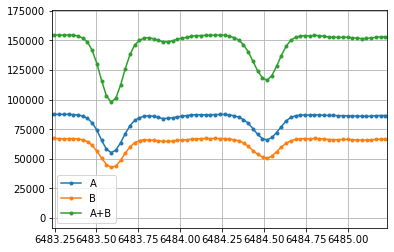

#-----------------------#
A order 32 B order 33


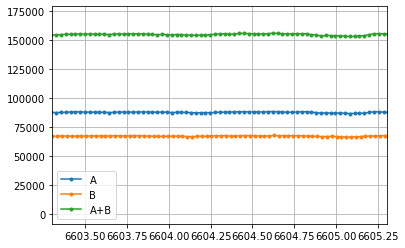

#-----------------------#
A order 33 B order 34


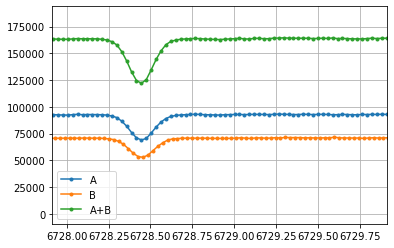

#-----------------------#
A order 34 B order 35


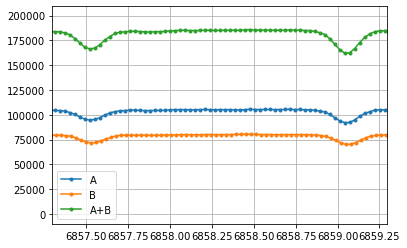

#-----------------------#
A order 35 B order 36


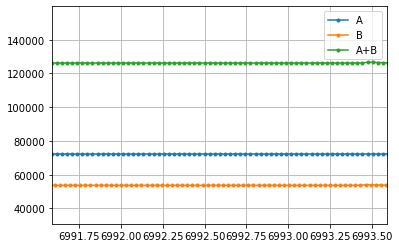

#-----------------------#
A order 36 B order 37


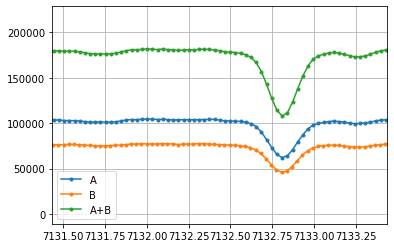

#-----------------------#
A order 37 B order 38


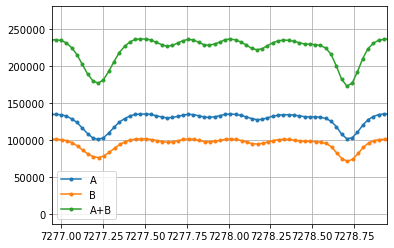

#-----------------------#
A order 38 B order 39


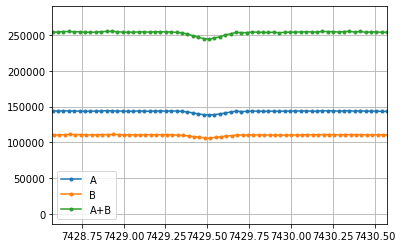

#-----------------------#
A order 39 B order 40


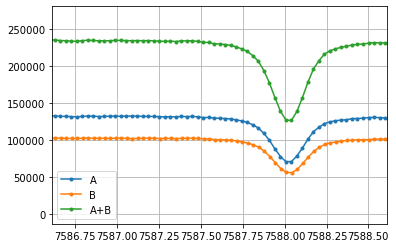

#-----------------------#
A order 40 B order 41


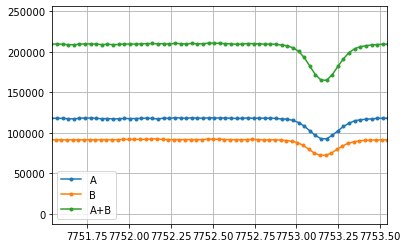

#-----------------------#
A order 41 B order 42


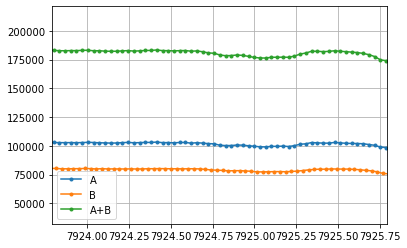

#-----------------------#
A order 42 B order 43


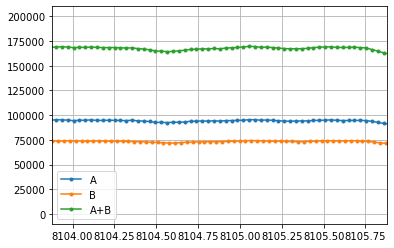

#-----------------------#
A order 43 B order 44


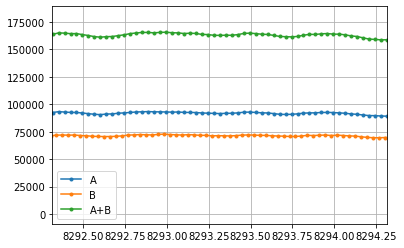

#-----------------------#


In [15]:
HebeA.combine_spectra(HebeB)

In [16]:
HebeA.update_combined()

In [17]:
window_width = 1.6
depth = 90

HebeA.normalize_all(window_width=window_width, continuum_depth=depth)

In [18]:
Sun.normalize_all(window_width=window_width, continuum_depth=depth)

/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:100: RuntimeWarning: invalid value encountered in sqrt
  err = np.sqrt(self.flux[order][clipl:clipr])
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:127: RuntimeWarning: invalid value encountered in true_divide
  self.normalized_flux[order][clipl:clipr] = self.flux[order][clipl:clipr]/pred


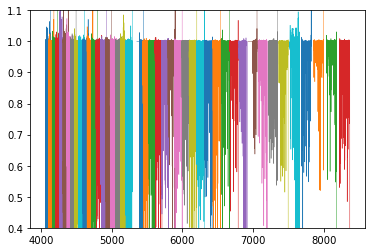

In [19]:
HebeA.check_spectra()

In [20]:
HebeA.estimate_shift([Sun], shift_spacing = 1000)

order 13 in star not found in solar specturm
missing values can be interpolated/extrapolated using clean_shift() method
order 14 in star not found in solar specturm
missing values can be interpolated/extrapolated using clean_shift() method
order 15 in star not found in solar specturm
missing values can be interpolated/extrapolated using clean_shift() method
order 31 in star not found in solar specturm
missing values can be interpolated/extrapolated using clean_shift() method


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:6125: RuntimeWarning: divide by zero encountered in true_divide
  terms = (f_obs.astype(np.float64) - f_exp)**2 / f_exp
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:47: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


IndexError: index 0 is out of bounds for axis 0 with size 0

In [21]:
HebeA.clean_shift()

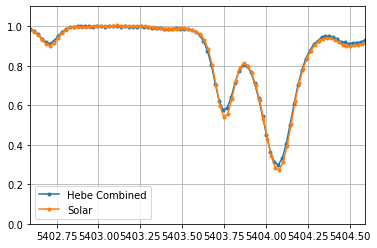

/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:141: RuntimeWarning: divide by zero encountered in true_divide
  return self.flux[order]/self.obs_err[order]
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:141: RuntimeWarning: divide by zero encountered in true_divide
  return self.flux[order]/self.obs_err[order]


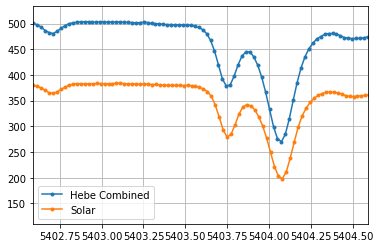

In [22]:
#%matplotlib
order = 20
solar_order = order + 8 #if order is < 20 add 7, if order is >= 20 add 8
plt.plot(HebeA.shifted_wavelength[order], HebeA.normalized_flux[order], marker = '.', label = 'Hebe Combined')
plt.plot(Sun.wavelength[solar_order], Sun.normalized_flux[solar_order], marker = '.', label = 'Solar')
plt.ylim([0,1.1])
plt.xlim([np.median(HebeA.wavelength[order]-1),np.median(HebeA.wavelength[order]+1)])
plt.grid()
plt.legend()
plt.show()

plt.plot(HebeA.shifted_wavelength[order], HebeA.S_N(order), marker = '.', label = 'Hebe Combined')
plt.plot(Sun.wavelength[solar_order], Sun.S_N(solar_order), marker = '.', label = 'Solar')
#plt.ylim([0,1.1])
plt.xlim([np.median(HebeA.wavelength[order]-1),np.median(HebeA.wavelength[order]+1)])
plt.grid()
plt.legend()
plt.show()

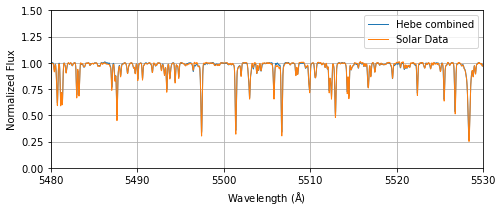

In [23]:
order = 29
xlims = [5480,5530]
ylims = [0,1.5]
fig = plt.figure(figsize=(7,3))
norm = fig.add_subplot(111)
#norm.errorbar(Sun.wavelength[order],Sun.normalized_flux[order],yerr=Sun.obs_err[order]/Sun.m_all[order])
norm.plot(HebeA.shifted_wavelength[21],HebeA.normalized_flux[21], lw = 1, label = 'Hebe combined')
#norm.plot(HebeB.shifted_wavelength[22],HebeB.normalized_flux[22], lw = 1, label = 'HebeB')
norm.plot(Sun.wavelength[order],Sun.normalized_flux[order], lw = 1, label = 'Solar Data')
norm.set_ylabel('Normalized Flux')
norm.set_xlabel(r'$\rm Wavelength~(\AA)$')
norm.set_xlim(xlims)
norm.set_ylim(ylims)
norm.grid()

plt.tight_layout()
plt.legend()
#plt.savefig('Cont_norm_sample.pdf')

In [24]:
%%time
#linelist_path = '/Users/georgevejar/Documents/GitHub/Spectrum_project/Sun_ew_test1.txt'
linelist_path = Path('../Line_list_sample/Sun_fe_sample.txt')
lines = np.genfromtxt(linelist_path, skip_header = 1, usecols = 0)
elmnt = np.genfromtxt(linelist_path, skip_header = 1, usecols = 1)
EP = np.genfromtxt(linelist_path, skip_header = 1, usecols = 2)
OS = np.genfromtxt(linelist_path, skip_header = 1, usecols = 3)
ex = np.genfromtxt(linelist_path, skip_header = 1, usecols = 4)
ews = np.genfromtxt(linelist_path, skip_header = 1, usecols = 5)

#Load lines into class
HebeA.load_lines(linelist_path)

CPU times: user 7.72 ms, sys: 2.55 ms, total: 10.3 ms
Wall time: 10.7 ms


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 4620.521 - Line found: 4620.44643253372
EW: 53.71 ± 0.54 simps-int: 53.71 ± 0.54


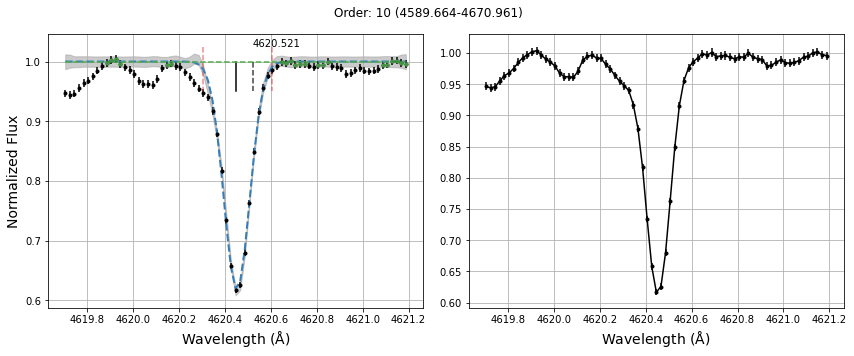

#-----------------------#
line to measure: Fe I 4779.439 - Line found: 4779.389755436903
EW: 41.09 ± 0.52 simps-int: 41.08 ± 0.52


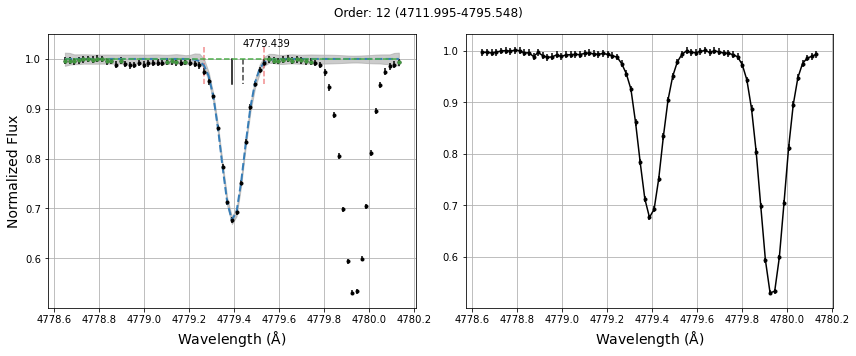

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 4788.757 - Line found: 4788.705483188667
EW: 66.83 ± 0.55 simps-int: 66.82 ± 0.55


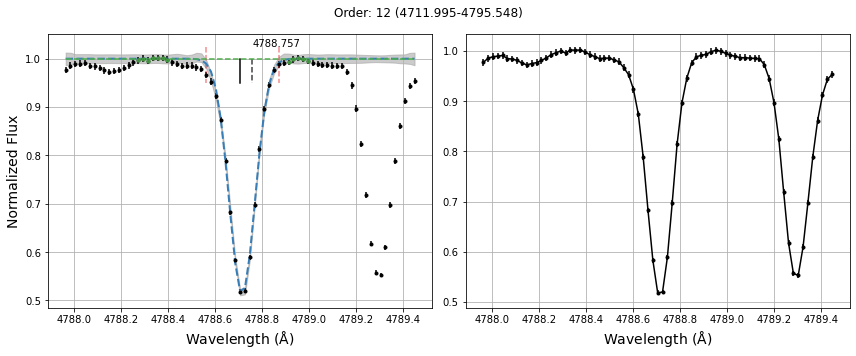

#-----------------------#
line to measure: Fe I 4779.439 - Line found: 4779.4000644663765
EW: 40.21 ± 0.51 simps-int: 40.21 ± 0.51


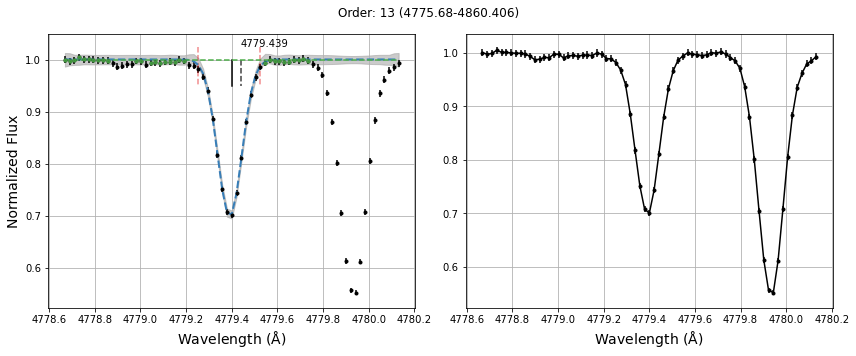

#-----------------------#
line to measure: Fe I 4788.757 - Line found: 4788.721218025276
EW: 66.61 ± 0.52 simps-int: 66.61 ± 0.52


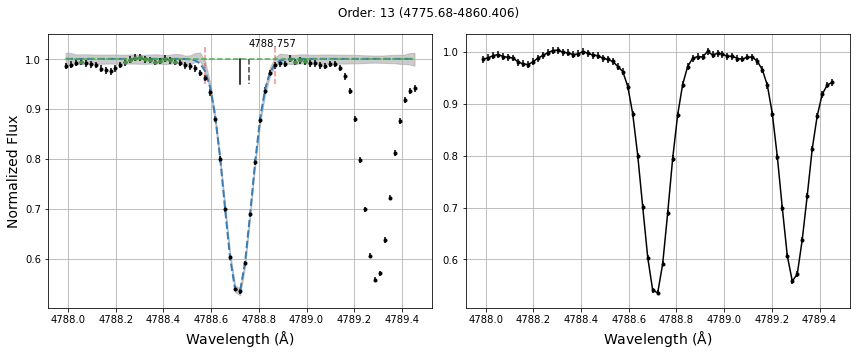

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5054.643 - Line found: 5054.592477836912
EW: 38.68 ± 0.65 simps-int: 38.68 ± 0.65


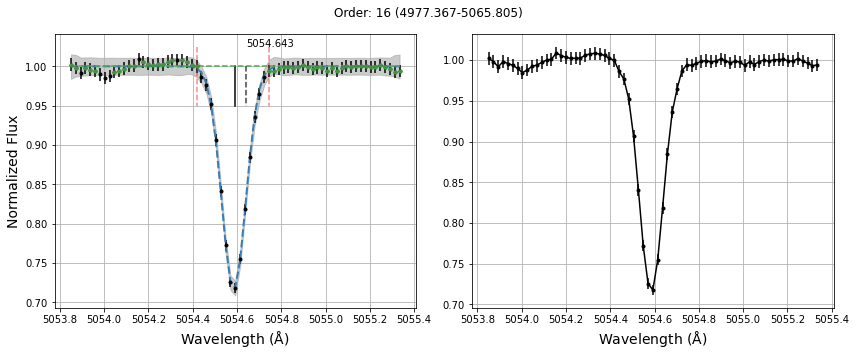

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5054.643 - Line found: 5054.558361441677
EW: 39.37 ± 0.66 simps-int: 39.36 ± 0.66


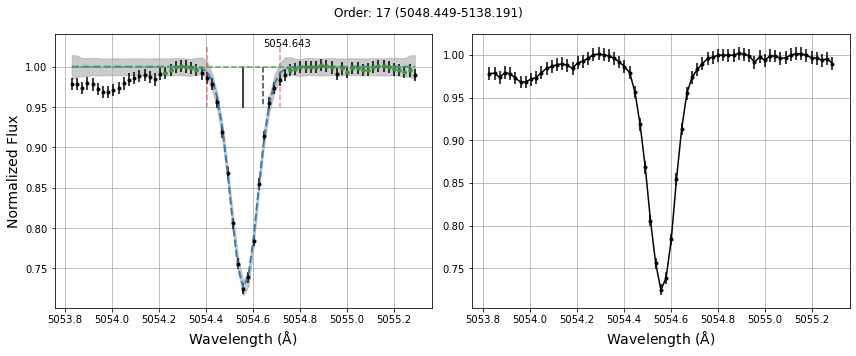

#-----------------------#
line to measure: Fe II 5197.577 - Line found: 5197.510344624678
EW: 79.8 ± 0.64 simps-int: 79.79 ± 0.64


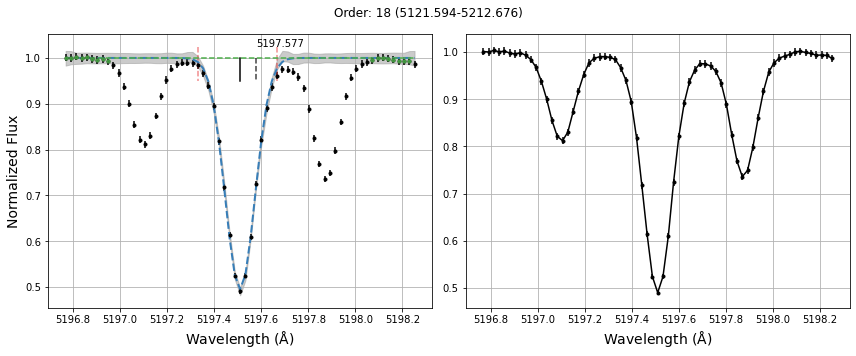

#-----------------------#
line to measure: Fe II 5197.577 - Line found: 5197.498999633156
EW: 80.82 ± 0.78 simps-int: 80.81 ± 0.78


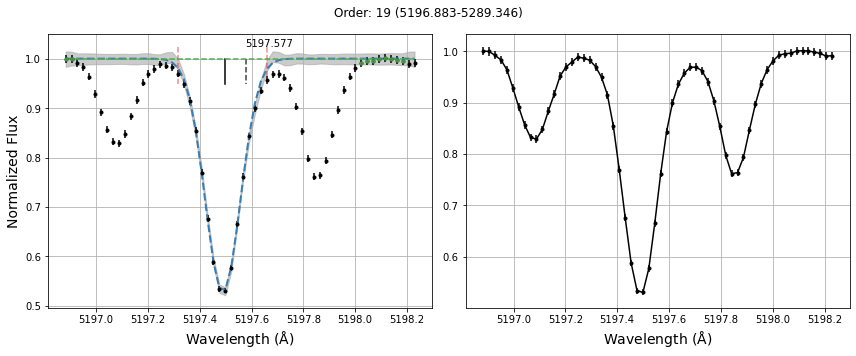

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 5234.625 - Line found: 5234.561793536985
EW: 81.47 ± 1.77 simps-int: 81.27 ± 5.77


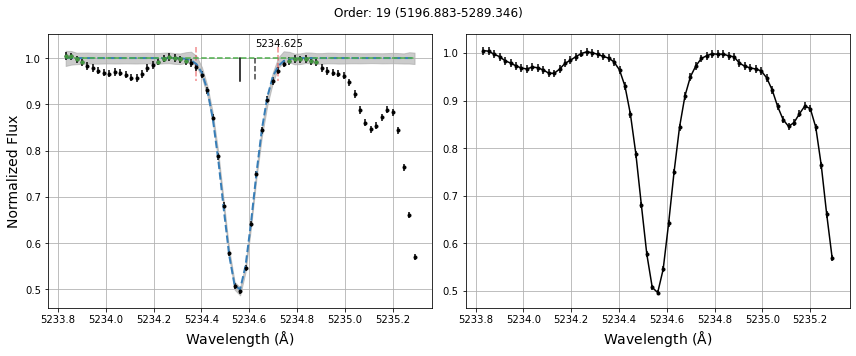

#-----------------------#
line to measure: Fe II 5264.812 - Line found: 5264.736609742994
EW: 43.59 ± 0.72 simps-int: 43.59 ± 0.72


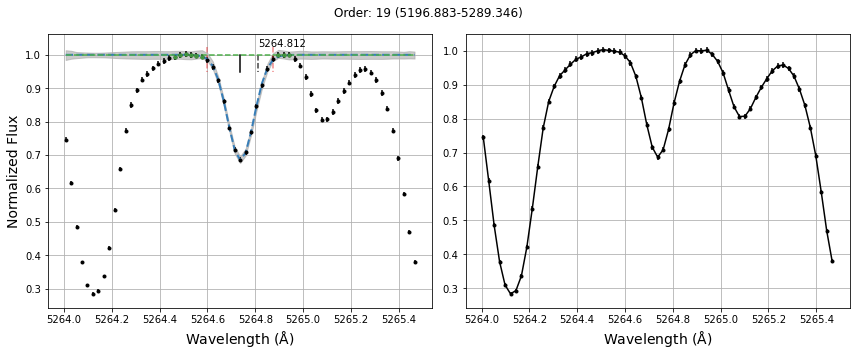

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5379.574 - Line found: 5354.889716395601
EW: 14.1 ± 29.53 simps-int: 4.9 ± 16.3


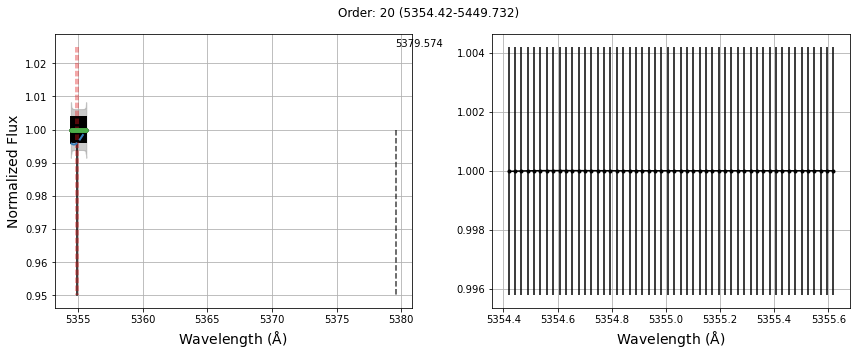

#-----------------------#
line to measure: Fe II 5414.073 - Line found: 5413.9955987380545
EW: 27.14 ± 0.39 simps-int: 27.13 ± 0.39


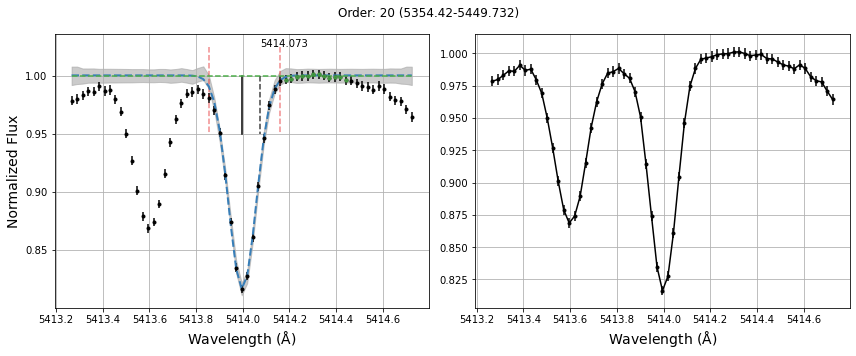

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 5425.257 - Line found: 5425.186688632648
EW: 41.23 ± 0.37 simps-int: 41.23 ± 0.37


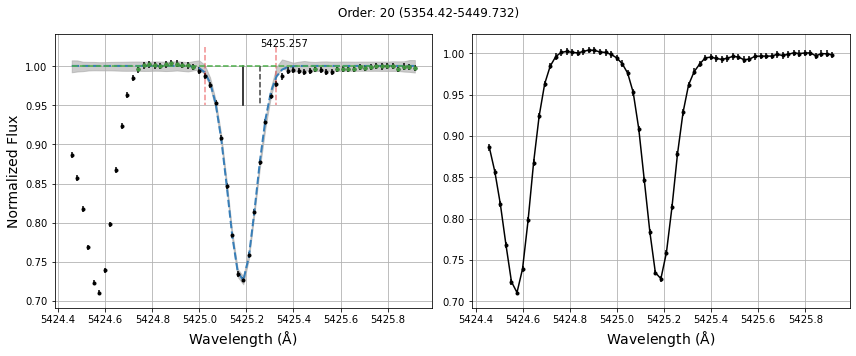

#-----------------------#
line to measure: Fe I 5522.447 - Line found: 5522.375818404127
EW: 44.85 ± 0.38 simps-int: 44.85 ± 0.38


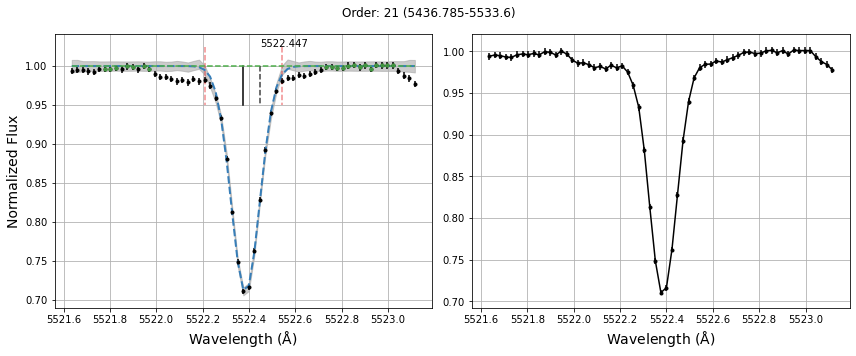

#-----------------------#
line to measure: Fe I 5522.447 - Line found: 5522.377502025481
EW: 45.01 ± 0.41 simps-int: 45.0 ± 0.41


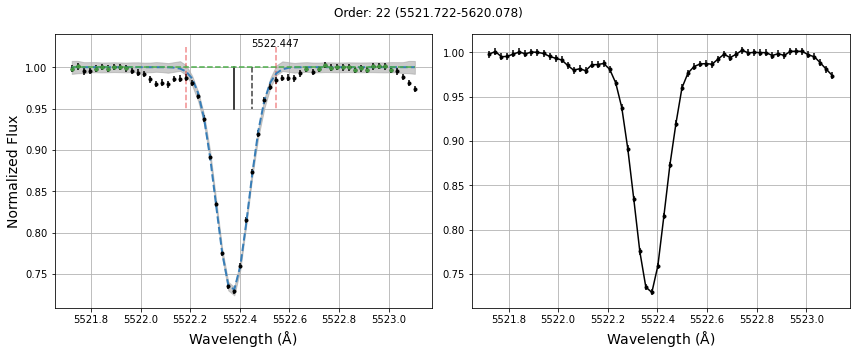

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 5543.936 - Line found: 5543.873071383879
EW: 62.96 ± 0.4 simps-int: 62.96 ± 0.4


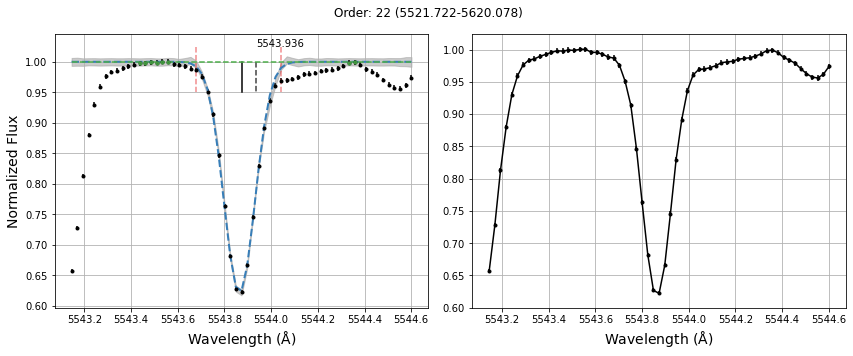

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5546.5 - Line found: 5546.420514705133
EW: 51.17 ± 2.45 simps-int: 50.62 ± 7.89


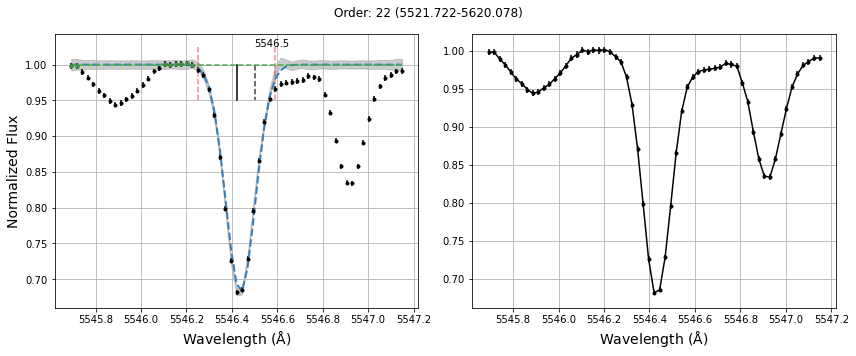

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5546.991 - Line found: 5546.930003369384
EW: 27.22 ± 0.87 simps-int: 27.09 ± 2.7


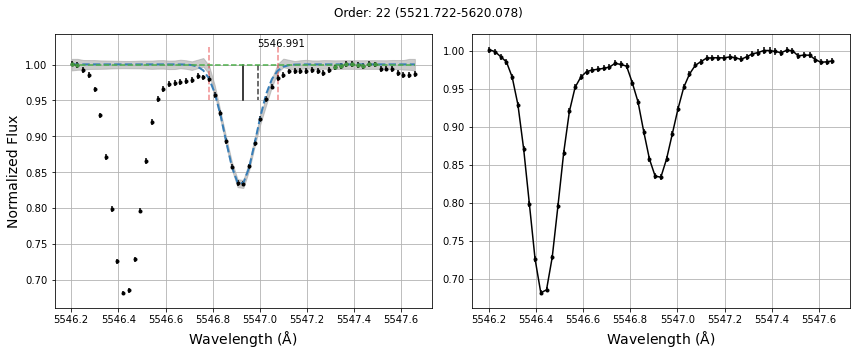

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5560.207 - Line found: 5560.152447274945
EW: 51.51 ± 2.68 simps-int: 50.84 ± 8.68


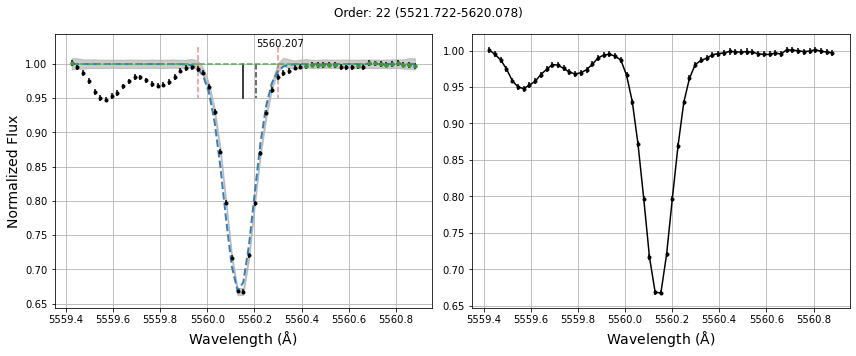

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5577.03 - Line found: 5576.965573195227
EW: 11.51 ± 0.47 simps-int: 11.48 ± 0.92


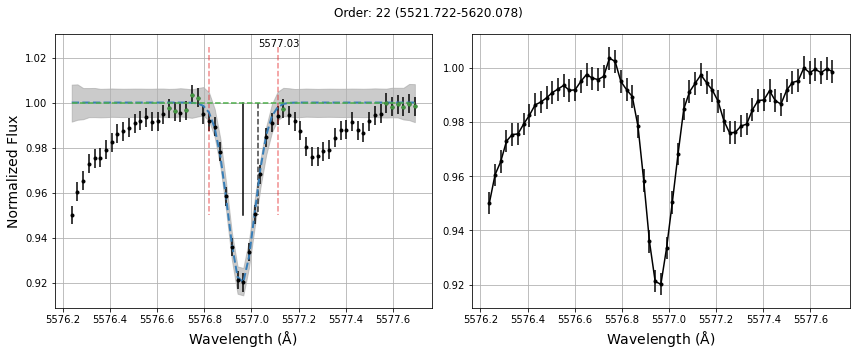

#-----------------------#
line to measure: Fe I 5579.335 - Line found: 5579.270402866839
EW: 8.82 ± 0.32 simps-int: 8.82 ± 0.32


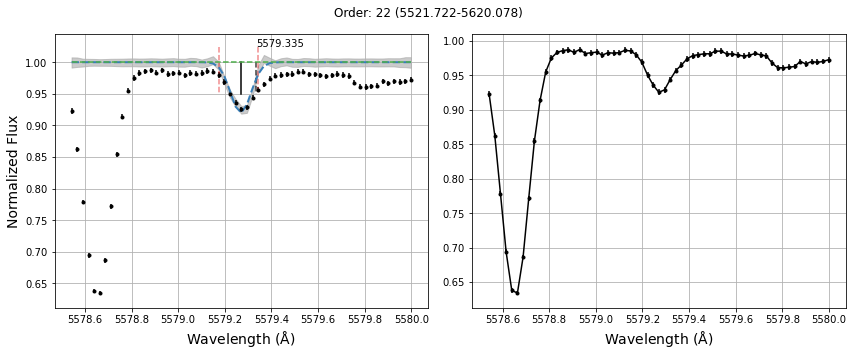

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5587.574 - Line found: 5587.519266954711
EW: 34.55 ± 0.39 simps-int: 34.55 ± 0.39


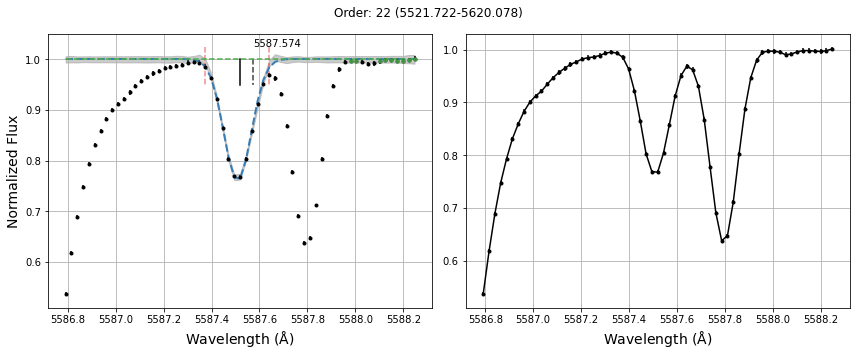

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5646.684 - Line found: 5646.602259397583
EW: 8.01 ± 0.43 simps-int: 8.01 ± 0.43


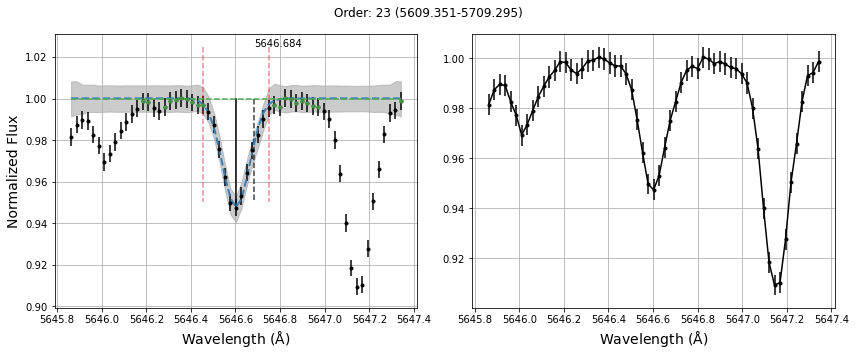

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5651.469 - Line found: 5651.384964680943
EW: 19.22 ± 0.42 simps-int: 19.22 ± 0.42


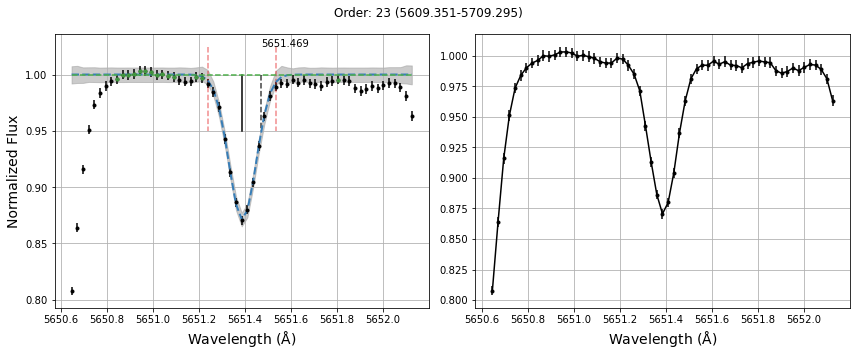

#-----------------------#
line to measure: Fe I 5652.318 - Line found: 5652.223170761532
EW: 27.43 ± 0.43 simps-int: 27.43 ± 0.43


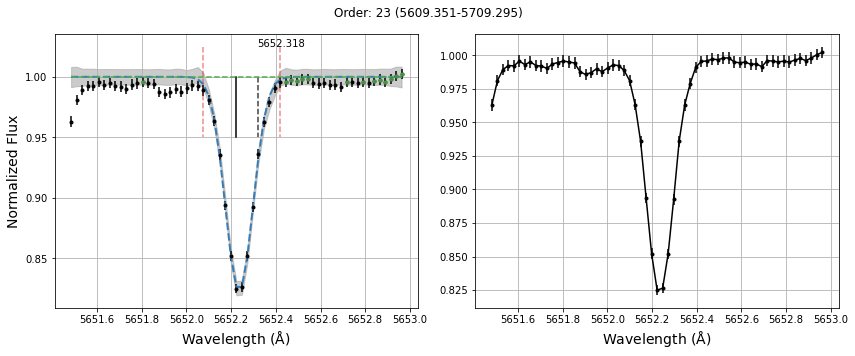

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5661.346 - Line found: 5661.270865807888
EW: 22.41 ± 0.41 simps-int: 22.41 ± 0.41


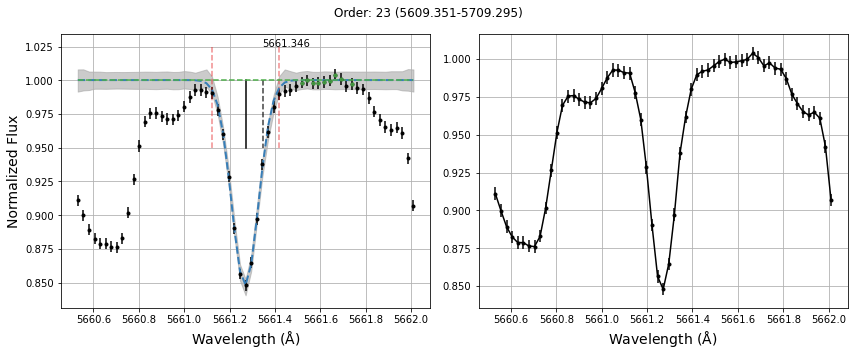

#-----------------------#
line to measure: Fe I 5667.518 - Line found: 5667.434145812218
EW: 51.58 ± 0.44 simps-int: 51.58 ± 0.44


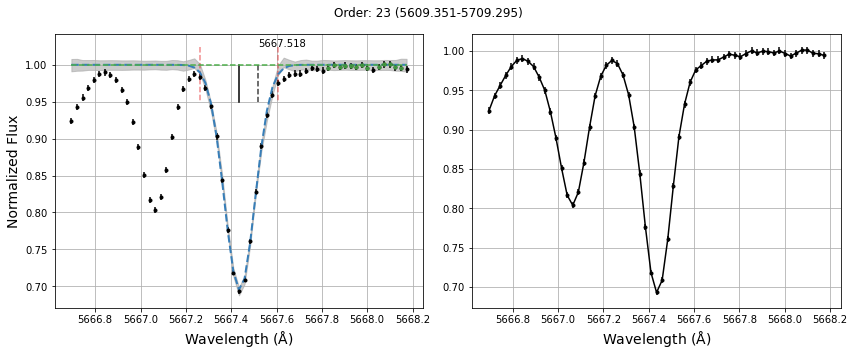

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5677.684 - Line found: 5677.615884379371
EW: 7.35 ± 0.42 simps-int: 7.35 ± 0.42


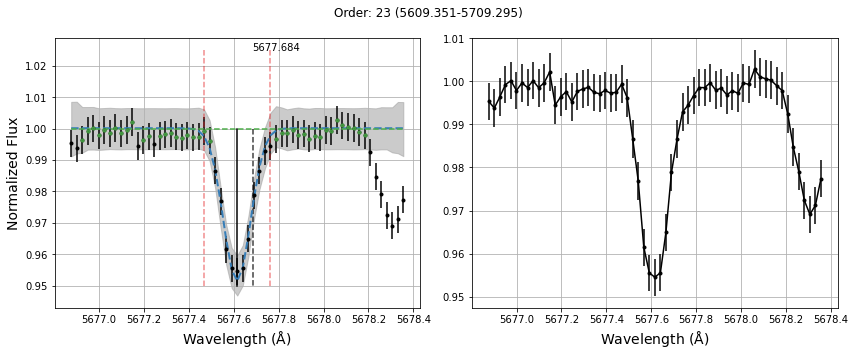

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5679.023 - Line found: 5678.947152860306
EW: 58.93 ± 0.42 simps-int: 58.93 ± 0.42


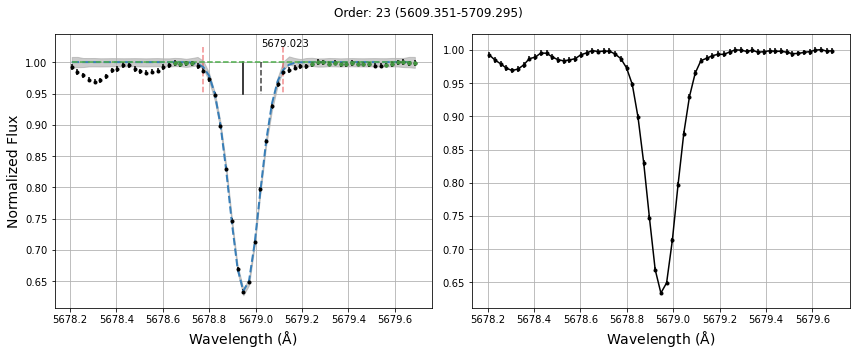

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5680.24 - Line found: 5680.155155741155
EW: 10.86 ± 0.49 simps-int: 10.83 ± 0.87


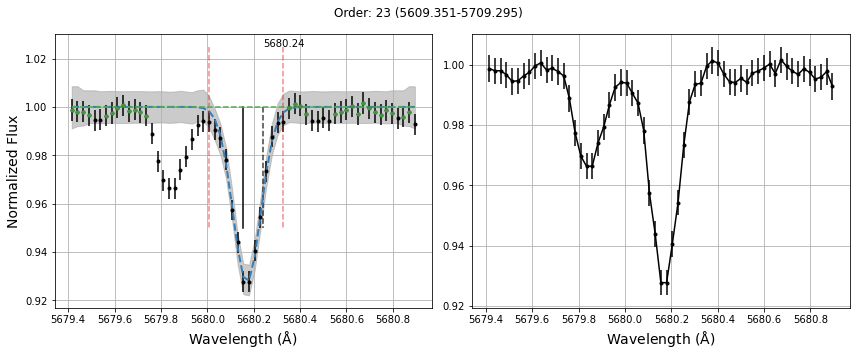

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5731.762 - Line found: 5731.669050665026
EW: 57.34 ± 0.42 simps-int: 57.34 ± 0.42


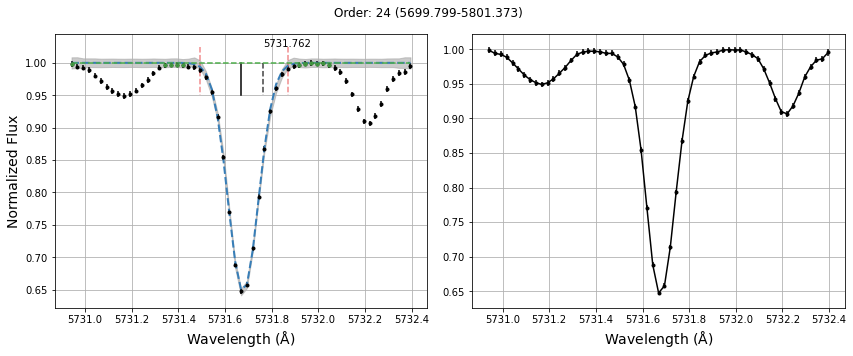

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5732.275 - Line found: 5732.220267868065
EW: 13.55 ± 0.37 simps-int: 13.55 ± 0.37


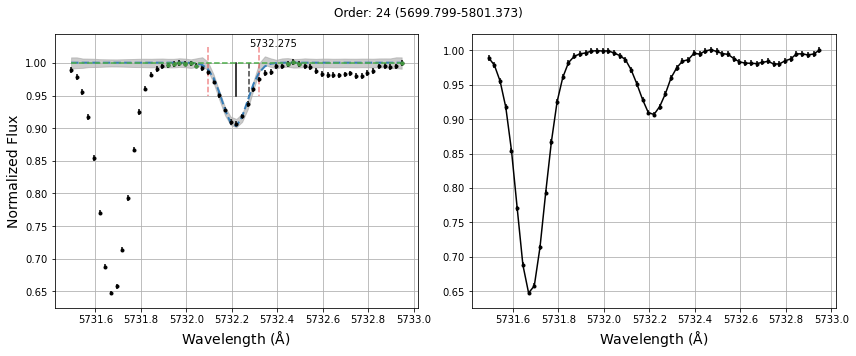

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 5741.846 - Line found: 5741.766347611611
EW: 31.9 ± 0.97 simps-int: 31.75 ± 3.23


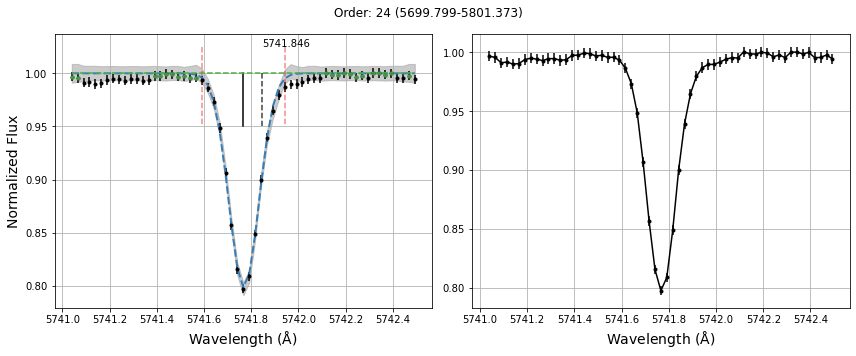

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5752.032 - Line found: 5751.9638658678405
EW: 54.49 ± 2.62 simps-int: 54.35 ± 4.55


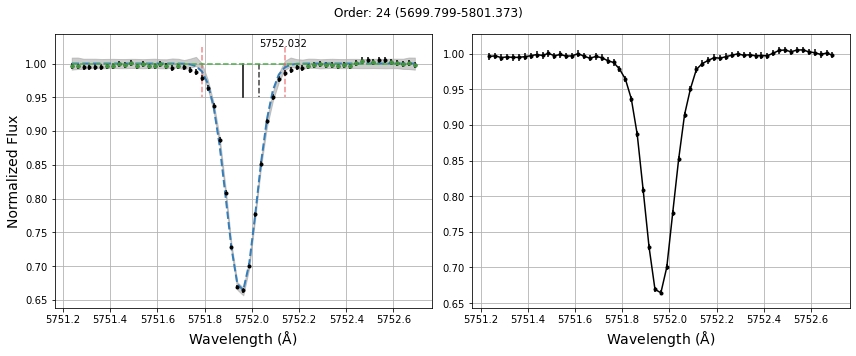

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5775.081 - Line found: 5775.014767085852
EW: 59.15 ± 0.44 simps-int: 59.15 ± 0.44


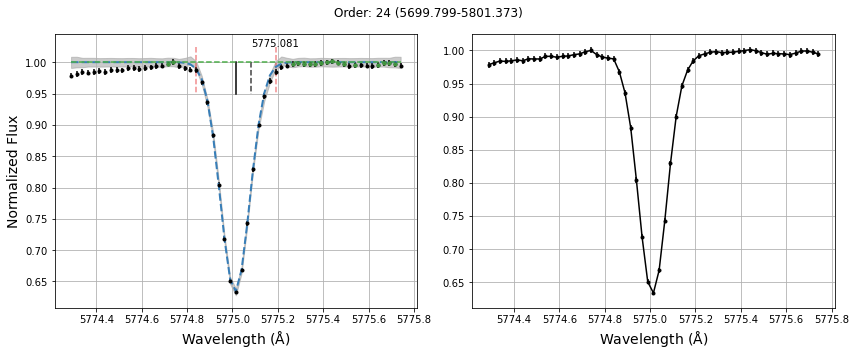

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5778.45 - Line found: 5778.3972362863215
EW: 22.47 ± 0.87 simps-int: 22.32 ± 2.77


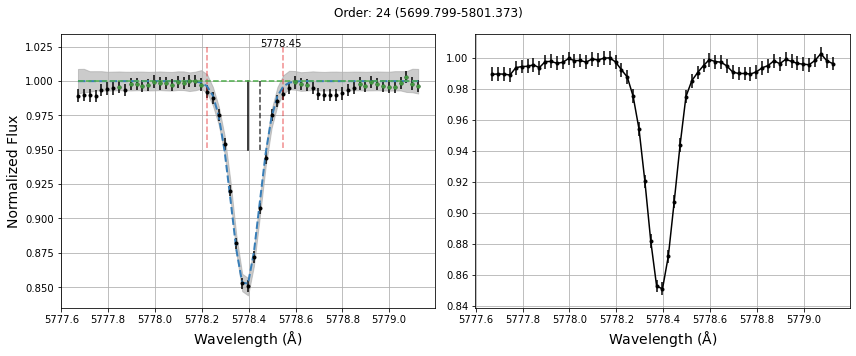

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 5809.218 - Line found: 5809.151426514215
EW: 50.57 ± 0.43 simps-int: 50.57 ± 0.43


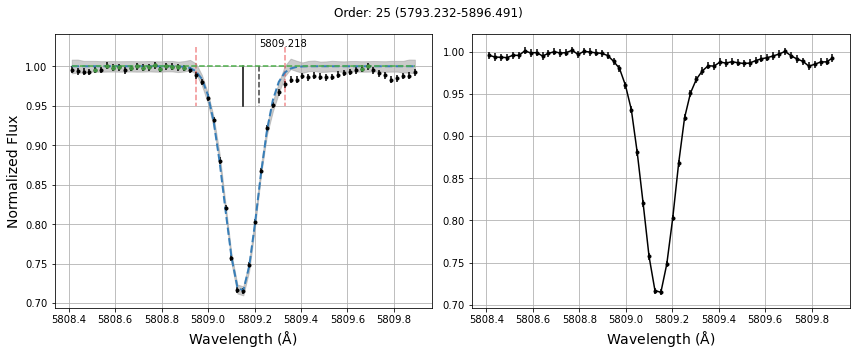

#-----------------------#
line to measure: Fe I 5934.655 - Line found: 5934.591374039082
EW: 77.31 ± 0.5 simps-int: 77.3 ± 0.5


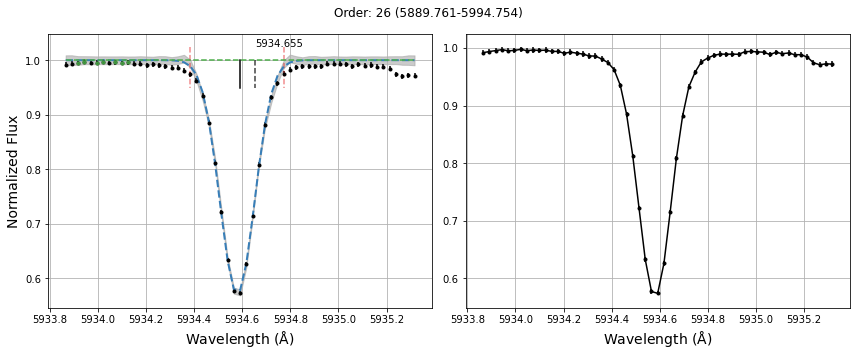

#-----------------------#
line to measure: Fe I 6078.999 - Line found: 6078.942496958015
EW: 45.33 ± 0.47 simps-int: 45.32 ± 0.47


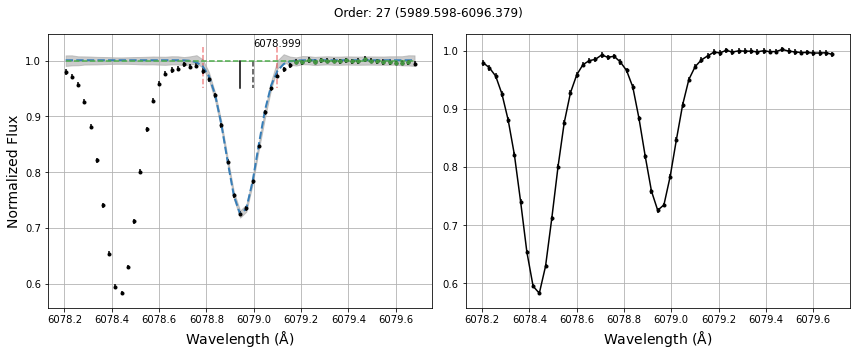

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6085.259 - Line found: 6085.18504008521
EW: 43.29 ± 0.47 simps-int: 43.28 ± 0.47


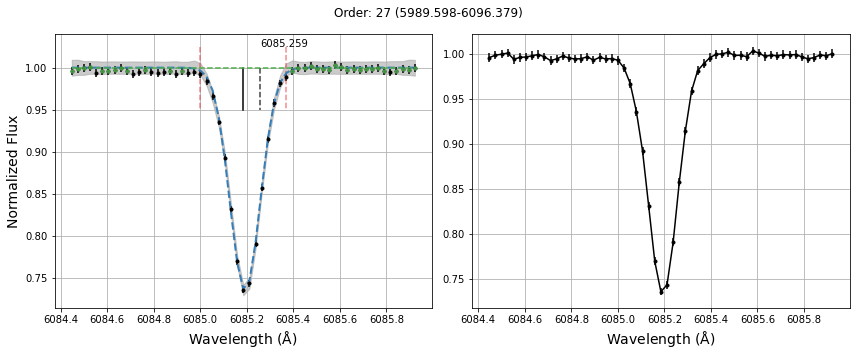

#-----------------------#
line to measure: Fe II 6084.111 - Line found: 6084.052426775213
EW: 22.04 ± 0.53 simps-int: 22.04 ± 0.53


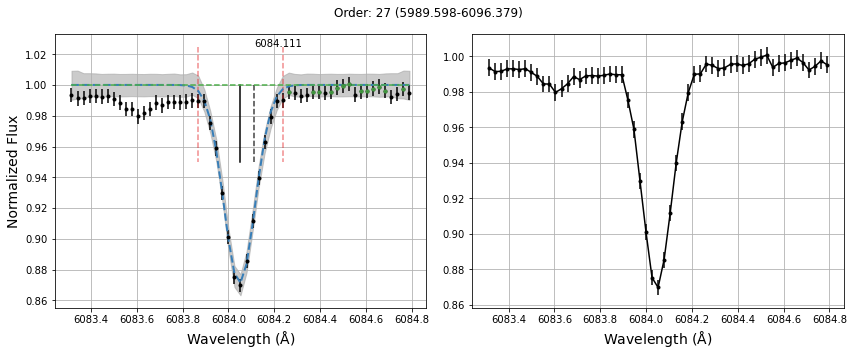

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6098.245 - Line found: 6098.1676720851465
EW: 17.14 ± 0.54 simps-int: 17.14 ± 0.54


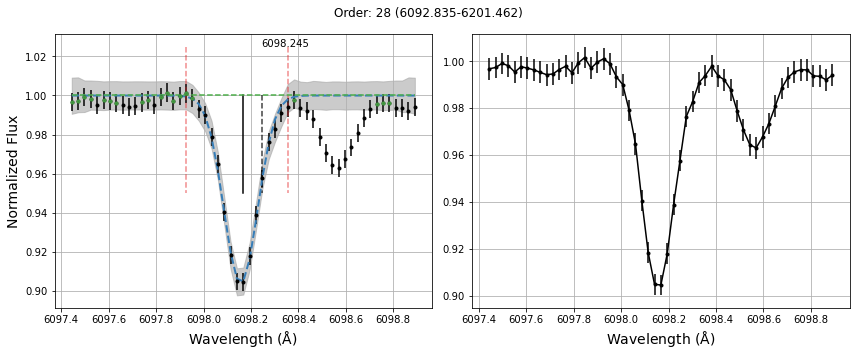

#-----------------------#
line to measure: Fe I 6151.617 - Line found: 6151.543271342867
EW: 50.11 ± 0.5 simps-int: 50.1 ± 0.5


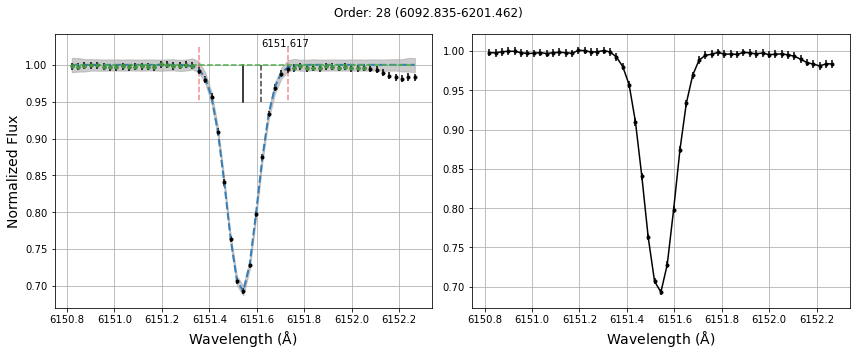

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6159.368 - Line found: 6159.287020431964
EW: 12.25 ± 0.54 simps-int: 12.25 ± 0.54


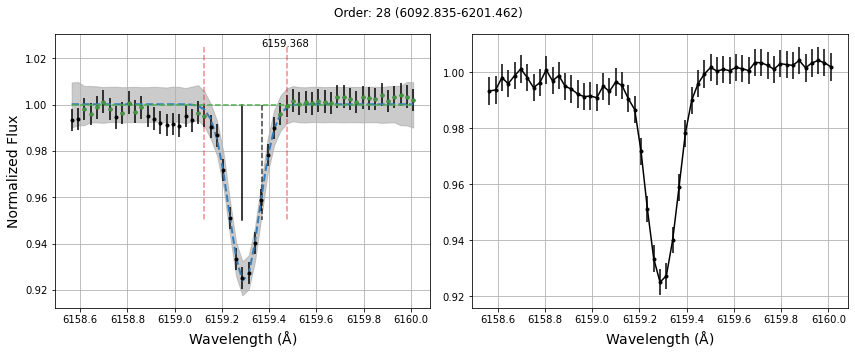

#-----------------------#
line to measure: Fe I 6165.36 - Line found: 6165.289095850503
EW: 44.92 ± 0.49 simps-int: 44.92 ± 0.49


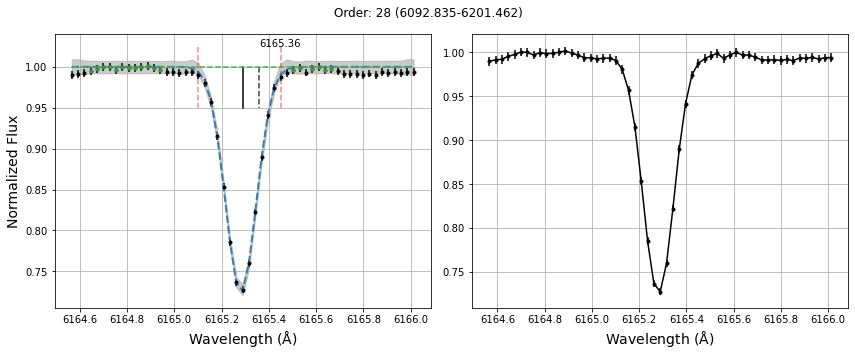

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6173.336 - Line found: 6173.273999755524
EW: 69.09 ± 0.51 simps-int: 69.08 ± 0.51


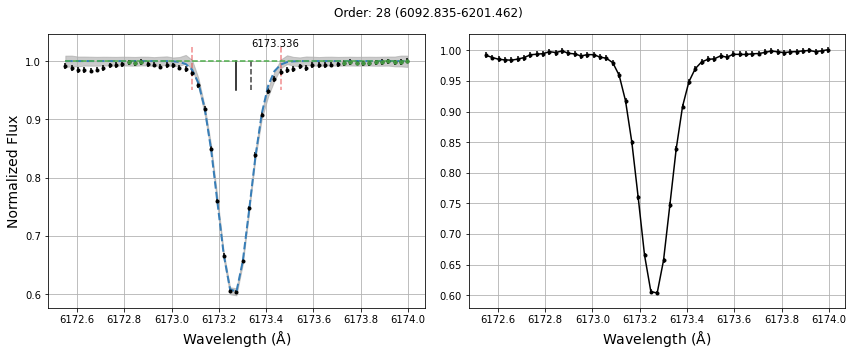

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6187.987 - Line found: 6187.930853567759
EW: 48.45 ± 1.11 simps-int: 48.34 ± 3.41


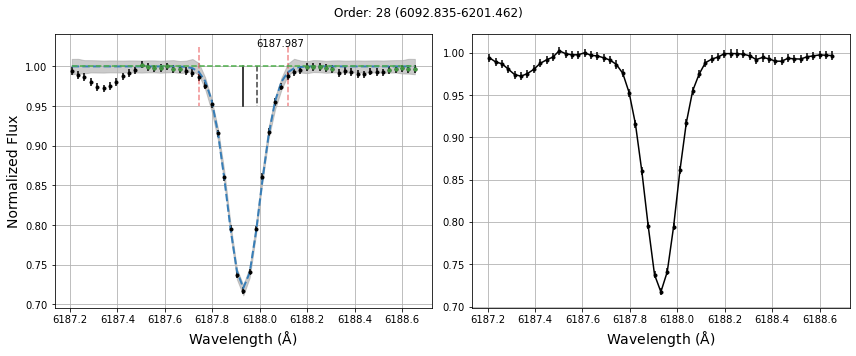

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 6113.322 - Line found: 6113.226450590588
EW: 12.67 ± 0.5 simps-int: 12.67 ± 0.5


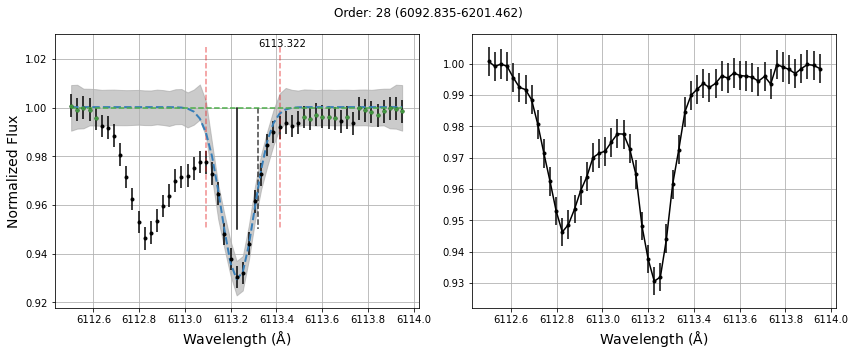

#-----------------------#
line to measure: Fe II 6149.258 - Line found: 6149.15851816318
EW: 36.28 ± 0.93 simps-int: 36.2 ± 2.52


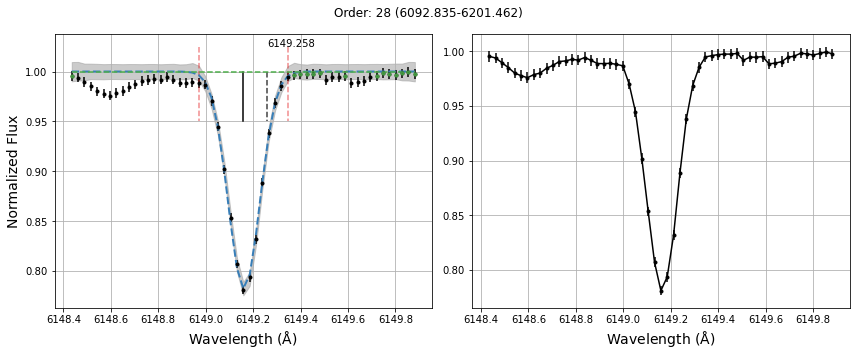

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6220.776 - Line found: 6220.682235315727
EW: 19.47 ± 0.74 simps-int: 19.38 ± 2.02


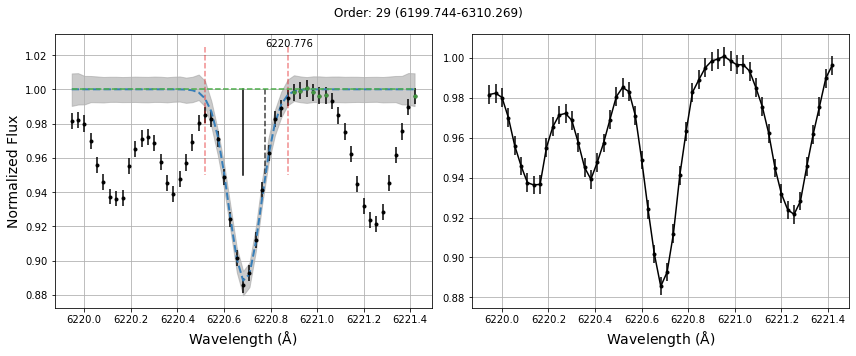

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6226.73 - Line found: 6226.652877100792
EW: 29.12 ± 0.54 simps-int: 29.12 ± 0.54


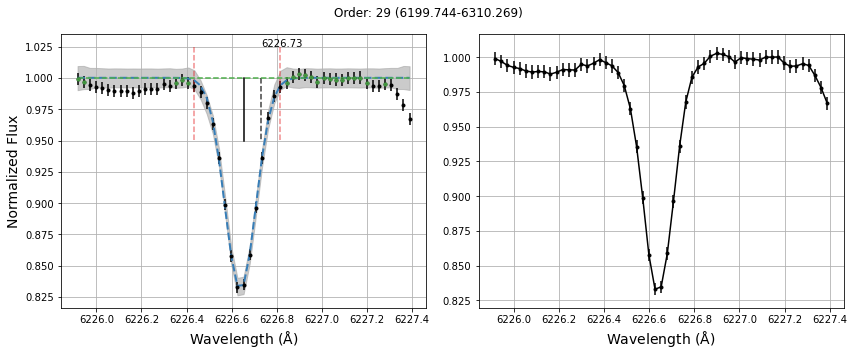

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6229.228 - Line found: 6229.133828710111
EW: 40.21 ± 0.57 simps-int: 40.21 ± 0.57


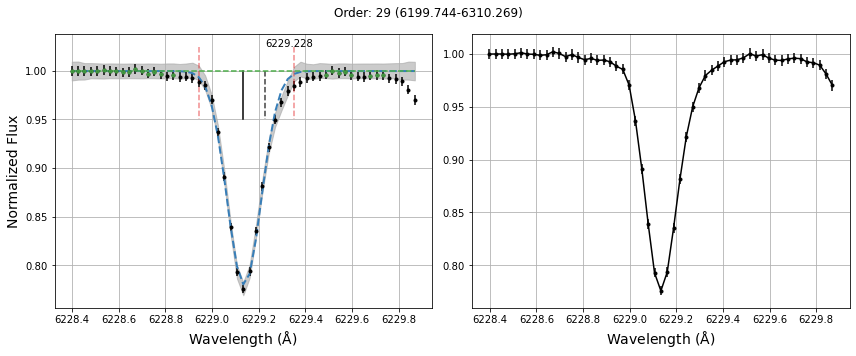

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 6240.645 - Line found: 6240.557111394778
EW: 48.72 ± 2.25 simps-int: 48.51 ± 5.08


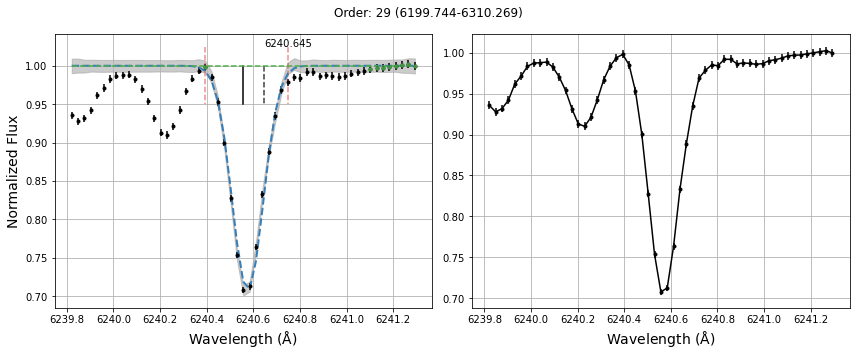

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6293.924 - Line found: 6293.856676188393
EW: 14.39 ± 0.57 simps-int: 14.39 ± 0.57


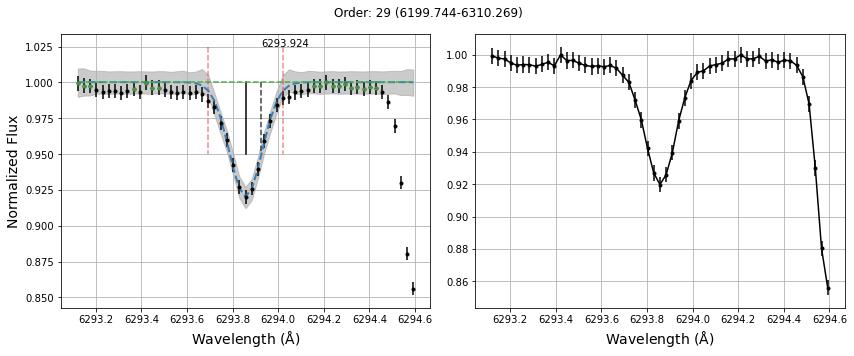

#-----------------------#
line to measure: Fe I 6297.793 - Line found: 6297.728051227111
EW: 91.99 ± 0.65 simps-int: 91.99 ± 0.65


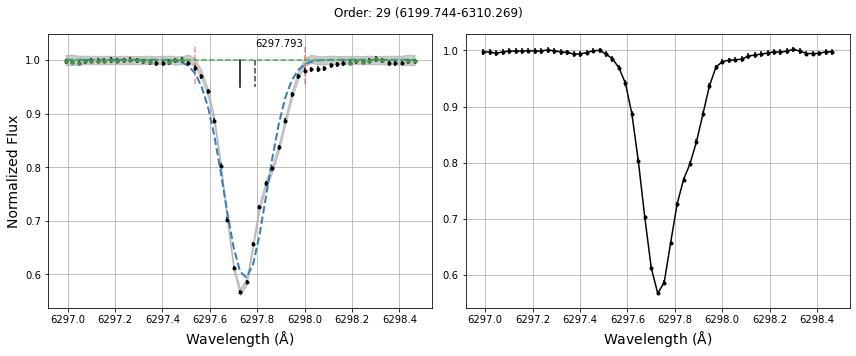

#-----------------------#
line to measure: Fe II 6247.557 - Line found: 6247.481965337273
EW: 52.97 ± 0.51 simps-int: 52.96 ± 0.51


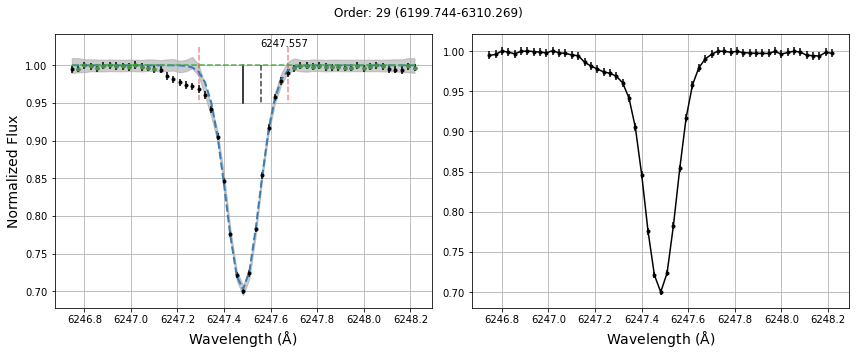

#-----------------------#
line to measure: Fe I 6322.685 - Line found: 6322.5931953466525
EW: 74.73 ± 0.51 simps-int: 74.72 ± 0.51


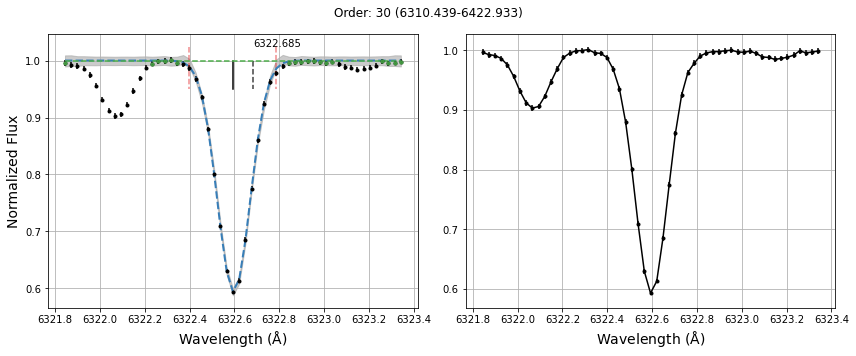

#-----------------------#
line to measure: Fe I 6380.743 - Line found: 6380.644003534561
EW: 52.54 ± 0.56 simps-int: 52.53 ± 0.56


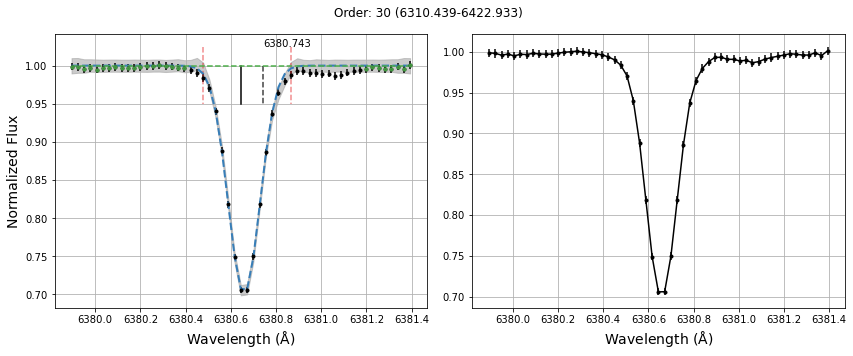

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6392.538 - Line found: 6392.465057209537
EW: 16.94 ± 0.52 simps-int: 16.94 ± 0.52


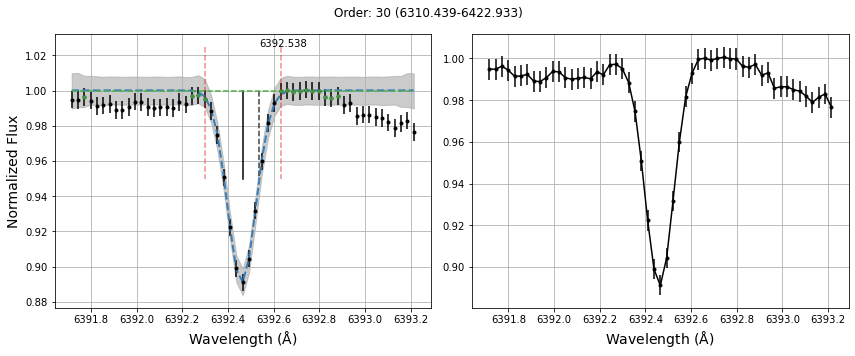

#-----------------------#
line to measure: Fe I 6597.557 - Line found: 6597.458909086035
EW: 44.23 ± 0.57 simps-int: 44.23 ± 0.57


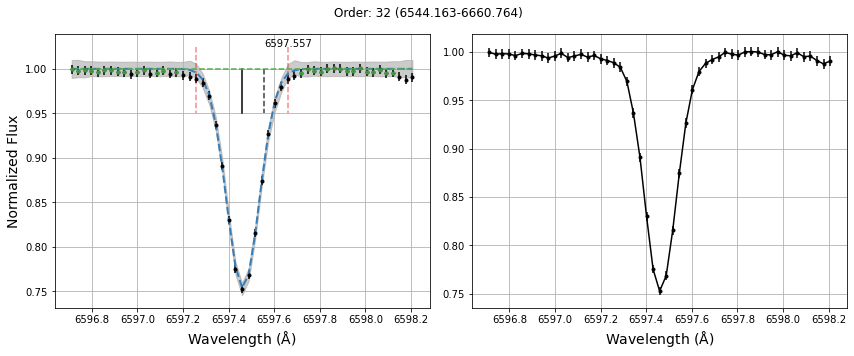

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6608.024 - Line found: 6607.928277999057
EW: 17.73 ± 0.61 simps-int: 17.73 ± 0.61


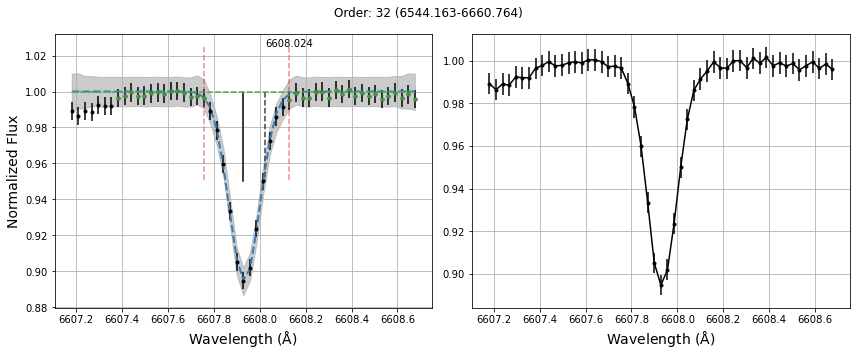

#-----------------------#
line to measure: Fe I 6609.11 - Line found: 6609.021234094373
EW: 66.94 ± 0.58 simps-int: 66.93 ± 0.58


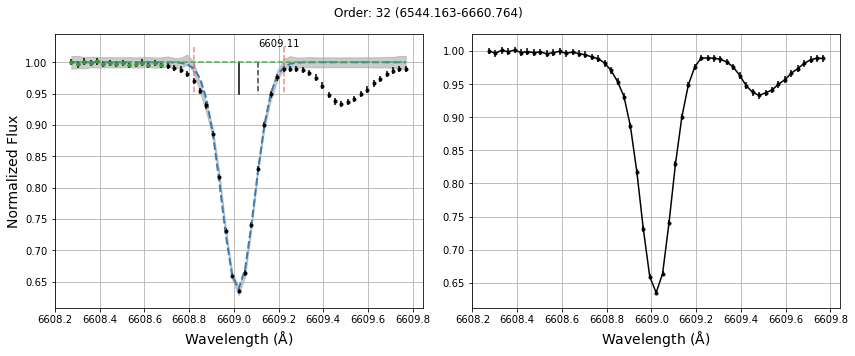

#-----------------------#
line to measure: Fe I 6627.54 - Line found: 6627.457677702194
EW: 28.9 ± 0.6 simps-int: 28.9 ± 0.6


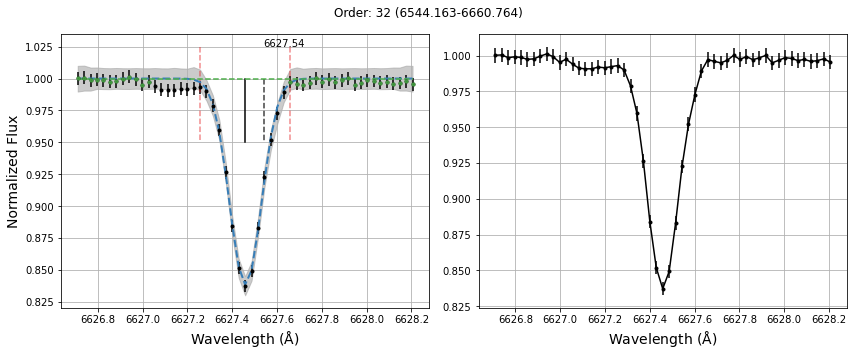

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6653.85 - Line found: 6653.77490999729
EW: 11.16 ± 0.61 simps-int: 11.16 ± 0.61


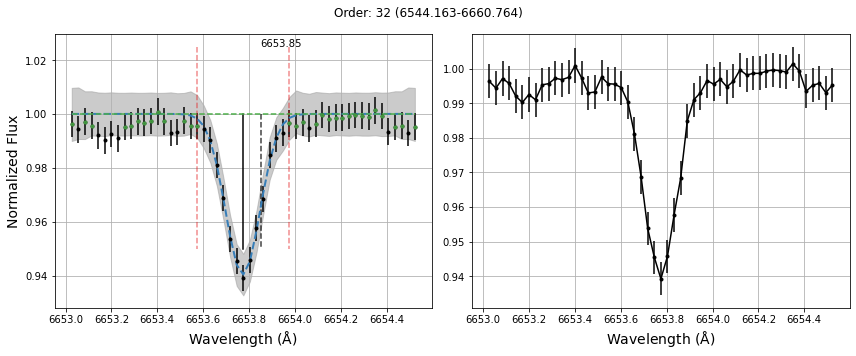

#-----------------------#
line to measure: Fe I 6703.567 - Line found: 6703.491156670354
EW: 37.66 ± 1.36 simps-int: 37.51 ± 3.61


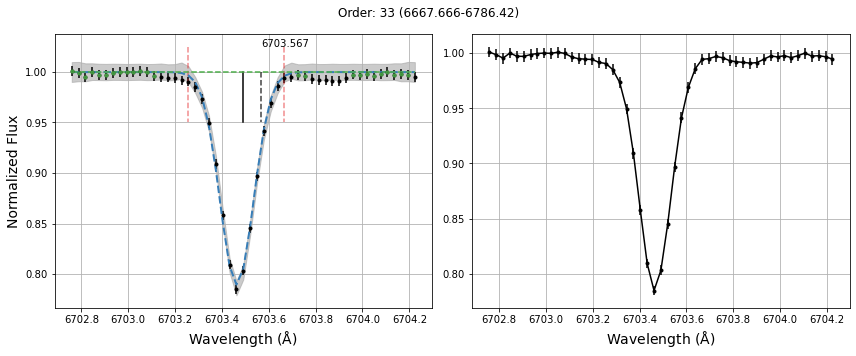

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 6710.316 - Line found: 6710.228562279555
EW: 15.74 ± 0.96 simps-int: 15.67 ± 1.76


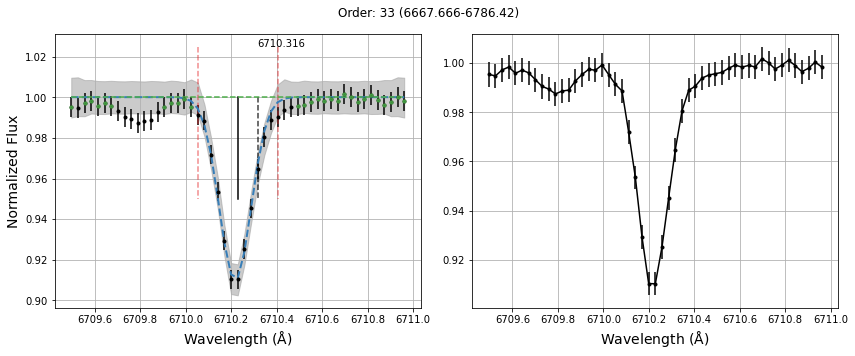

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6713.745 - Line found: 6713.655851219888
EW: 21.65 ± 0.79 simps-int: 21.6 ± 1.59


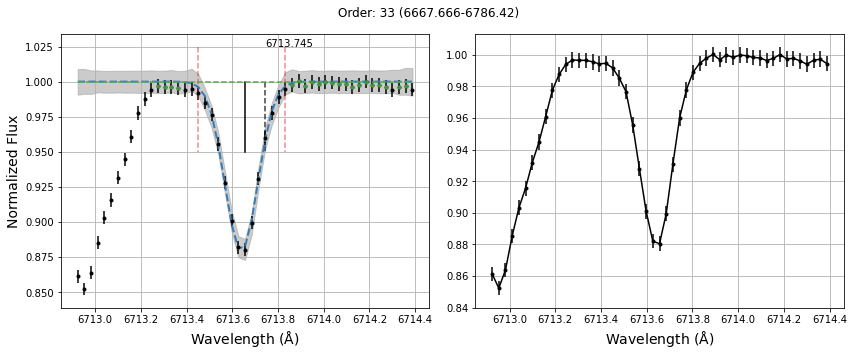

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6716.222 - Line found: 6716.145761988506
EW: 15.74 ± 0.7 simps-int: 15.7 ± 1.23


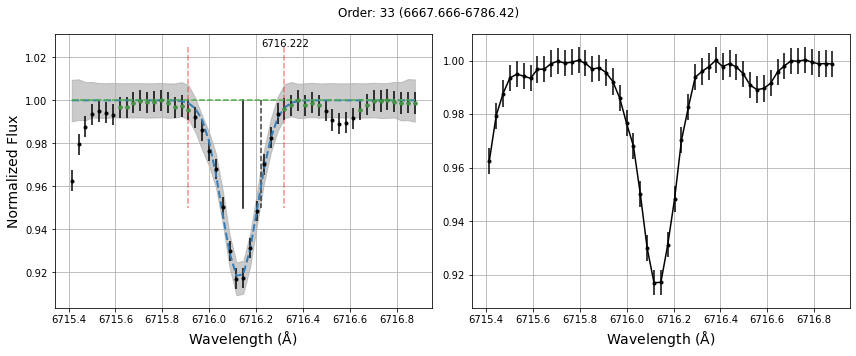

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6725.353 - Line found: 6725.255906094861
EW: 17.92 ± 0.6 simps-int: 17.92 ± 0.6


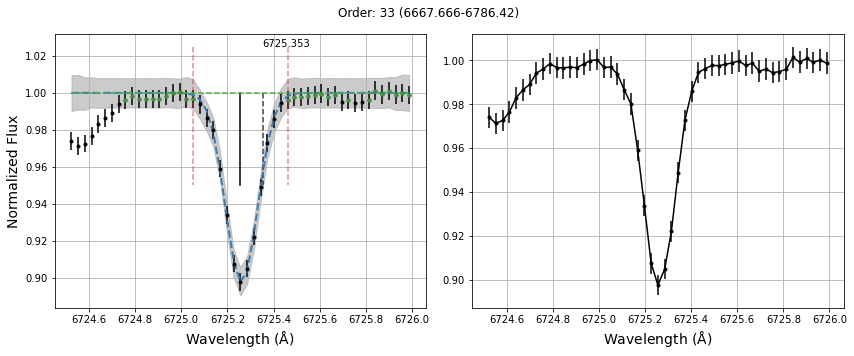

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6726.666 - Line found: 6726.574094148835
EW: 47.55 ± 0.58 simps-int: 47.54 ± 0.58


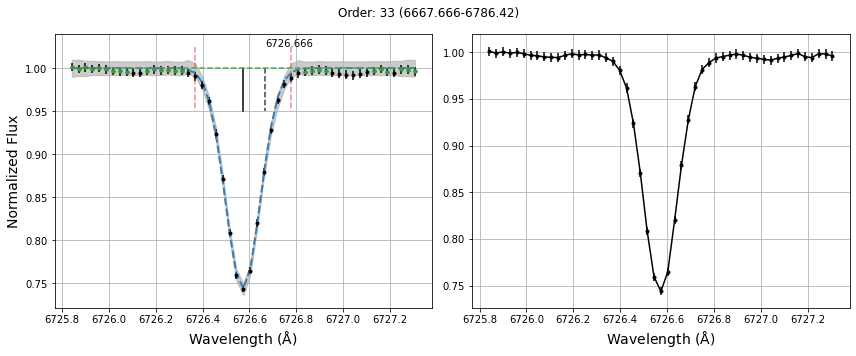

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6733.151 - Line found: 6733.077155215107
EW: 26.99 ± 0.58 simps-int: 26.99 ± 0.58


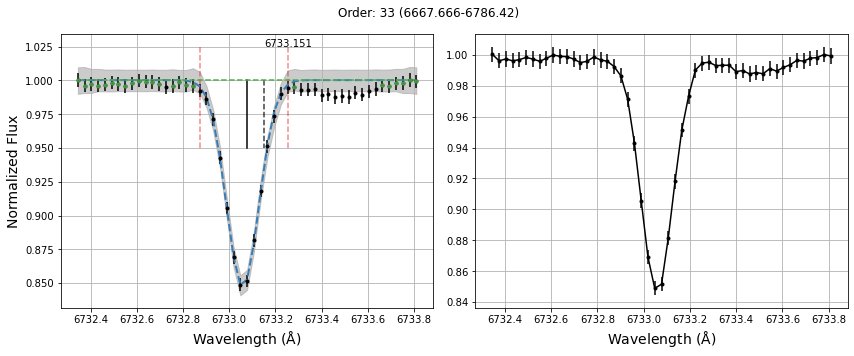

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 6739.52 - Line found: 6739.433750942049
EW: 10.94 ± 0.61 simps-int: 10.91 ± 0.97


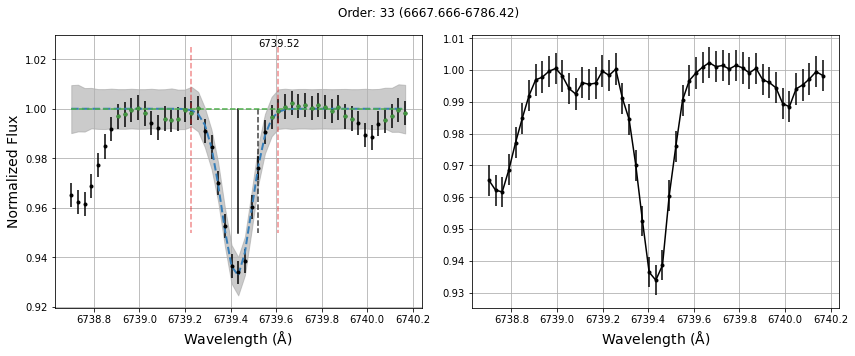

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6745.09 - Line found: 6744.999433836607
EW: 9.25 ± 0.69 simps-int: 9.21 ± 1.05


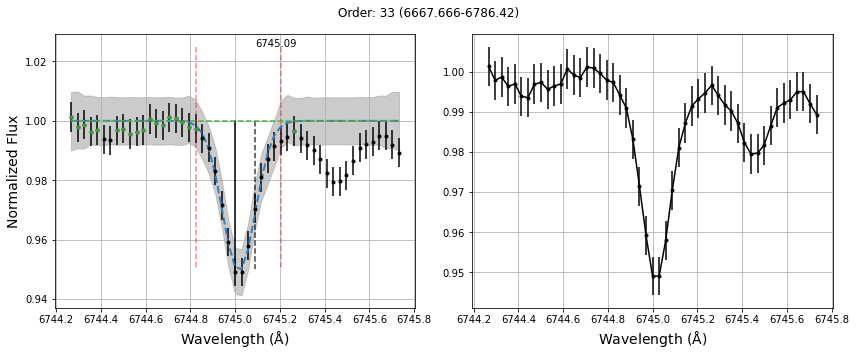

#-----------------------#
line to measure: Fe I 6745.957 - Line found: 6745.87822587259
EW: 8.49 ± 0.74 simps-int: 8.42 ± 1.3


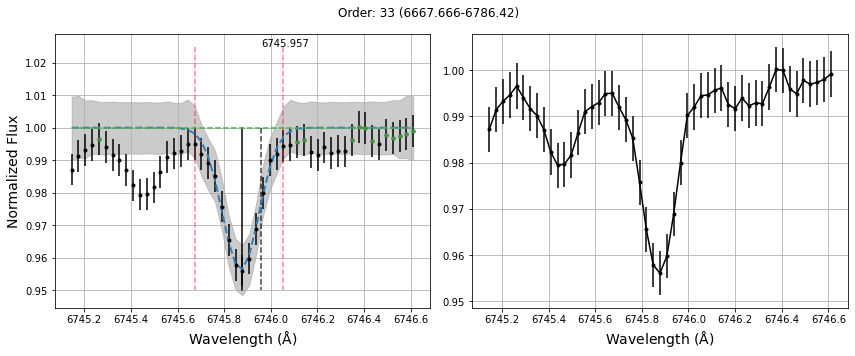

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6750.15 - Line found: 6750.067134577441
EW: 74.31 ± 2.25 simps-int: 73.97 ± 7.35


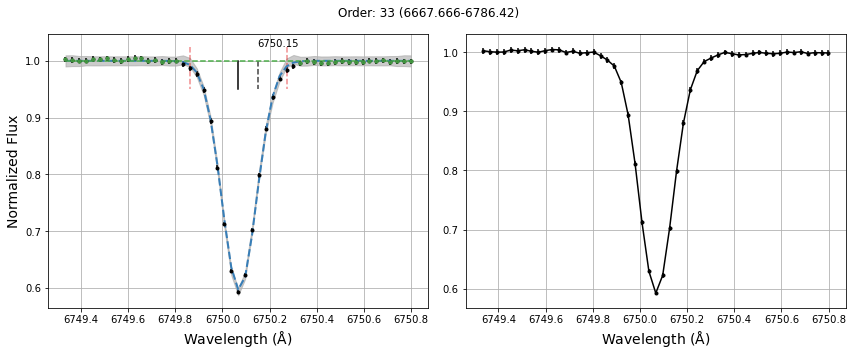

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 6752.716 - Line found: 6752.644924549657
EW: 37.64 ± 0.59 simps-int: 37.64 ± 0.59


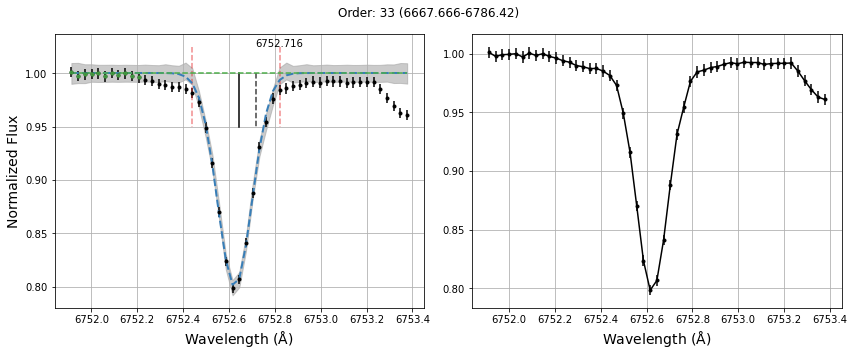

#-----------------------#


/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe I 7114.549 - Line found: 7114.465022483048
EW: 7.63 ± 0.6 simps-int: 7.61 ± 0.76


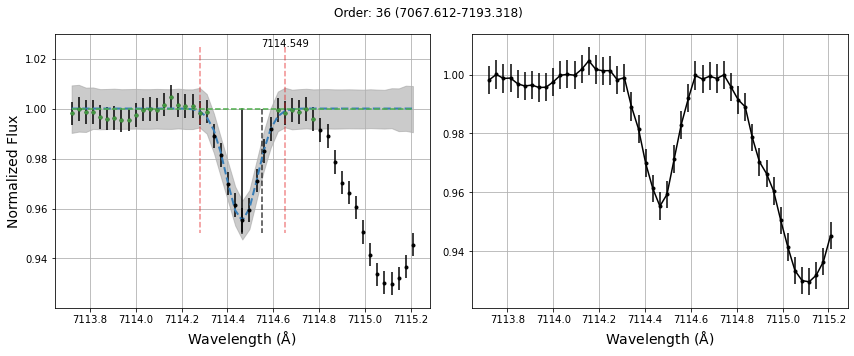

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0


line to measure: Fe I 7284.835 - Line found: 7284.858514630184
EW: 10.25 ± 22.03 simps-int: 4.0 ± 11.62


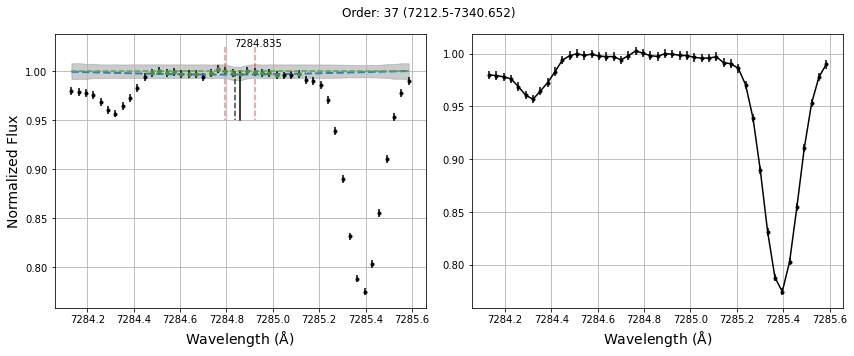

#-----------------------#


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_func.py:160: RuntimeWarning: invalid value encountered in sqrt
  return bf, np.sqrt(np.diag(cov)), p0
/Users/georgevejar/opt/anaconda3/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


line to measure: Fe II 7222.394 - Line found: 7222.363040122224
EW: 8.86 ± 17.82 simps-int: 3.32 ± 7.08


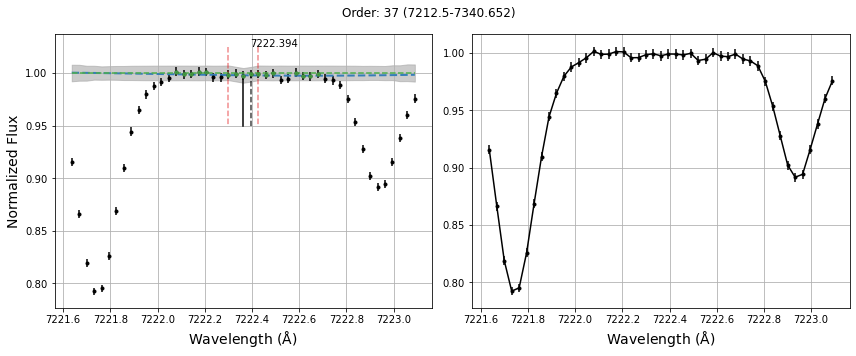

#-----------------------#
line to measure: Fe II 7449.335 - Line found: 7449.242226813146
EW: 20.72 ± 0.62 simps-int: 20.72 ± 0.62


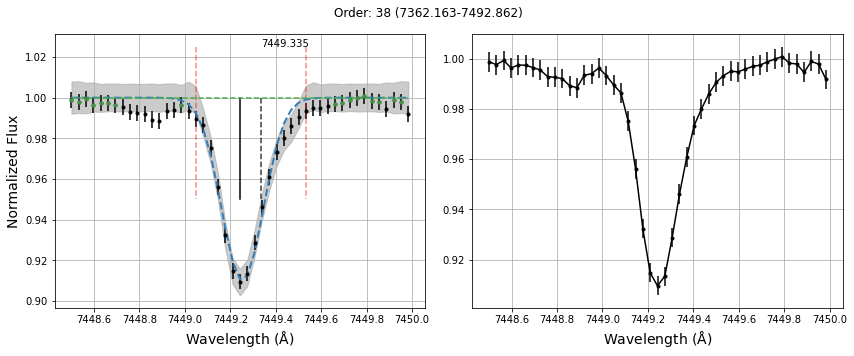

#-----------------------#
line to measure: Fe II 7711.723 - Line found: 7711.626476358166
EW: 47.7 ± 0.59 simps-int: 47.69 ± 0.59


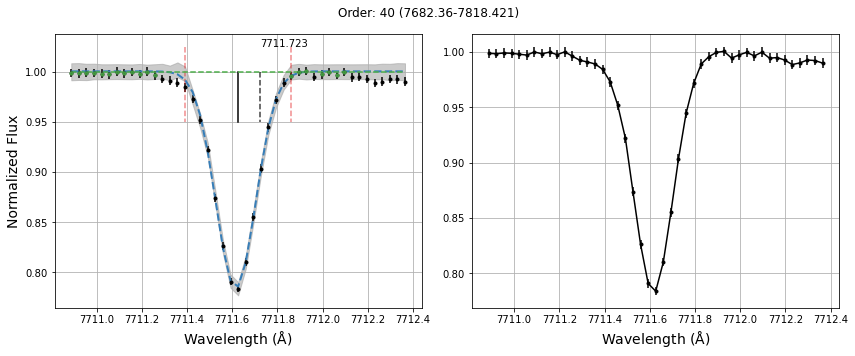

#-----------------------#


In [25]:
#%matplotlib inline
plot_lines = HebeA.lines
HebeA.measure_all_ew(plot_lines = plot_lines, save_all=True)

line to measure: Fe I 4788.757 - Line found: 4788.705483188667
EW: 66.25 ± 0.48 simps-int: 66.24 ± 0.48


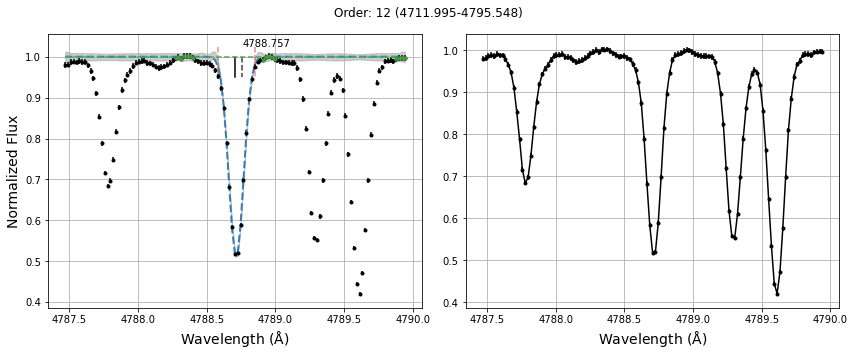

#-----------------------#


In [29]:
HebeA.measure_line_ew(4788.757, save_plot = True, window_size=2.5)

In [29]:
print(u"\u00B1")

±


In [27]:
HebeA.check_for_flags()

4788.757 might have a bad fit 0.0010021258177580975
5322.041 might be too shallow 0.0
5379.574 has more than a 10% error 16.77
5560.207 might have a bad fit 0.0011383665947955759
6240.645 might have a bad fit 0.0014238330896406463
6297.793 might have a bad fit 0.02105646910999155
7284.835 has more than a 10% error 26.56
4620.521 might have a bad fit 0.001964043727369382
5197.577 might have a bad fit 0.0015610595588757825
7222.394 has more than a 10% error 12.44


/Users/georgevejar/Documents/GitHub/XSpect/XSpect-EW/XSpect_EW_class.py:548: RuntimeWarning: invalid value encountered in double_scalars
  if self.lines_ew_err[i]/self.lines_ew[i] >= .1:


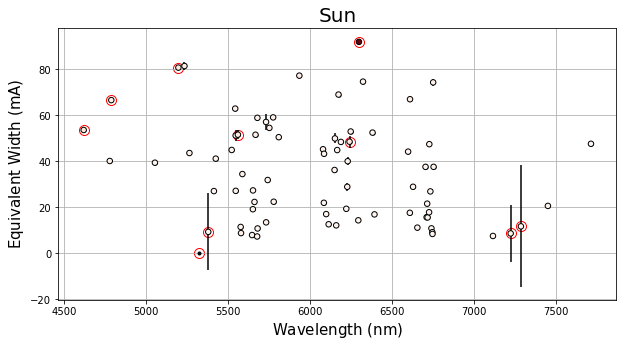

In [28]:
plot_line_info(HebeA, 'Sun')

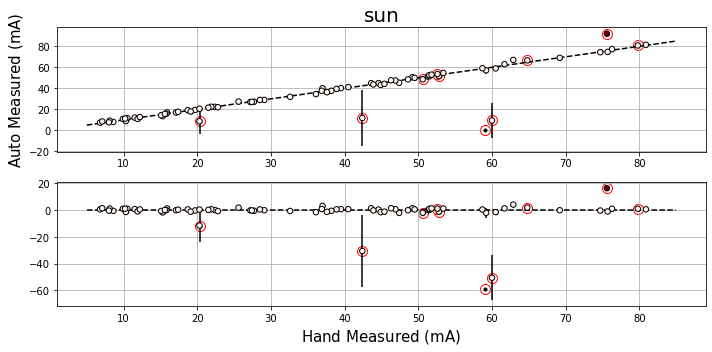

In [29]:
%matplotlib inline
plot_comparison_res(HebeA, ews, 'sun', xy = [5,85])

In [30]:
HebeA.save_object('Hebe_combined.obj')

In [4]:
Hebe = load_object('Hebe_combined.obj')

In [48]:
def plot_axes(ax, fig=None):
    if fig is None:
        fig = plt.figure()
    ax = fig.axes.append(ax)
    return fig

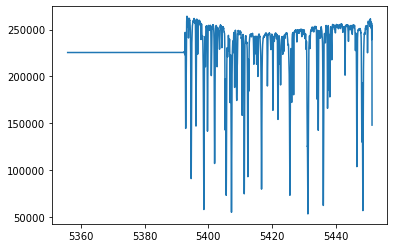

In [56]:
fig = plt.figure()
ax = fig.add_subplot()
ax.plot(Hebe.wavelength[20], Hebe.flux[20])


In [30]:
def p_save(obj, filename):
    with open(filename,'wb') as f:
        pickle.dump(HebeA, f)
    

In [32]:
def p_load(filename):
with open(filename, 'rb') as f:
    Hebe = pickle.load(f)

In [39]:
Hebe.wavelength[0]

array([4063.48443356, 4063.50208388, 4063.51973419, ..., 4135.0035102 ,
       4135.02116052, 4135.03881083])

In [33]:
#linelist_path = '/Users/georgevejar/Documents/GitHub/Spectrum_project/Sun_ew_test1.txt'
linelist_path = Path('../Line_list_sample/Sun_ele_sample.txt')
lines = np.genfromtxt(linelist_path, skip_header = 1, usecols = 0)
elmnt = np.genfromtxt(linelist_path, skip_header = 1, usecols = 1)
EP = np.genfromtxt(linelist_path, skip_header = 1, usecols = 2)
OS = np.genfromtxt(linelist_path, skip_header = 1, usecols = 3)
ex = np.genfromtxt(linelist_path, skip_header = 1, usecols = 4)
ews = np.genfromtxt(linelist_path, skip_header = 1, usecols = 5)

#Load lines into class
HebeA.load_lines(linelist_path)

line to measure: Mg I 4730.029 - Line found: 4729.971115530204
4730.029 70.05 0.59 simps-int: 70.05 0.59


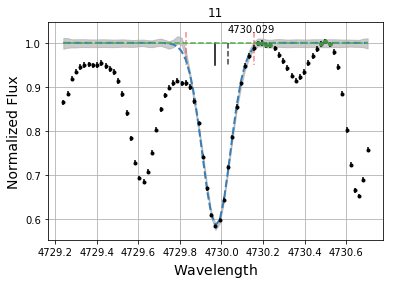

#-----------------------#
line to measure: S I 4694.113 - Line found: 4694.030741005064
4694.113 37.52 1.16 simps-int: 37.52 1.16


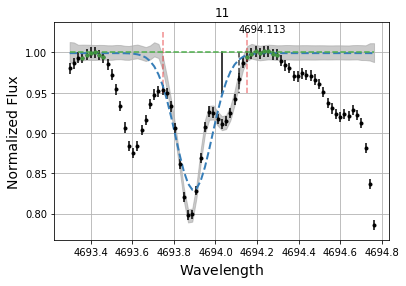

#-----------------------#
line to measure: S I 4695.443 - Line found: 4695.372406569916
4695.443 5.12 0.49 simps-int: 5.12 0.49


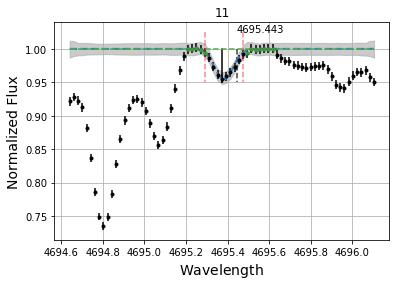

#-----------------------#
line to measure: Zn I 4722.153 - Line found: 4722.104076536296
4722.153 69.29 0.55 simps-int: 69.28 0.55


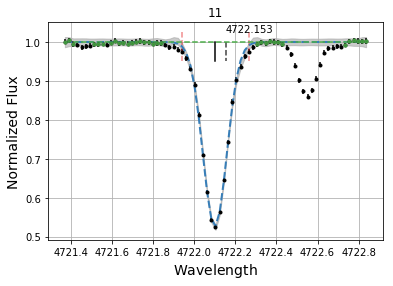

#-----------------------#
line to measure: Mg I 4730.029 - Line found: 4729.966934311395
4730.029 65.63 0.6 simps-int: 65.62 0.6


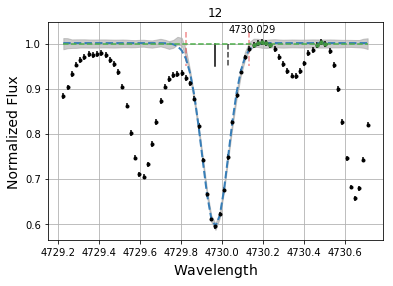

#-----------------------#
line to measure: Ti II 4779.985 - Line found: 4779.925615882801
4779.985 64.2 0.52 simps-int: 64.2 0.52


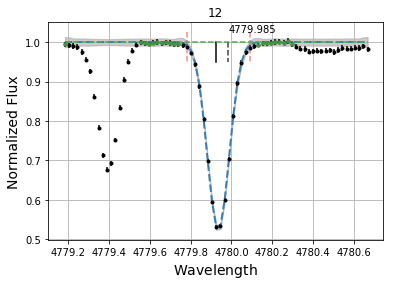

#-----------------------#
line to measure: Zn I 4722.153 - Line found: 4722.093907760125
4722.153 71.7 0.56 simps-int: 71.69 0.56


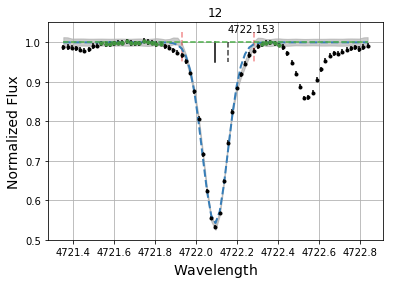

#-----------------------#
line to measure: Ti II 4779.985 - Line found: 4779.910452898699
4779.985 64.86 0.51 simps-int: 64.85 0.51


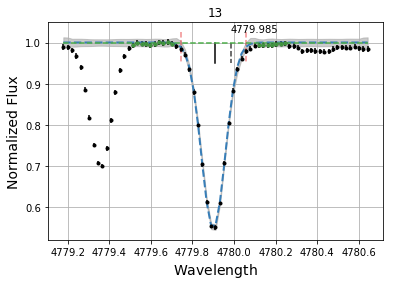

#-----------------------#
line to measure: C I 5052.167 - Line found: 5052.083739915936
5052.167 31.09 0.88 simps-int: 31.02 2.28


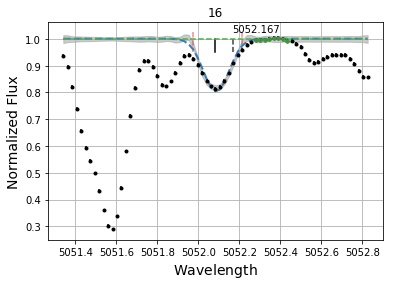

#-----------------------#
line to measure: Ti I 5039.957 - Line found: 5039.88909210876
5039.957 74.9 0.59 simps-int: 74.89 0.59


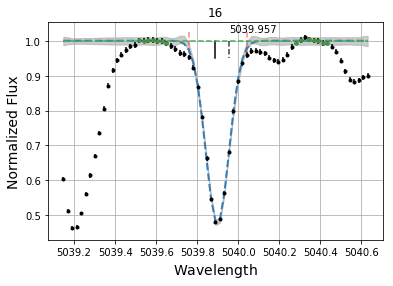

#-----------------------#
line to measure: Ti I 5064.653 - Line found: 5064.605614408457
5064.653 87.87 0.65 simps-int: 87.87 0.65


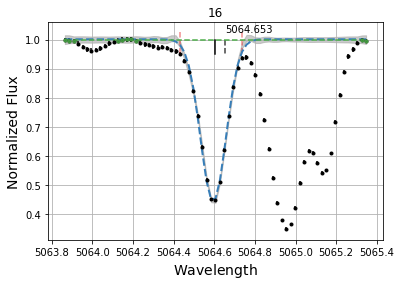

#-----------------------#
line to measure: Ti I 5024.844 - Line found: 5024.771219245839
5024.844 71.13 0.63 simps-int: 71.13 0.63


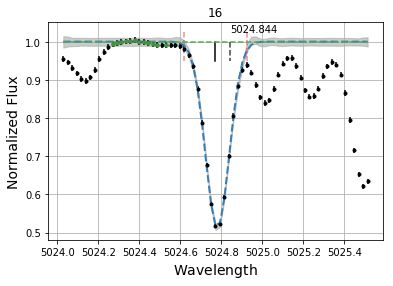

#-----------------------#
line to measure: Ti I 5022.868 - Line found: 5022.807859133772
5022.868 71.23 0.59 simps-int: 71.23 0.59


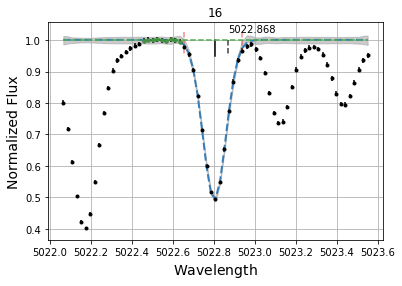

#-----------------------#
line to measure: C I 5052.167 - Line found: 5052.0790456007035
5052.167 29.08 3.84 simps-int: 29.02 4.28


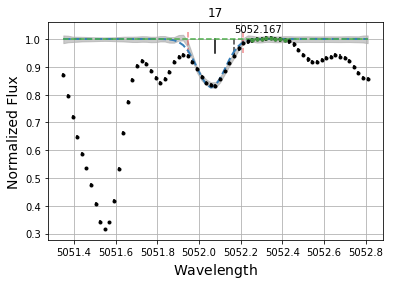

#-----------------------#
line to measure: Ti I 5064.653 - Line found: 5064.586308548473
5064.653 88.65 4.69 simps-int: 88.26 9.46


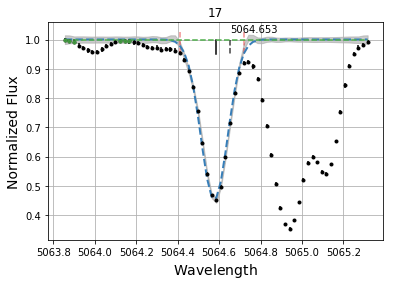

#-----------------------#
line to measure: Ti I 5210.385 - Line found: 5210.316588064014
5210.385 88.24 0.71 simps-int: 88.23 0.71


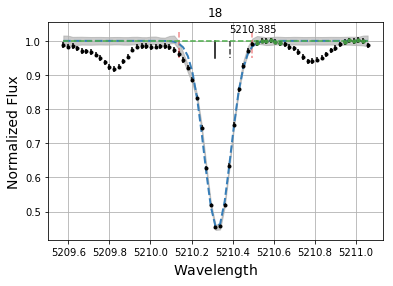

#-----------------------#
line to measure: Ti II 5154.068 - Line found: 5153.991584024689
5154.068 71.82 0.74 simps-int: 71.81 0.74


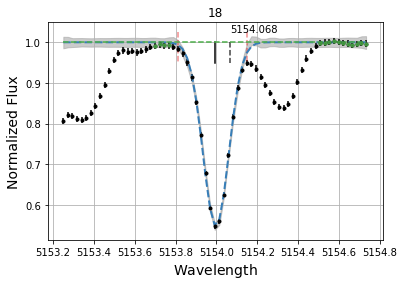

#-----------------------#
line to measure: Ti I 5210.385 - Line found: 5210.317024355588
5210.385 88.49 0.69 simps-int: 88.49 0.69


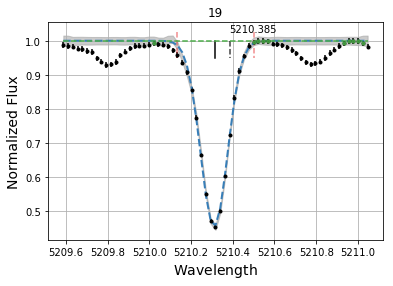

#-----------------------#
line to measure: C I 5380.337 - Line found: 5354.889716395601
5380.337 12.98 28.67 simps-int: 6.23 22.97


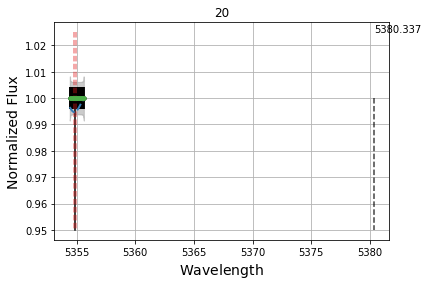

#-----------------------#
line to measure: Ti II 5381.021 - Line found: 5354.889716395601
5381.021 12.97 29.24 simps-int: 0.48 26.76


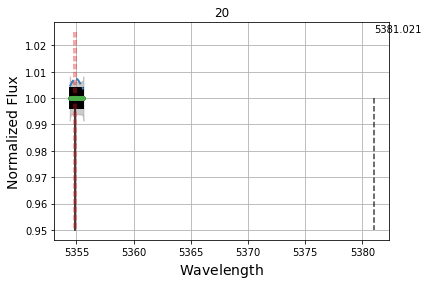

#-----------------------#
line to measure: Mn I 5432.546 - Line found: 5432.475003479967
5432.546 50.38 1.07 simps-int: 50.27 3.55


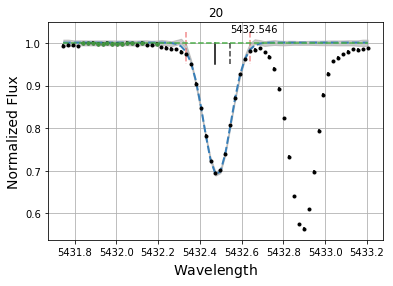

#-----------------------#
line to measure: Mn I 5399.499 - Line found: 5399.418969043416
5399.499 38.78 0.43 simps-int: 38.78 0.43


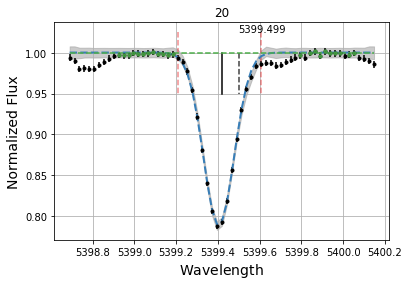

#-----------------------#
line to measure: Na I 5682.633 - Line found: 5682.571161502852
5682.633 106.56 0.51 simps-int: 106.55 0.51


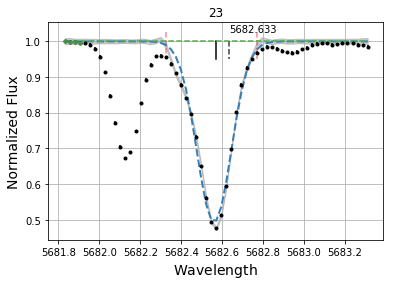

#-----------------------#
line to measure: Si I 5701.104 - Line found: 5701.0363483958245
5701.104 37.94 0.41 simps-int: 37.94 0.41


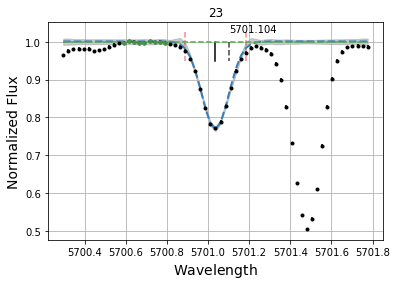

#-----------------------#
line to measure: Si I 5690.425 - Line found: 5690.361547428325
5690.425 48.65 0.44 simps-int: 48.65 0.44


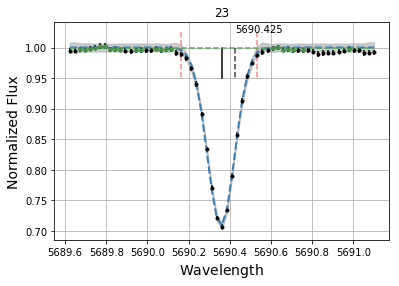

#-----------------------#
line to measure: Si I 5708.4 - Line found: 5708.333671920951
5708.4 75.89 3.18 simps-int: 75.88 3.18


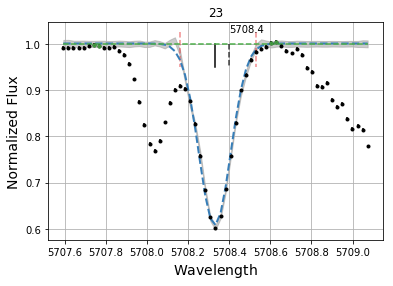

#-----------------------#
line to measure: Cr I 5702.306 - Line found: 5702.244351276673
5702.306 24.37 0.42 simps-int: 24.37 0.42


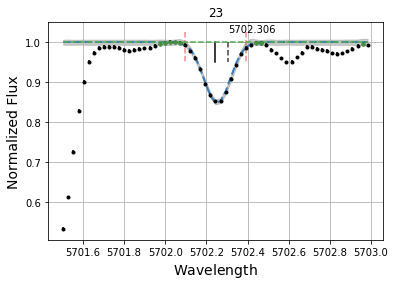

#-----------------------#
line to measure: Co I 5647.234 - Line found: 5647.144628037964
5647.234 14.22 0.43 simps-int: 14.21 0.43


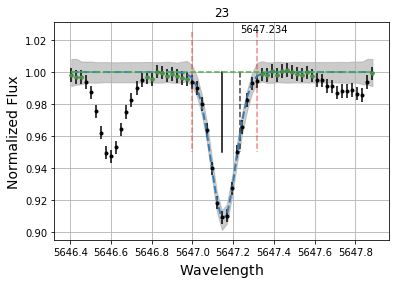

#-----------------------#
line to measure: Mg I 5711.088 - Line found: 5710.998405551048
5711.088 104.91 0.51 simps-int: 104.91 0.51


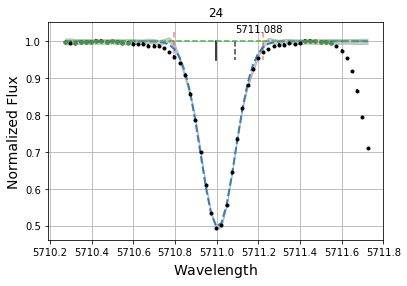

#-----------------------#
line to measure: Si I 5701.104 - Line found: 5701.026385241516
5701.104 37.15 0.42 simps-int: 37.15 0.42


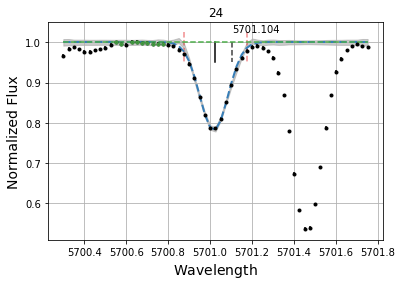

#-----------------------#
line to measure: Si I 5708.4 - Line found: 5708.317485518083
5708.4 74.95 0.44 simps-int: 74.95 0.44


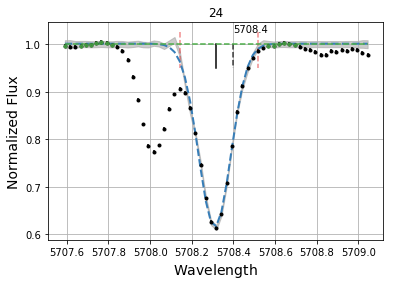

#-----------------------#
line to measure: Si I 5772.149 - Line found: 5772.058238451368
5772.149 53.69 0.5 simps-int: 53.69 0.5


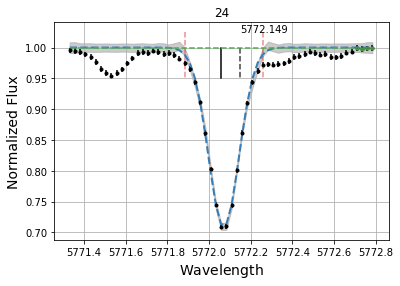

#-----------------------#
line to measure: Ti I 5739.469 - Line found: 5739.3860915075775
5739.469 8.45 0.42 simps-int: 8.45 0.42


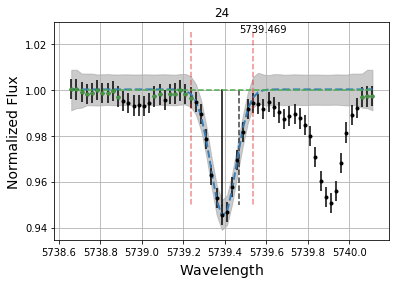

#-----------------------#
line to measure: V I 5737.059 - Line found: 5736.980780076133
5737.059 12.11 0.57 simps-int: 12.11 0.57


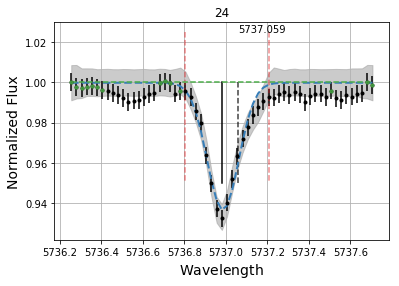

#-----------------------#
line to measure: V I 5727.048 - Line found: 5726.95864911178
5727.048 39.47 0.47 simps-int: 39.47 0.47


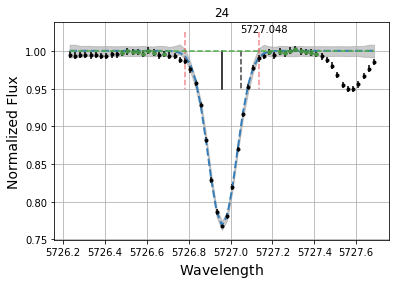

#-----------------------#
line to measure: Cr I 5787.918 - Line found: 5787.843094720224
5787.918 46.61 2.39 simps-int: 46.4 4.98


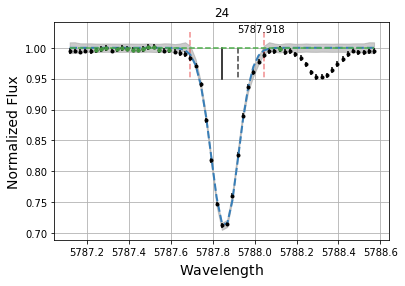

#-----------------------#
line to measure: Cr I 5783.85 - Line found: 5783.784131679661
5783.85 43.24 1.42 simps-int: 43.15 3.18


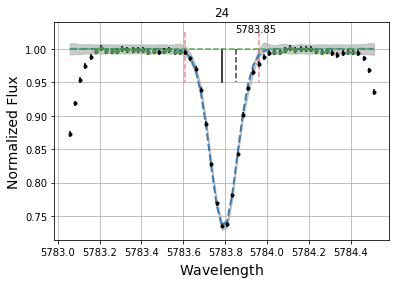

#-----------------------#
line to measure: Cr I 5783.063 - Line found: 5783.007416529924
5783.063 31.4 0.47 simps-int: 31.4 0.47


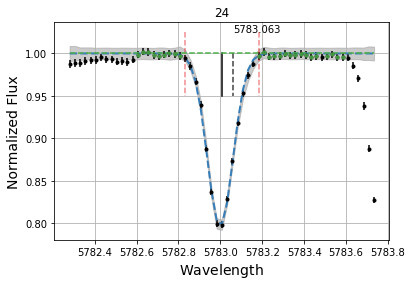

#-----------------------#
line to measure: Cr I 5702.306 - Line found: 5702.229040957239
5702.306 23.17 0.42 simps-int: 23.17 0.42


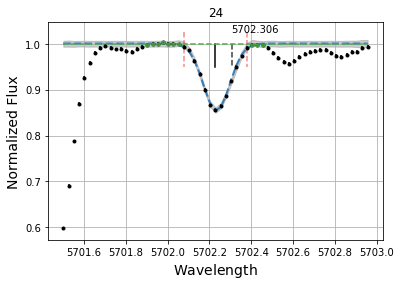

#-----------------------#
line to measure: Ni I 5748.346 - Line found: 5748.280732738441
5748.346 28.85 0.91 simps-int: 28.71 2.89


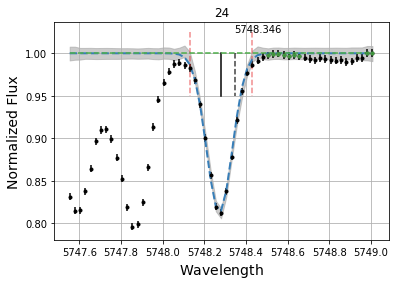

#-----------------------#
line to measure: Ni I 5754.655 - Line found: 5754.569619918572
5754.655 81.59 4.09 simps-int: 81.23 8.71


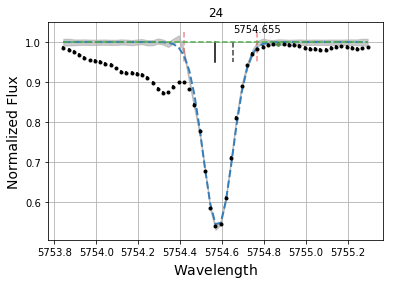

#-----------------------#
line to measure: Ni I 5760.828 - Line found: 5760.75828578906
5760.828 35.29 0.44 simps-int: 35.29 0.44


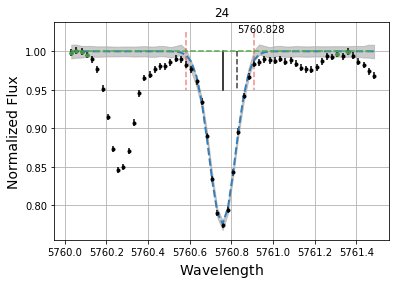

#-----------------------#
line to measure: Cu I 5782.127 - Line found: 5782.05531408831
5782.127 78.71 0.49 simps-int: 78.71 0.49


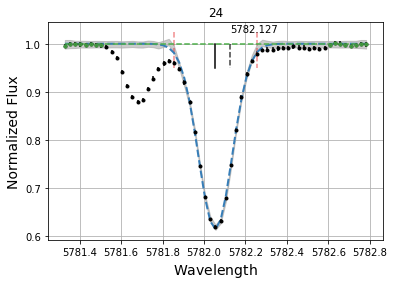

#-----------------------#
line to measure: Ca I 5867.562 - Line found: 5867.5050056631835
5867.562 24.0 0.63 simps-int: 23.94 1.77


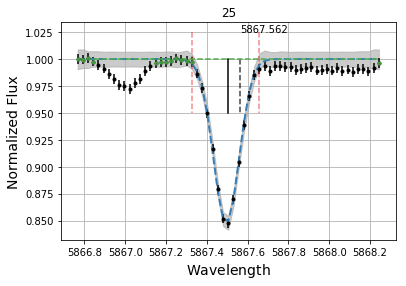

#-----------------------#
line to measure: Ti I 5866.451 - Line found: 5866.3842909174155
5866.451 48.87 0.43 simps-int: 48.87 0.43


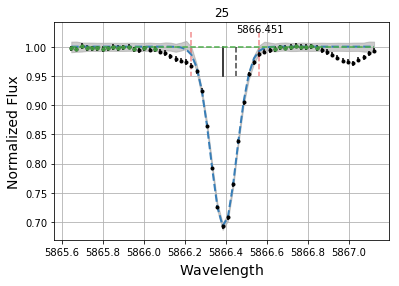

#-----------------------#
line to measure: Ni I 5846.986 - Line found: 5846.924607604534
5846.986 23.61 0.48 simps-int: 23.61 0.48


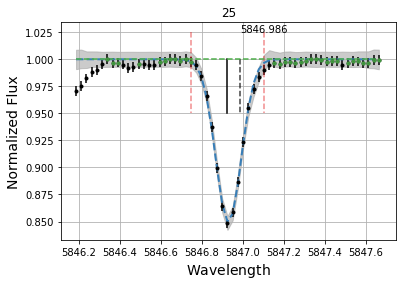

#-----------------------#
line to measure: Ni I 5805.213 - Line found: 5805.152512534997
5805.213 41.42 0.44 simps-int: 41.41 0.44


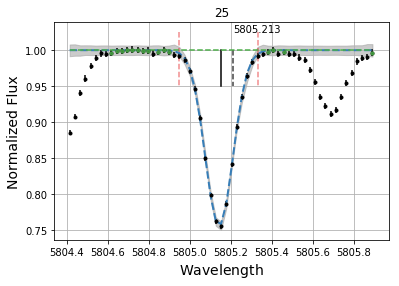

#-----------------------#
line to measure: Ti I 6091.171 - Line found: 6091.111505079382
6091.171 15.21 0.5 simps-int: 15.21 0.5


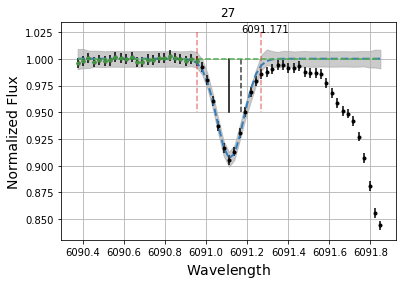

#-----------------------#
line to measure: V I 6081.441 - Line found: 6081.39210248894
6081.441 14.99 0.52 simps-int: 14.98 0.52


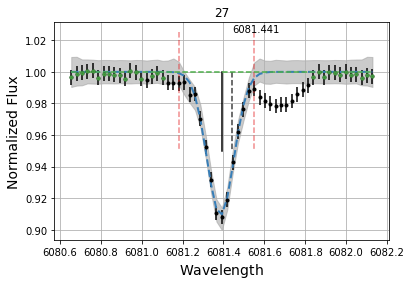

#-----------------------#
line to measure: V I 6090.214 - Line found: 6090.163270680315
6090.214 33.28 0.49 simps-int: 33.28 0.49


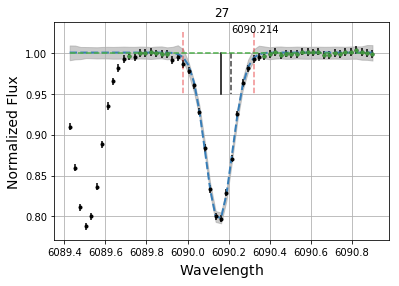

#-----------------------#
line to measure: Co I 6093.143 - Line found: 6093.086993410773
6093.143 8.43 0.51 simps-int: 8.39 0.97


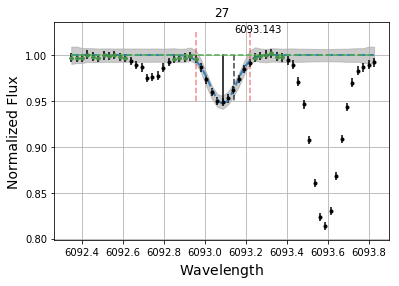

#-----------------------#
line to measure: Na I 6154.226 - Line found: 6154.142384358931
6154.226 37.87 1.0 simps-int: 37.78 2.63


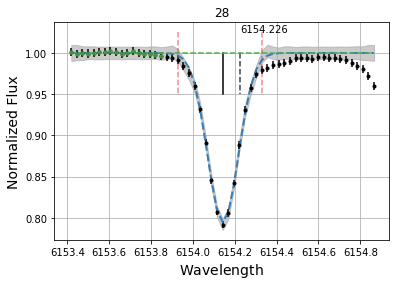

#-----------------------#
line to measure: Na I 6160.747 - Line found: 6160.653564388864
6160.747 53.99 0.51 simps-int: 53.99 0.51


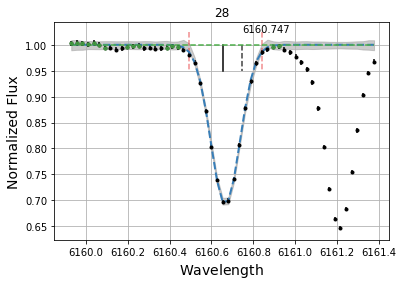

#-----------------------#
line to measure: Si I 6125.021 - Line found: 6124.935856652648
6125.021 32.71 0.58 simps-int: 32.7 0.58


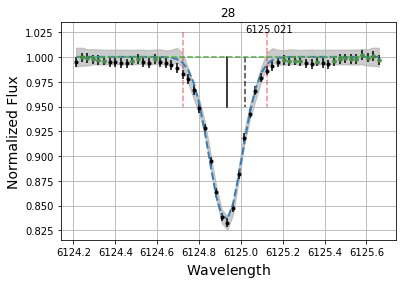

#-----------------------#
line to measure: Si I 6145.016 - Line found: 6144.924911394746
6145.016 39.07 0.59 simps-int: 39.07 0.59


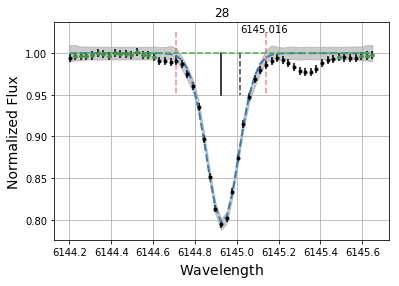

#-----------------------#
line to measure: Si I 6142.483 - Line found: 6142.406183317324
6142.483 33.38 0.53 simps-int: 33.38 0.53


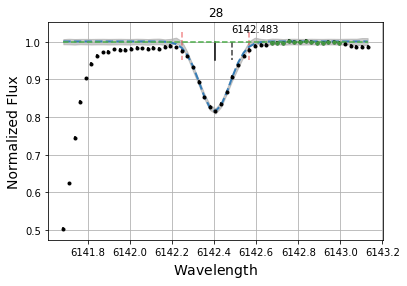

#-----------------------#
line to measure: Ca I 6166.439 - Line found: 6166.360895032385
6166.439 69.9 1.52 simps-int: 69.74 4.85


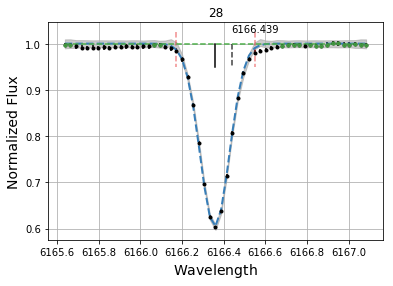

#-----------------------#
line to measure: Ca I 6169.042 - Line found: 6168.960008048449
6169.042 92.1 0.52 simps-int: 92.09 0.52


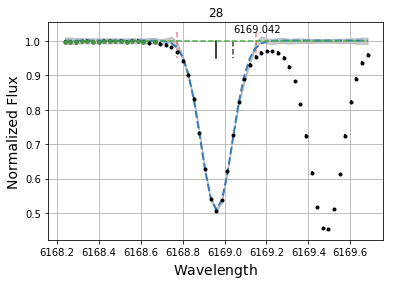

#-----------------------#
line to measure: Ca I 6161.297 - Line found: 6161.216258959352
6161.297 62.12 0.52 simps-int: 62.12 0.52


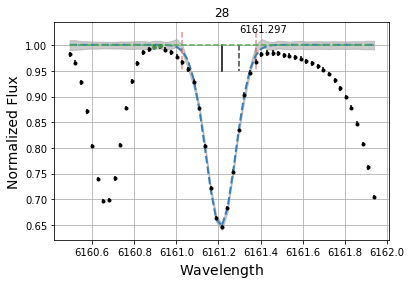

#-----------------------#
line to measure: Ca I 6169.563 - Line found: 6169.49590763939
6169.563 111.71 0.55 simps-int: 111.7 0.55


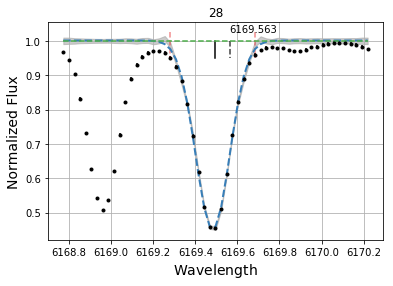

#-----------------------#
line to measure: Ti I 6098.658 - Line found: 6098.569596778352
6098.658 6.32 0.51 simps-int: 6.31 0.64


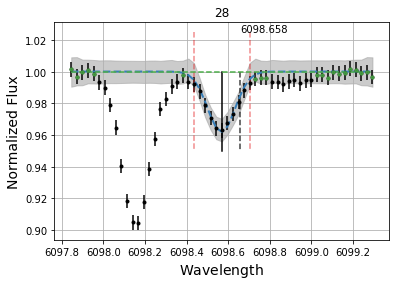

#-----------------------#
line to measure: V I 6111.645 - Line found: 6111.565161858671
6111.645 11.0 0.46 simps-int: 11.0 0.46


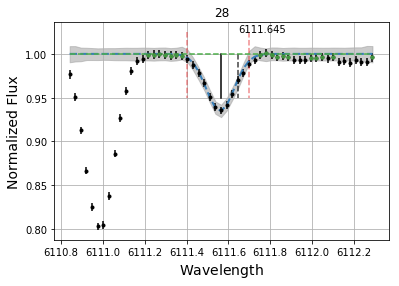

#-----------------------#
line to measure: Co I 6093.143 - Line found: 6093.04983099166
6093.143 10.19 2.5 simps-int: 0.04 10.49


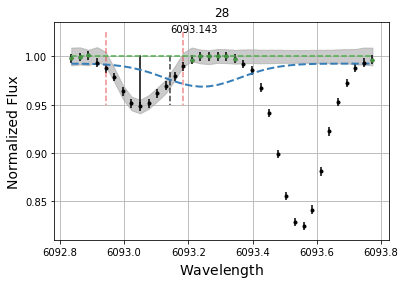

#-----------------------#
line to measure: Ni I 6108.107 - Line found: 6108.02822455846
6108.107 65.13 1.38 simps-int: 64.98 4.58


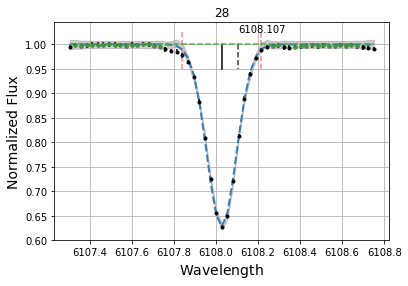

#-----------------------#
line to measure: Ni I 6128.963 - Line found: 6128.874718646064
6128.963 25.95 1.48 simps-int: 25.78 3.31


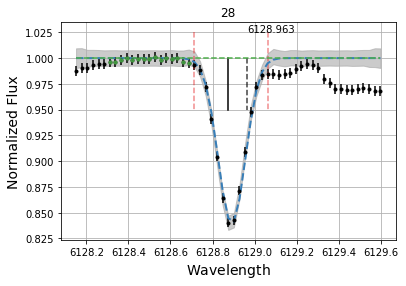

#-----------------------#
line to measure: Ni I 6177.236 - Line found: 6177.159271789846
6177.236 14.77 0.61 simps-int: 14.7 1.54


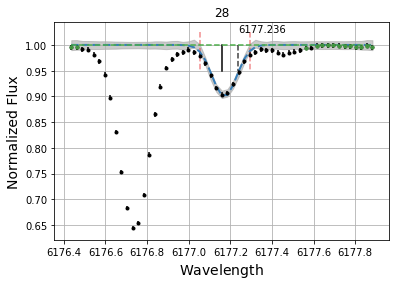

#-----------------------#
line to measure: Ni I 6176.807 - Line found: 6176.730552117093
6176.807 64.83 0.54 simps-int: 64.82 0.54


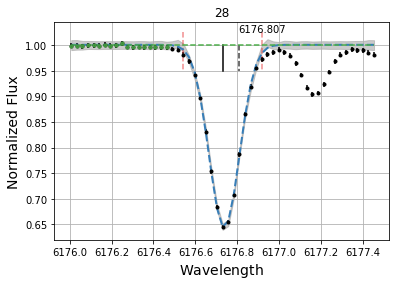

#-----------------------#
line to measure: Ni I 6111.066 - Line found: 6110.975672308636
6111.066 34.69 0.53 simps-int: 34.69 0.53


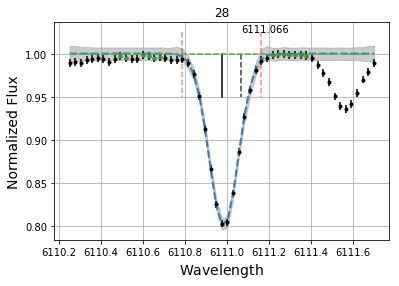

#-----------------------#
line to measure: Ni I 6133.963 - Line found: 6133.885379821362
6133.963 6.25 0.64 simps-int: 6.22 0.86


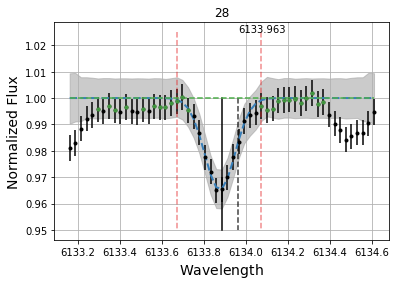

#-----------------------#
line to measure: Ni I 6175.36 - Line found: 6175.283623221552
6175.36 49.87 0.51 simps-int: 49.87 0.51


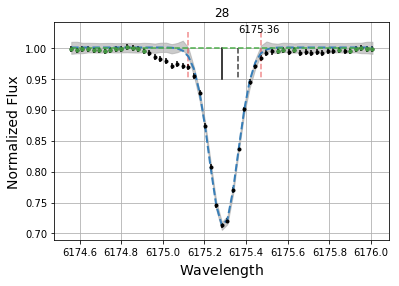

#-----------------------#
line to measure: Ni I 6186.709 - Line found: 6186.644694549501
6186.709 31.44 0.85 simps-int: 31.37 2.23


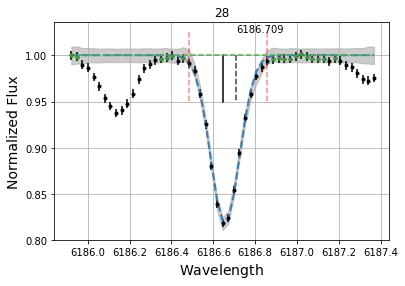

#-----------------------#
line to measure: Ni I 6130.13 - Line found: 6130.053697746134
6130.13 22.92 0.52 simps-int: 22.92 0.52


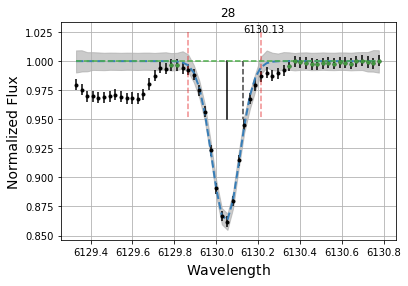

#-----------------------#
line to measure: O I 6300.304 - Line found: 6300.20900283643
6300.304 3.55 9.87 simps-int: 3.02 5.02


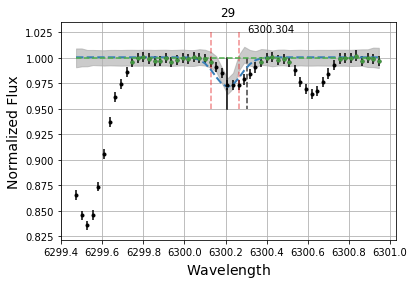

#-----------------------#
line to measure: Si I 6244.466 - Line found: 6244.401223228998
6244.466 44.85 0.58 simps-int: 44.85 0.58


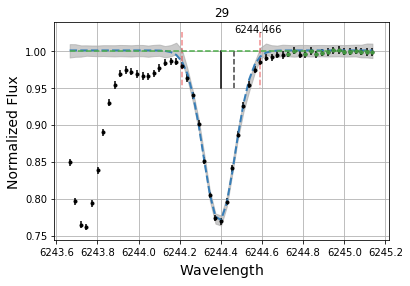

#-----------------------#
line to measure: Si I 6243.815 - Line found: 6243.746906321046
6243.815 44.71 0.53 simps-int: 44.7 0.53


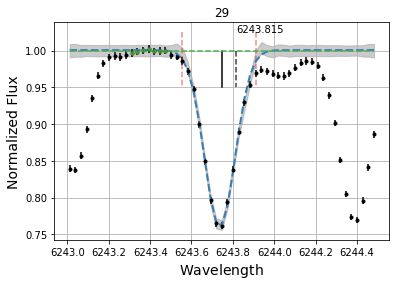

#-----------------------#
line to measure: Sc II 6245.637 - Line found: 6245.546277817914
6245.637 34.45 0.54 simps-int: 34.44 0.54


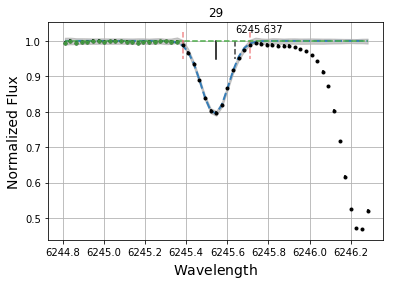

#-----------------------#
line to measure: Ti I 6261.098 - Line found: 6261.031777972786
6261.098 49.85 0.53 simps-int: 49.85 0.53


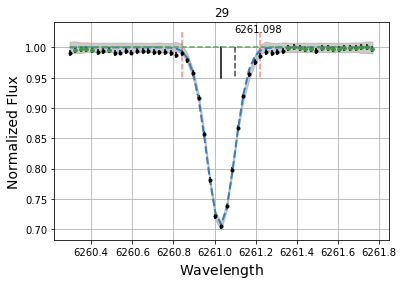

#-----------------------#
line to measure: Ti I 6258.102 - Line found: 6258.032825478004
6258.102 51.11 0.48 simps-int: 51.11 0.48


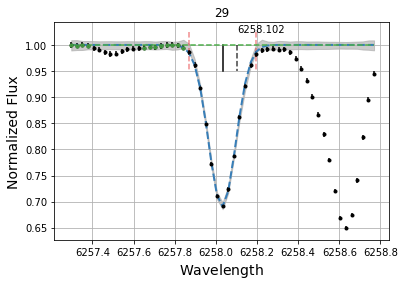

#-----------------------#
line to measure: V I 6285.15 - Line found: 6285.105187544531
6285.15 13.15 0.61 simps-int: 13.15 0.61


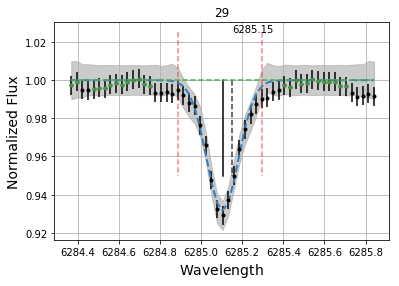

#-----------------------#
line to measure: V I 6251.827 - Line found: 6251.735025238963
6251.827 15.1 0.56 simps-int: 15.07 1.18


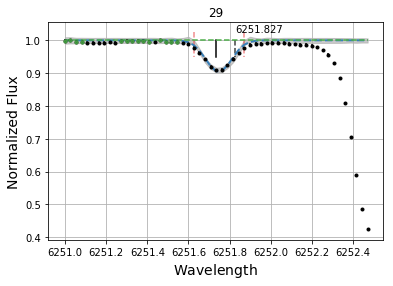

#-----------------------#
line to measure: V I 6224.529 - Line found: 6224.4445575364525
6224.529 3.22 7.67 simps-int: 2.92 3.97


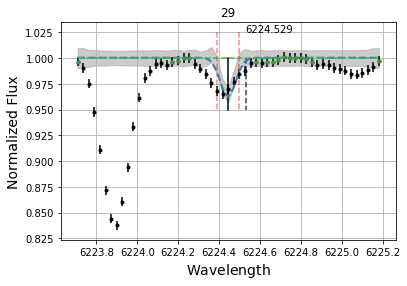

#-----------------------#
line to measure: V I 6243.105 - Line found: 6243.038063004097
6243.105 27.49 1.04 simps-int: 27.29 3.39


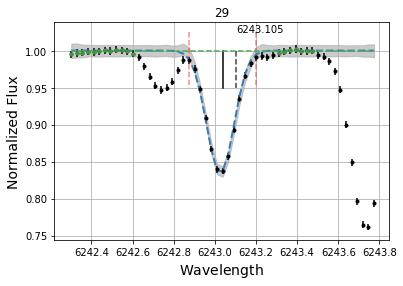

#-----------------------#
line to measure: Ni I 6204.6 - Line found: 6204.515155048405
6204.6 22.55 0.83 simps-int: 22.44 2.29


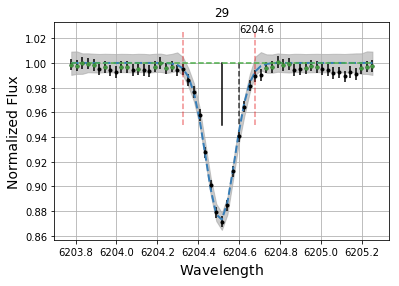

#-----------------------#
line to measure: Ni I 6223.981 - Line found: 6223.899293446492
6223.981 27.47 0.87 simps-int: 27.33 2.81


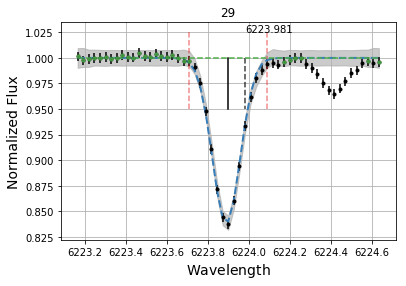

#-----------------------#
line to measure: Ni I 6230.09 - Line found: 6230.006251254047
6230.09 19.86 0.62 simps-int: 19.81 1.47


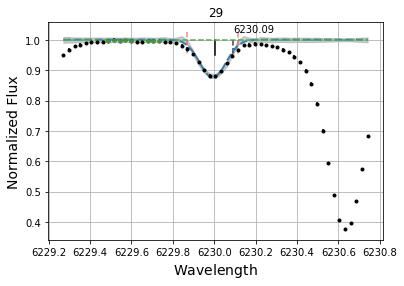

#-----------------------#
line to measure: Si I 6414.98 - Line found: 6414.886210658787
6414.98 37.6 0.57 simps-int: 37.6 0.57


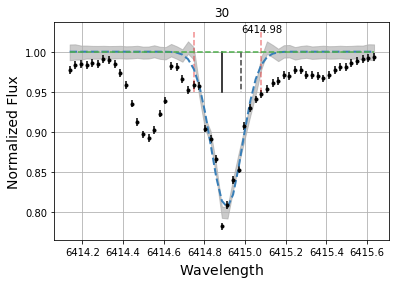

#-----------------------#
line to measure: Sc II 6320.851 - Line found: 6320.7617644956
6320.851 9.75 0.8 simps-int: 9.66 1.54


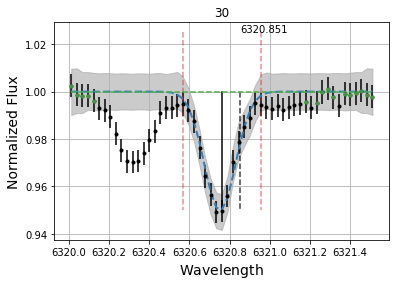

#-----------------------#
line to measure: Cr I 6330.091 - Line found: 6330.002165607729
6330.091 27.02 0.53 simps-int: 27.01 0.53


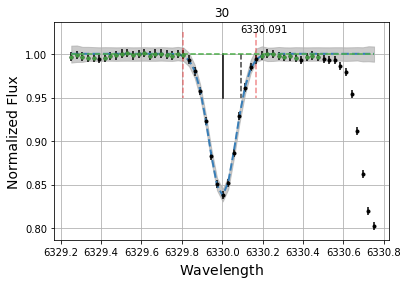

#-----------------------#
line to measure: Ni I 6327.593 - Line found: 6327.504759901748
6327.593 39.49 0.55 simps-int: 39.48 0.55


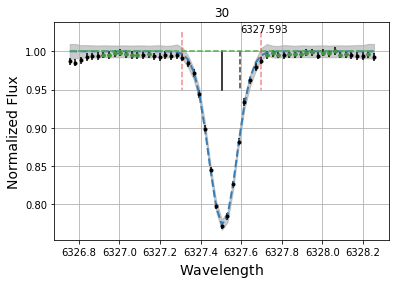

#-----------------------#
line to measure: Ni I 6370.341 - Line found: 6370.265895378597
6370.341 13.59 0.67 simps-int: 13.52 1.5


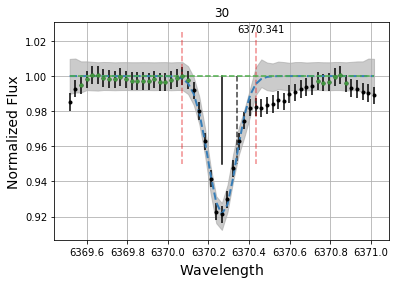

#-----------------------#
line to measure: Ni I 6378.247 - Line found: 6378.174346780869
6378.247 32.85 0.58 simps-int: 32.85 0.58


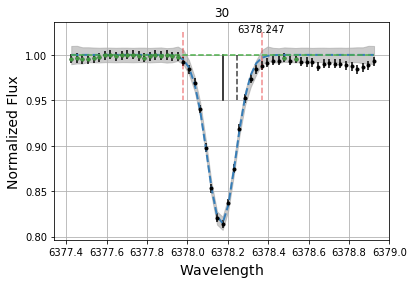

#-----------------------#
line to measure: C I 6587.61 - Line found: 6587.536018220671
6587.61 13.31 1.16 simps-int: 13.12 2.56


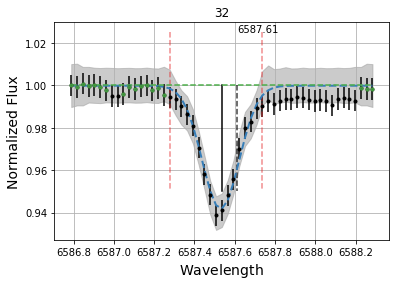

#-----------------------#
line to measure: Ca I 6572.779 - Line found: 6572.694824926388
6572.779 32.38 0.92 simps-int: 32.31 2.29


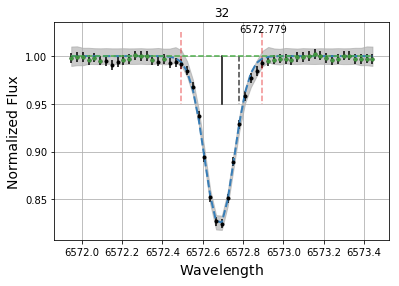

#-----------------------#
line to measure: Sc II 6604.601 - Line found: 6604.505599700569
6604.601 36.56 0.58 simps-int: 36.55 0.58


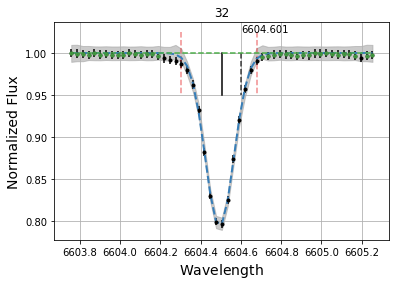

#-----------------------#
line to measure: Co I 6632.433 - Line found: 6632.3759801311135
6632.433 8.68 0.63 simps-int: 8.68 0.63


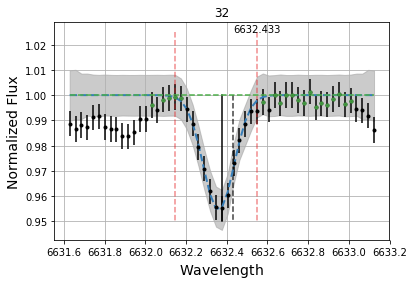

#-----------------------#
line to measure: Co I 6595.864 - Line found: 6595.790712940554
6595.864 7.43 0.82 simps-int: 7.37 1.22


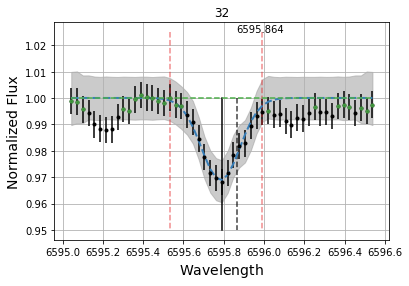

#-----------------------#
line to measure: Ni I 6643.629 - Line found: 6643.5356371043345
6643.629 93.55 0.59 simps-int: 93.55 0.59


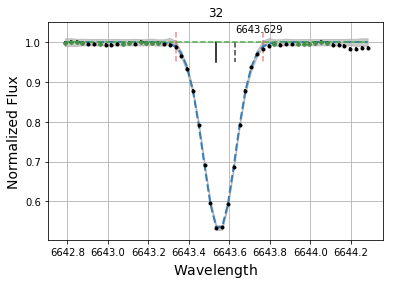

#-----------------------#
line to measure: Ni I 6598.593 - Line found: 6598.494341176334
6598.593 25.99 0.6 simps-int: 25.98 0.6


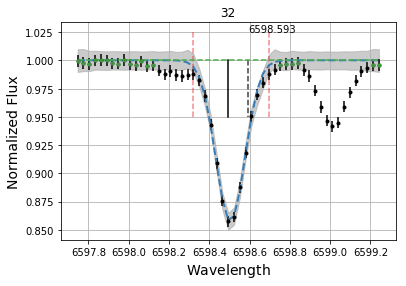

#-----------------------#
line to measure: Ni I 6635.118 - Line found: 6635.0508463643855
6635.118 24.11 0.57 simps-int: 24.1 0.57


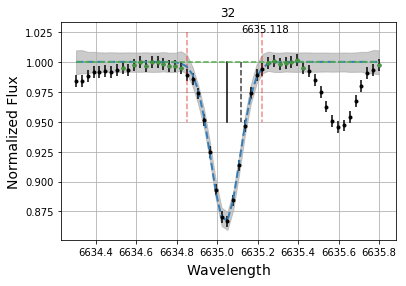

#-----------------------#
line to measure: Al I 6696.023 - Line found: 6695.933545160902
6696.023 38.23 0.64 simps-int: 38.23 0.64


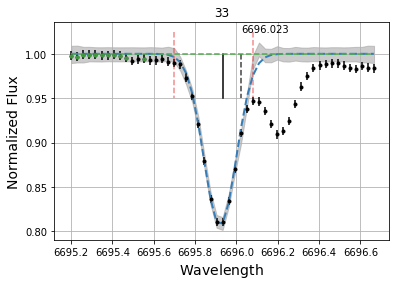

#-----------------------#
line to measure: Al I 6698.673 - Line found: 6698.599214336717
6698.673 21.42 0.61 simps-int: 21.42 0.6


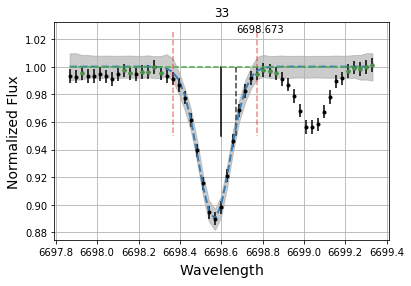

#-----------------------#
line to measure: Si I 6741.628 - Line found: 6741.542851828408
6741.628 15.73 0.72 simps-int: 15.64 1.8


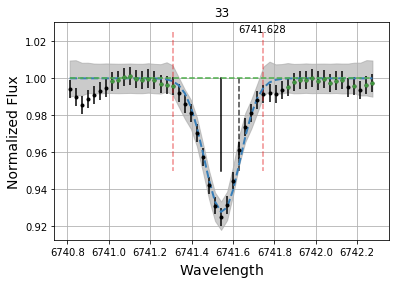

#-----------------------#
line to measure: S I 6757.171 - Line found: 6757.097470865303
6757.171 17.29 1.13 simps-int: 17.19 2.13


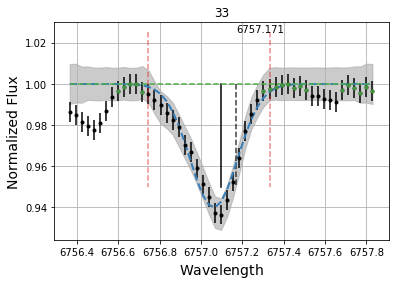

#-----------------------#
line to measure: Ni I 6767.768 - Line found: 6767.701561432828
6767.768 79.23 0.54 simps-int: 79.22 0.54


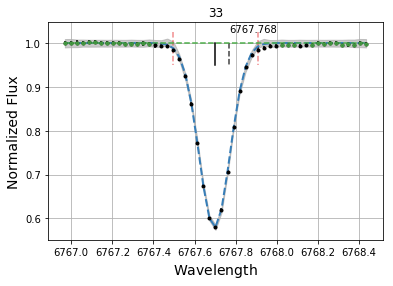

#-----------------------#
line to measure: Mg I 6841.19 - Line found: 6841.111247496265
6841.19 8.74 16.77 simps-int: 3.81 10.14


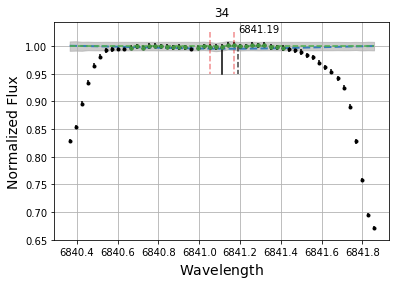

#-----------------------#
line to measure: Si I 6848.58 - Line found: 6848.630869615299
6848.58 7.54 18.33 simps-int: 3.71 10.87


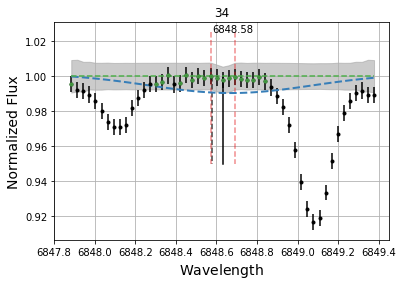

#-----------------------#
line to measure: Co I 6814.942 - Line found: 6815.0014484718395
6814.942 7.57 11.74 simps-int: 3.61 8.48


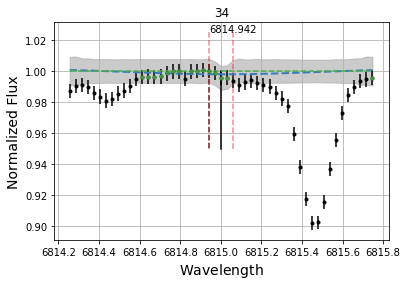

#-----------------------#
line to measure: Ni I 6842.035 - Line found: 6841.946761065046
6842.035 25.55 0.39 simps-int: 25.55 0.39


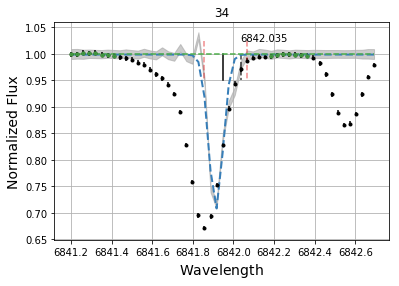

#-----------------------#
line to measure: Mg I 6965.409 - Line found: 6929.608964104034
6965.409 6.82 9.06 simps-int: 3.02 7.95


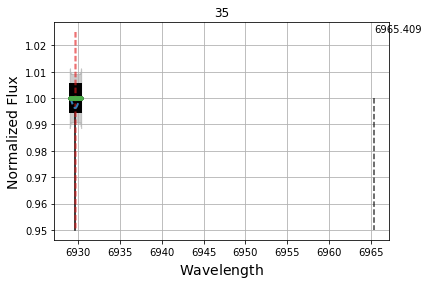

#-----------------------#
line to measure: Si I 7003.569 - Line found: 7003.501965155017
7003.569 33.67 0.82 simps-int: 33.67 0.82


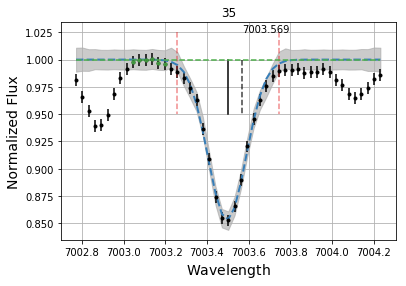

#-----------------------#
line to measure: Cr I 6978.397 - Line found: 6929.608964104034
6978.397 12.07 25.41 simps-int: 3.51 13.83


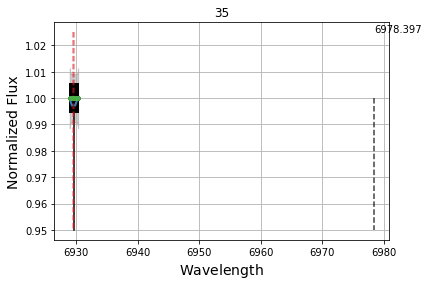

#-----------------------#
line to measure: Cr I 6979.795 - Line found: 6929.608964104034
6979.795 12.06 26.56 simps-int: 3.81 17.4


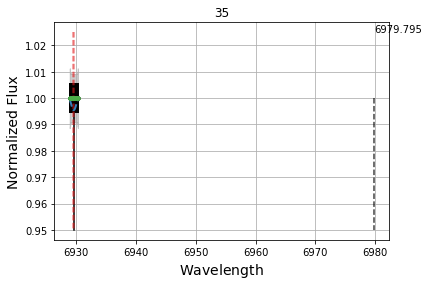

#-----------------------#
line to measure: C I 7111.469 - Line found: 7111.39522603283
7111.469 3.8 6.53 simps-int: 3.69 3.98


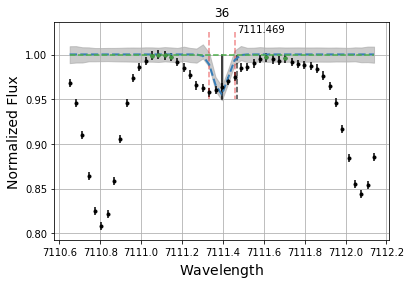

#-----------------------#
line to measure: C I 7113.179 - Line found: 7113.100668505173
7113.179 22.25 1.01 simps-int: 22.15 2.34


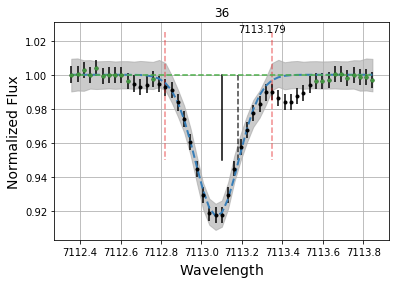

#-----------------------#
line to measure: Ti I 7138.906 - Line found: 7138.837345815088
7138.906 7.02 0.65 simps-int: 7.01 0.75


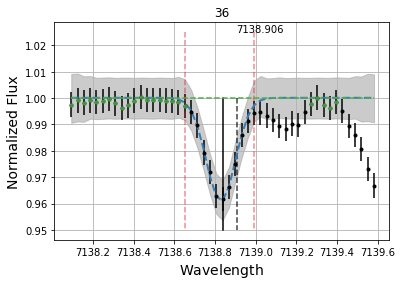

#-----------------------#
line to measure: Ca I 7326.145 - Line found: 7326.04799529982
7326.145 9.25 26.65 simps-int: 6.23 12.03


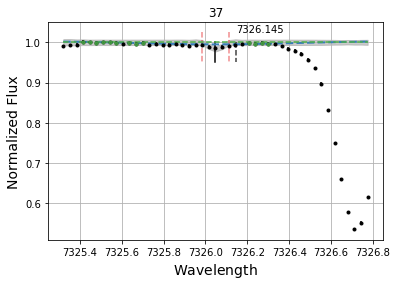

#-----------------------#
line to measure: N I 7468.313 - Line found: 7468.263538346443
7468.313 2.54 0.6 simps-int: 2.54 0.58


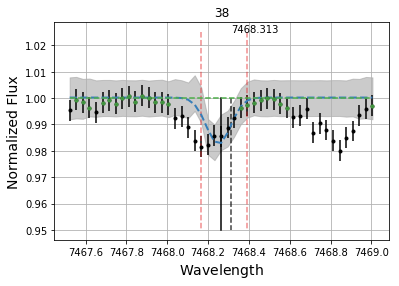

#-----------------------#
line to measure: Si I 7405.772 - Line found: 7405.686647353003
7405.772 91.53 0.58 simps-int: 91.52 0.58


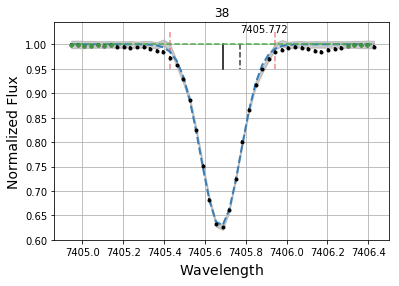

#-----------------------#
line to measure: Cr I 7400.249 - Line found: 7400.173690959454
7400.249 28.74 0.39 simps-int: 28.74 0.39


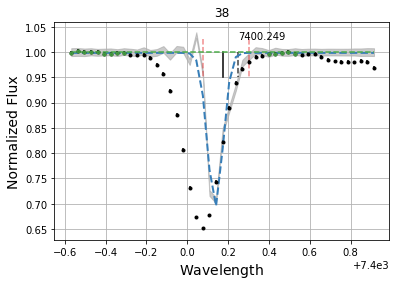

#-----------------------#
line to measure: O I 7775.39 - Line found: 7775.293600265908
7775.39 47.24 1.28 simps-int: 47.14 3.27


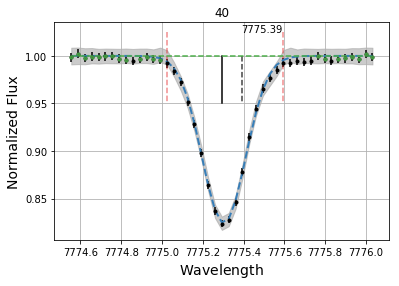

#-----------------------#
line to measure: O I 7774.17 - Line found: 7774.0853680778855
7774.17 61.7 0.81 simps-int: 61.69 0.81


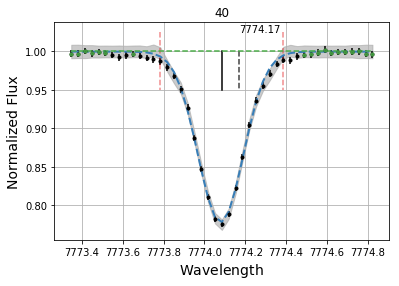

#-----------------------#
line to measure: O I 7771.94 - Line found: 7771.870275733178
7771.94 69.63 0.76 simps-int: 69.62 0.76


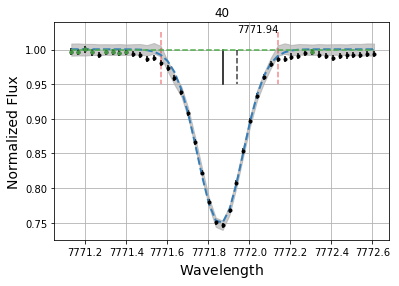

#-----------------------#
line to measure: K I 7698.98 - Line found: 7698.906476378706
7698.98 157.78 0.59 simps-int: 157.76 0.59


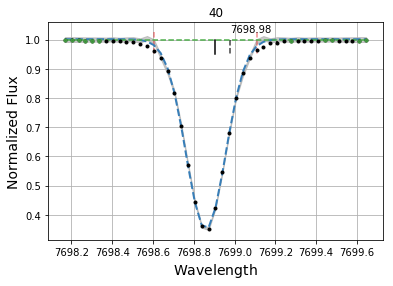

#-----------------------#


In [36]:

plot_lines = HebeA.lines
HebeA.measure_all_ew(plot_lines = plot_lines)

In [37]:
HebeA.check_for_flags()

5052.167 has more than a 10% error 3.84
5052.167 might have a bad fit 0.003357847819597463
5380.337 has more than a 10% error 28.67
7111.469 has more than a 10% error 6.53
7468.313 has more than a 10% error 0.6
6300.304 has more than a 10% error 9.87
5682.633 might have a bad fit 0.01440995674711183
5711.088 might have a bad fit 0.001817537778384648
4730.029 might have a bad fit 0.0023488834891484053
6965.409 has more than a 10% error 9.06
6841.19 has more than a 10% error 16.77
5701.104 might have a bad fit 0.0010942971905637691
5708.4 might have a bad fit 0.0035111108696352974
6848.58 has more than a 10% error 18.33
6848.58 might have a bad fit 0.0019400106616771142
6414.98 might have a bad fit 0.004510659665025266
4694.113 might have a bad fit 0.023720300773990503
7698.98 might have a bad fit 0.0018435280111142886
6169.042 might have a bad fit 0.0017936826031721257
6161.297 might have a bad fit 0.001039924877805721
6169.563 might have a bad fit 0.0025283839577090682
7326.145 has mor

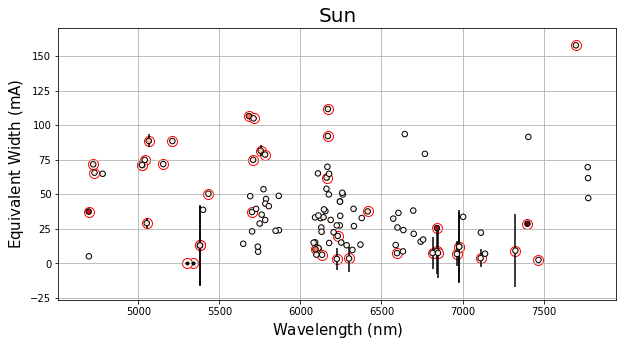

In [38]:
plot_line_info(HebeA, 'Sun')

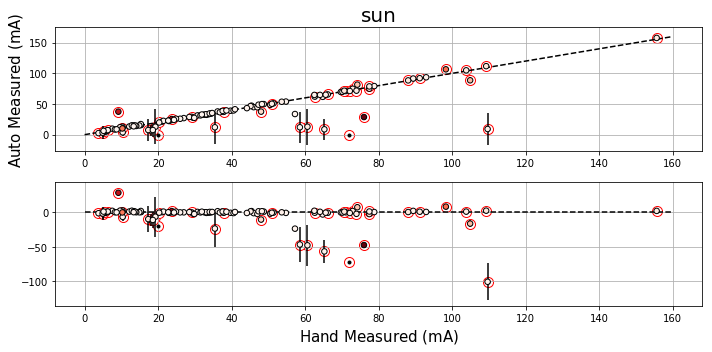

In [40]:
plot_comparison_res(HebeA, ews, 'sun', xy = [0,160])

In [17]:
HebeA.wavelength, HebeA.flux

(array([[4063.48443356, 4063.50208388, 4063.51973419, ..., 4135.0035102 ,
         4135.02116052, 4135.03881083],
        [4110.715055  , 4110.73292077, 4110.75078654, ..., 4183.10716378,
         4183.12502955, 4183.14289532],
        [4159.05380104, 4159.07188724, 4159.08997343, ..., 4232.33906283,
         4232.35714903, 4232.37523522],
        ...,
        [7855.3758723 , 7855.41012612, 7855.44437994, ..., 7994.1723409 ,
         7994.20659472, 7994.24084854],
        [8034.02921552, 8034.06417648, 8034.09913745, ..., 8175.6910419 ,
         8175.72600287, 8175.76096383],
        [8221.01412582, 8221.04980774, 8221.08548966, ..., 8365.59726316,
         8365.63294508, 8365.668627  ]]),
 array([[ 76253.81 ,  61313.637,  47525.54 , ...,  54989.477,  66998.75 ,
          74318.586],
        [118379.5  , 122597.4  , 123375.8  , ...,  51979.516,  55972.008,
          59270.6  ],
        [114849.34 , 112409.984, 109240.91 , ..., 122320.62 ,  69164.69 ,
          70606.86 ],
        ...,


In [18]:
np.save('Hebe_x', HebeA.wavelength)
np.save('Hebe_y', HebeA.flux)